In [61]:
import multiprocessing as mp
mp.set_start_method("spawn", force=True)

In [62]:
### automatically refresh the buffer
%load_ext autoreload
%autoreload 2

### solve the auto-complete issue

%config Completer.use_jedi = False
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter(action='ignore', category=FutureWarning)

### lvl 2 setups (systerm)
import os
import numpy as np
import pandas as pd
import xarray as xr

import matplotlib as mpl
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap,LinearSegmentedColormap,BoundaryNorm
import matplotlib.dates as mdates
import geopandas as gpd
from shapely.geometry import Point
from datetime import datetime


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Read dataset: 
- ds_a -- aerosol relateted dataset
- ds_c -- luquid water pathway
- ds_c_h -- resampled cloud height: top height bese height

In [3]:
ds_a = xr.open_mfdataset('/data/ggong/ARM_monthly/SGP/rlproffex1thorC1/*.nc')
# ds_c = xr.open_mfdataset('/data/ggong/ARM_monthly/SGP/mwrret2turnC1/*.nc')
ds_c_h = xr.open_mfdataset('/data/ggong/ARM_monthly/SGP/cloud_height_resample.nc')

full_time = pd.date_range("2016-01-01", "2023-12-31 23:58:00", freq="2min")
ds_a = ds_a.reindex(time=full_time) # 由于ds_a 有缺失数据，补齐ds_a的缺失数据时间轴
ds_mete = xr.open_dataset('/data/ggong/ARM_monthly/SGP/RH_T_VWS_LTS_2min.nc')
ds_vv = xr.open_dataset('/data/ggong/ARM_monthly/SGP/VV_2min_750_850.nc')
ds_vv600 = xr.open_dataset('/data/ggong/ARM_monthly/SGP/VV_2min_600.nc')
ds_p = xr.open_dataset('/data/ggong/ARM_monthly/SGP/vdis_qc_rain_rate.nc')
RR   =  ds_p.rain_rate.values

ds_lwp = xr.open_dataset('/data/ggong/ARM_monthly/SGP/ds_lwp_2min_gap10min_nan.nc')
lwp = ds_lwp.phys_lwp.values

ds_mete2 = xr.open_dataset('/data/ggong/ARM_monthly/SGP/RH34_T34_Tsurf_Windsurf_2min.nc')
ds_lts = xr.open_dataset('/data/ggong/ARM_monthly/SGP/LTS_cloud_top_plus.nc')
ds_lts2 = xr.open_dataset('/data/ggong/ARM_monthly/SGP/LTS_cloud_top_plus_2.nc')

In [4]:
df_top = pd.read_csv('/data/ggong/ARM_monthly/SGP/csv_file/df_top.csv')
df_middle = pd.read_csv('/data/ggong/ARM_monthly/SGP/csv_file/df_middle.csv')
df_bottom = pd.read_csv('/data/ggong/ARM_monthly/SGP/csv_file/df_bottom.csv')

In [5]:
fm = ds_a['feature_mask']          # dims: time, height_high
z  = ds_a['height_high']

# —— 直接选取 3 km 以下的层 ——
fm_low = fm.sel(height_high=z[z < 3.0])

# —— 计算逐时刻 Cloud Fraction ——
cf = (fm_low == 21).mean(dim='height_high').values

## Cloud Height / Thickness quality control

In [6]:
# === Step 1–4 (合并版): 单层云 → 派生量 → QC(<8 km) → 云顶温度 → 暖云筛选 ===
import numpy as np
import xarray as xr

# 1) 取单层云的 base/top，并派生 thickness / mean height
clb_km = ds_c_h["cloud_layer_base_height"] / 1000.0
clt_km = ds_c_h["cloud_layer_top_height"]  / 1000.0

valid_layer = (
    np.isfinite(clb_km) & np.isfinite(clt_km) &
    (clb_km >= 0) & (clt_km >= 0)
)
n_layers = valid_layer.sum(dim="layer")                    # 每个时刻有效层数
sel_idx  = valid_layer.astype(int).argmax(dim="layer")     # 有效层的“位置”
sel_idx  = sel_idx.where(n_layers == 1)                    # 只保留单层云，其他 NaN

def take_by_idx(arr_1d, idx_scalar):
    if np.isnan(idx_scalar):
        return np.nan
    return arr_1d[int(idx_scalar)]

clb_1 = xr.apply_ufunc(
    take_by_idx, clb_km, sel_idx,
    input_core_dims=[["layer"], []],
    output_core_dims=[[]],
    vectorize=True, dask="parallelized",
    output_dtypes=[clb_km.dtype],
).rename("cloud_base_height")

clt_1 = xr.apply_ufunc(
    take_by_idx, clt_km, sel_idx,
    input_core_dims=[["layer"], []],
    output_core_dims=[[]],
    vectorize=True, dask="parallelized",
    output_dtypes=[clt_km.dtype],
).rename("cloud_top_height")

cloud_thickness = (clt_1 - clb_1).rename("cloud_geometric_thickness")
cloud_mean_h    = ((clt_1 + clb_1) * 0.5).rename("cloud_mean_height")

# 2) QC：base/top < 8 km
qc_mask = (clb_1 < 8.0) & (clt_1 < 8.0)

clb_qc = clb_1.where(qc_mask)
clt_qc = clt_1.where(qc_mask)
thk_qc = cloud_thickness.where(qc_mask)
mhn_qc = cloud_mean_h.where(qc_mask)

# 3) 计算云顶温度（按云顶高度在 ds_a 的 height_high 上做“最近邻”索引；全向量化）
heights = ds_a["height_high"].values              # (H,)
cth     = clt_qc.values                           # (T,)

T = len(cth)
idx = np.full(T, np.nan, dtype=float)

mask_cth = np.isfinite(cth)
# 对每个有效时刻，找与云顶高度最接近的垂直层索引
idx[mask_cth] = np.abs(heights[np.newaxis, :] - cth[mask_cth, np.newaxis]).argmin(axis=1).astype(float)

# 根据 idx 取出温度
temp2d   = ds_a["temperature"].values            # (T, H)
temp_cth = np.full(T, np.nan, dtype=np.float32)
valid_idx = ~np.isnan(idx)
temp_cth[valid_idx] = temp2d[np.arange(T)[valid_idx], idx[valid_idx].astype(int)]

temperature_at_cth = xr.DataArray(
    temp_cth, coords={"time": clt_qc.time}, dims="time", name="temperature_at_cth"
)

# 4) 组装数据集并进行“暖云”筛选
ds_cloud_heights = xr.Dataset(
    {
        "cloud_base_height": clb_qc,
        "cloud_top_height": clt_qc,
        "cloud_geometric_thickness": thk_qc,
        "cloud_mean_height": mhn_qc,
        "temperature_at_cth": temperature_at_cth,
    }
)

T_WARM = 273.15
warm_mask = ds_cloud_heights["temperature_at_cth"] > T_WARM
ds_cloud_heights = ds_cloud_heights.where(warm_mask)


## Dust Height / Thickness quality control

In [7]:
# ===== 参数 =====
valid_classes = [3, 9, 21, 37]   
aerosol_class = 3
cloud_class = 21

dep_m  = 0.0049
dep_d  = 0.31
dep_nd = 0.15
T_K_WARM = 273.15

hmin_km, hmax_km = 0.03, 8.0

# ====================== QC ======================
mask_qc = (ds_a["detection_confidence_score_total"] >= 0.3) & (ds_a["qc_profile"] == 0)

feature_mask = ds_a["feature_mask"].where(mask_qc)
pdr_meas     = ds_a["depolarization_ratio"].where(mask_qc)
ext          = ds_a["extinction_be"].where(mask_qc)
sca          = ds_a["scattering_ratio_e"].where(mask_qc)
temp_qc      = ds_a["temperature"].where(mask_qc)

# ====================== keep valid class ======================
mask_class = xr.zeros_like(feature_mask, dtype=bool)
for val in valid_classes:
    mask_class = mask_class | (feature_mask == val)

feature_mask = feature_mask.where(mask_class)
pdr_meas     = pdr_meas.where(mask_class)
ext          = ext.where(mask_class)
sca          = sca.where(mask_class)
temp_qc      = temp_qc.where(mask_class)  

# ====================== height limitation > 30 m ======================
mask_height = (ds_a["height_high"] >= hmin_km) & (ds_a["height_high"] <= hmax_km)
feature_mask = feature_mask.where(mask_height)
pdr_meas     = pdr_meas.where(mask_height)
ext          = ext.where(mask_height)
sca          = sca.where(mask_height)
temp_qc      = temp_qc.where(mask_height)

# ====================== aerosol-only mask ======================
aerosol_mask = feature_mask == aerosol_class
pdr_meas_aerosol = pdr_meas.where(aerosol_mask)
sca_aerosol      = sca.where(aerosol_mask)
ext_aerosol      = ext.where(aerosol_mask)

# ====================== cloud-only mask and cloud extinction ======================
cloud_mask_warm = (feature_mask == cloud_class) & (temp_qc >= T_K_WARM)
ext_cloud = ext.where(cloud_mask_warm)                 
ext_cloud = ext_cloud.where(ext_cloud > 0)           

# 发现有极大值，超过30000，非常不符合常理，因此设置阈值
# ---- 云：阈值 20 km^-1 ----
ext_cloud = ext_cloud.where(ext_cloud <= 20)

# ====================== calculate PDR ======================
tepo = sca_aerosol + (sca_aerosol * dep_m) - dep_m
xnum = tepo * pdr_meas_aerosol - dep_m
xden = sca_aerosol - 1 + (sca_aerosol * dep_m) - pdr_meas_aerosol
pdr = xnum / xden

# ====================== calculate dust fraction ======================
dust_frac = ((pdr - dep_nd) * (1 + dep_d)) / ((dep_d - dep_nd) * (1 + pdr))
dust_frac = dust_frac.where(pdr < dep_d, 1.0)
dust_frac = dust_frac.where(pdr > dep_nd, 0.0)
dust_frac = dust_frac.where(aerosol_mask)

# ====================== dust / non-dust extinction ======================
ext_dust    = (dust_frac * ext_aerosol)
ext_nondust = (1 - dust_frac) * ext_aerosol

# 再保险 clip 一下，避免少数极端值：
ext_dust    = ext_dust.clip(min=0).where(ext_dust <= 1)
ext_nondust = ext_nondust.clip(min=0).where(ext_nondust <= 1)

# 发现有极大值，超过30000，非常不符合常理，因此设置阈值
# ---- 气溶胶相关：阈值 1 km^-1 ----
ext_aerosol  = ext_aerosol.where(ext_aerosol <= 1)
ext_dust     = ext_dust.where(ext_dust <= 1)
ext_nondust  = ext_nondust.where(ext_nondust <= 1)


# ====================== column AOD / COD ======================
ext_units = (ext.attrs.get("units","") or "").replace(" ","").lower()
if any(u in ext_units for u in ["m-1", "1/m", "m^-1", "/m"]):
    z_int = ds_a["height_high"] * 1000.0   # m
else:
    z_int = ds_a["height_high"]            # km

dz  = xr.concat([z_int.isel(height_high=0), z_int.diff("height_high")], dim="height_high")
dz2d = xr.DataArray(dz, dims=["height_high"], coords={"height_high": ds_a["height_high"]}).broadcast_like(ext)

AOD         = (ext_aerosol.clip(min=0) * dz2d).sum(dim="height_high")
dust_AOD    = (ext_dust * dz2d).sum(dim="height_high")
nondust_AOD = (ext_nondust * dz2d).sum(dim="height_high")

COD = (ext_cloud * dz2d).sum(dim="height_high")


In [8]:
# ===================================================================
# =============== 主尘层识别 + 高度特征计算（dust_*） ================
# ===================================================================

# 高度坐标（km）
z = ds_a["height_high"].values.astype(float)

# 相邻层厚（km），用于积分权重
dz_km = np.empty_like(z, dtype=float)
if len(z) < 2:
    raise ValueError("height_high 维度长度不足，无法计算 dz")
dz_km[0]  = (z[1] - z[0])
dz_km[1:] = np.diff(z)

# 只保留正的 dust extinction；NaN 保留为缺测
dust_ext = xr.where(ext_dust > 0, ext_dust, np.nan)
dust_mask_arr = xr.where(ext_dust > 0, True, False).fillna(False).values  # (time, height)
dust_ext_arr  = dust_ext.values                                           # (time, height)

T, H = dust_mask_arr.shape

base_km  = np.full(T, np.nan, dtype=float)  # dust_base_height
top_km   = np.full(T, np.nan, dtype=float)  # dust_top_height
mean_km  = np.full(T, np.nan, dtype=float)  # dust_mean_height = (base+top)/2
scale_km = np.full(T, np.nan, dtype=float)  # dust_scale_height (e-fold above base)
cent_km  = np.full(T, np.nan, dtype=float)  # dust_centroid_height (ext-weighted)

for t in range(T):
    m = dust_mask_arr[t]   # bool profile
    e = dust_ext_arr[t]    # dust extinction profile

    if not np.any(m):
        continue

    # ---- 找到所有连续 True 的尘层段 ----
    mm = m.astype(int)
    edges  = np.diff(np.concatenate(([0], mm, [0])))
    starts = np.where(edges == 1)[0]
    ends   = np.where(edges == -1)[0] - 1  # inclusive

    if starts.size == 0:
        continue

    # ---- 选“主尘层”：层内 dust AOD（∑ ext_dust * dz_km）最大的段 ----
    best_idx = None
    best_int = -np.inf
    for s, eidx in zip(starts, ends):
        layer_ext = dust_ext_arr[t, s:eidx+1]
        layer_dz  = dz_km[s:eidx+1]
        integ = np.nansum(layer_ext * layer_dz)
        if np.isfinite(integ) and (integ > best_int):
            best_int = integ
            best_idx = (s, eidx)

    if best_idx is None:
        continue

    s, eidx = best_idx
    base_km[t] = z[s]
    top_km[t]  = z[eidx]
    mean_km[t] = 0.5 * (base_km[t] + top_km[t])

    # ---- 质心（主尘层内的 dust extinction 加权）: ∫z*ext*dz / ∫ext*dz ----
    layer_ext = dust_ext_arr[t, s:eidx+1]
    layer_z   = z[s:eidx+1]
    layer_dz  = dz_km[s:eidx+1]

    m_valid = np.isfinite(layer_ext) & (layer_ext > 0)
    if np.count_nonzero(m_valid) > 0:
        num = np.nansum(layer_ext[m_valid] * layer_z[m_valid] * layer_dz[m_valid])
        den = np.nansum(layer_ext[m_valid] *                 layer_dz[m_valid])
        if den > 0 and np.isfinite(num):
            cent_km[t] = num / den

    # ---- 尺度高度：自层底 ext0 衰减到 ext0/e 的高度差（log 空间线性插值）----
    valid0 = np.where(np.isfinite(layer_ext) & (layer_ext > 0))[0]
    if valid0.size == 0:
        continue

    s0 = valid0[0]
    ext0 = layer_ext[s0]
    target = ext0 / np.e
    eps = 1e-12
    found = False

    for k in range(s0, len(layer_ext) - 1):
        y1, y2 = layer_ext[k], layer_ext[k+1]
        if not (np.isfinite(y1) and np.isfinite(y2) and y1 > eps and y2 > eps):
            continue
        if (y1 >= target and y2 <= target) or (y1 <= target and y2 >= target):
            z1, z2   = layer_z[k], layer_z[k+1]
            ly1, ly2 = np.log(y1), np.log(y2)
            ltar     = np.log(target)
            frac = (ltar - ly1) / (ly2 - ly1) if ly2 != ly1 else 0.0
            z_star = z1 + frac * (z2 - z1)
            scale_km[t] = z_star - layer_z[s0]
            found = True
            break

    if not found:
        y_top = layer_ext[-1]
        if np.isfinite(y_top) and y_top > eps and ext0 > eps and (ext0 / y_top) > 1.0:
            scale_km[t] = (layer_z[-1] - layer_z[s0]) / np.log(ext0 / y_top)
        else:
            scale_km[t] = np.nan

# ====================== 打包结果 ======================
time_coord = ds_a["time"]
ds_dust_heights = xr.Dataset(
    data_vars=dict(
        dust_base_height = xr.DataArray(base_km, coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust layer base height (main dust layer)"}),
        dust_top_height  = xr.DataArray(top_km,  coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust layer top height (main dust layer)"}),
        dust_mean_height = xr.DataArray(mean_km, coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Mean dust height μ=(base+top)/2 (main dust layer)"}),
        dust_scale_height= xr.DataArray(scale_km,coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust scale height H (e-fold above base, main dust layer)"}),
        dust_centroid_height = xr.DataArray(cent_km, coords={"time": time_coord}, dims="time",
            attrs={"units":"km","long_name":"Dust extinction-weighted centroid height (main dust layer)"}),
    )
)

# （可选）附加层厚 ΔZ
ds_dust_heights["dust_layer_thickness"] = (
    ds_dust_heights["dust_top_height"] - ds_dust_heights["dust_base_height"]
)
ds_dust_heights["dust_layer_thickness"].attrs.update(
    {"units":"km","long_name":"Dust layer thickness ΔZ"}
)


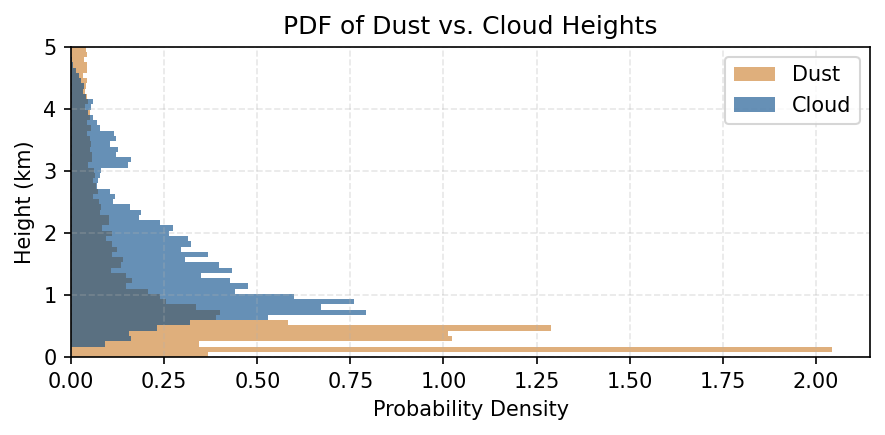

In [9]:
# ===== 数据准备 =====
dust_mean_height  = ds_dust_heights["dust_mean_height"].values
dust_mean_height  = dust_mean_height[np.isfinite(dust_mean_height)]

cloud_mean_height = ds_cloud_heights["cloud_mean_height"].values
cloud_mean_height = cloud_mean_height[np.isfinite(cloud_mean_height)]

bins = np.linspace(0, 5, 60)

# ===== 绘图 =====
fig, ax = plt.subplots(figsize=(6,3), dpi=150)

ax.hist(
    dust_mean_height, bins=bins, density=True, orientation="horizontal",
    alpha=0.6, color="#cb7b25", edgecolor=None, label="Dust"
)
ax.hist(
    cloud_mean_height, bins=bins, density=True, orientation="horizontal",
    alpha=0.6, color="#014686", edgecolor=None, label="Cloud"
)

ax.set_ylabel("Height (km)")
ax.set_xlabel("Probability Density")
ax.set_ylim(0, 5)
ax.set_title("PDF of Dust vs. Cloud Heights")
ax.legend()
ax.grid(alpha=0.3, ls='--')

plt.tight_layout()
plt.show()


## Aerosol-cloud collocation

In [10]:
dust_top_height  = ds_dust_heights["dust_top_height"].values
dust_base_height  = ds_dust_heights["dust_base_height"].values
dust_thickness = ds_dust_heights["dust_layer_thickness"].values
dust_mean_height = ds_dust_heights["dust_mean_height"].values

cloud_top_height  = ds_cloud_heights["cloud_top_height"].values
cloud_base_height  = ds_cloud_heights["cloud_base_height"].values
cloud_thickness = ds_cloud_heights["cloud_geometric_thickness"].values
cloud_mean_height = ds_cloud_heights["cloud_mean_height"].values

### Count the number of times each duration occurs

In [11]:
# 建立 mask: 只在所有都非 NaN 时为 True
valid_mask = (~np.isnan(dust_top_height) &
              ~np.isnan(dust_base_height) &
              ~np.isnan(cloud_top_height) &
              ~np.isnan(cloud_base_height))

# 初始化输出数组（复制一份原始数组）
dust_top_height_new  = dust_top_height.copy()
dust_base_height_new = dust_base_height.copy()
dust_mean_height_new = dust_mean_height.copy()
dust_thickness_new = dust_thickness.copy()

cloud_top_height_new = cloud_top_height.copy()
cloud_base_height_new = cloud_base_height.copy()
cloud_mean_height_new = cloud_mean_height.copy()
cloud_thickness_new = cloud_thickness.copy()

# 把无效位置全部设为 NaN
dust_top_height_new[~valid_mask]  = np.nan
dust_base_height_new[~valid_mask] = np.nan
dust_mean_height_new[~valid_mask]  = np.nan
dust_thickness_new[~valid_mask] = np.nan

cloud_top_height_new[~valid_mask] = np.nan
cloud_base_height_new[~valid_mask] = np.nan
cloud_mean_height_new[~valid_mask] = np.nan
cloud_thickness_new[~valid_mask] = np.nan

In [12]:
import numpy as np

arr = dust_top_height_new  # 你的数组

# 掩膜：True 表示非 NaN
mask = ~np.isnan(arr)

# 找片段边界
diff = np.diff(mask.astype(int))
starts = np.where(diff == 1)[0] + 1
ends   = np.where(diff == -1)[0]

if mask[0]:
    starts = np.r_[0, starts]
if mask[-1]:
    ends = np.r_[ends, len(arr)-1]

# 每个片段的长度
lengths = ends - starts + 1

# 统计
max_len = lengths.max() if len(lengths) > 0 else 0
arr_counts = np.zeros(max_len, dtype=int)

for L in lengths:
    arr_counts[L-1] += 1


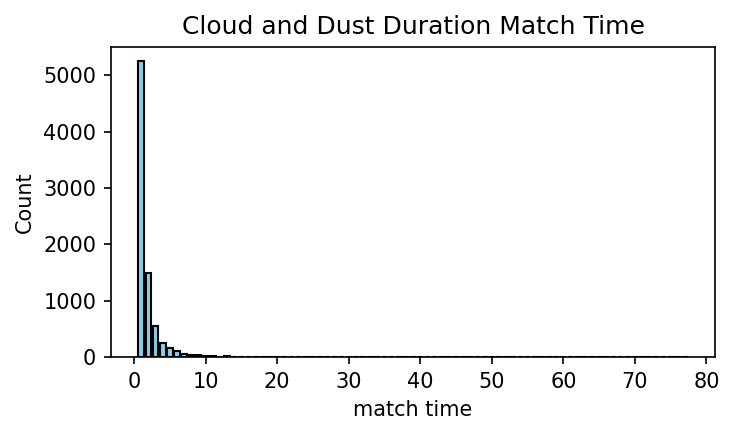

In [13]:
x = np.arange(1, max_len+1)
y = arr_counts

fig, ax = plt.subplots(figsize=(5,3), dpi=150)
ax.bar(x, y, color="skyblue", edgecolor="k")  

ax.set_xlabel("match time")
ax.set_ylabel("Count")
ax.set_title("Cloud and Dust Duration Match Time")

plt.tight_layout()
plt.show()

In [14]:
mask = (~np.isnan(dust_top_height_new) &
        ~np.isnan(dust_base_height_new) &
        ~np.isnan(cloud_top_height_new) &
        ~np.isnan(cloud_base_height_new))

## Criterion: Cloud top height <= 3 km

In [15]:
# === Step 1: 构建统一掩膜，找到事件 ===
mask = (~np.isnan(dust_top_height_new) &
        ~np.isnan(dust_base_height_new) &
        ~np.isnan(cloud_top_height_new) &
        ~np.isnan(cloud_base_height_new))

# 找连续非NaN的段落
diff = np.diff(mask.astype(int))
starts = np.where(diff == 1)[0] + 1
ends   = np.where(diff == -1)[0]
if mask[0]:
    starts = np.r_[0, starts]
if mask[-1]:
    ends = np.r_[ends, len(mask)-1]

# === Step 2: 定义统计结果 ===
categories = {"top": 0, "bottom": 0, "middle": 0, "decreasing": 0, "increasing": 0}

# === Step 3: 遍历每个事件，取平均值并分类 ===
for s, e in zip(starts, ends):
    # 当前事件的平均高度
    d_top = np.nanmean(dust_top_height_new[s:e+1])
    d_base = np.nanmean(dust_base_height_new[s:e+1])
    c_top = np.nanmean(cloud_top_height_new[s:e+1])
    c_base = np.nanmean(cloud_base_height_new[s:e+1])

    # 👉 只统计 c_top <= 3.0 km 的事件
    if c_top > 3.0:
        continue

    # 规则判断
    if d_base - c_top > 0.1:
        categories["top"] += 1
    elif c_base - d_top > 0.1:
        categories["bottom"] += 1
    elif (c_base - 0.1 < d_base) and (c_top + 0.1 > d_top):
        categories["middle"] += 1
    # elif (c_base - 0.1 < d_top < c_top + 0.1) and (d_base < c_base - 0.1):
    #     categories["decreasing"] += 1
    # elif (c_base - 0.1 < d_base < c_top + 0.1) and (d_top > c_top + 0.1):
    #     categories["increasing"] += 1

# === Step 4: 输出统计结果 ===
print("事件分类统计：")
for k, v in categories.items():
    print(f"{k}: {v}")

事件分类统计：
top: 722
bottom: 3083
middle: 1697
decreasing: 0
increasing: 0


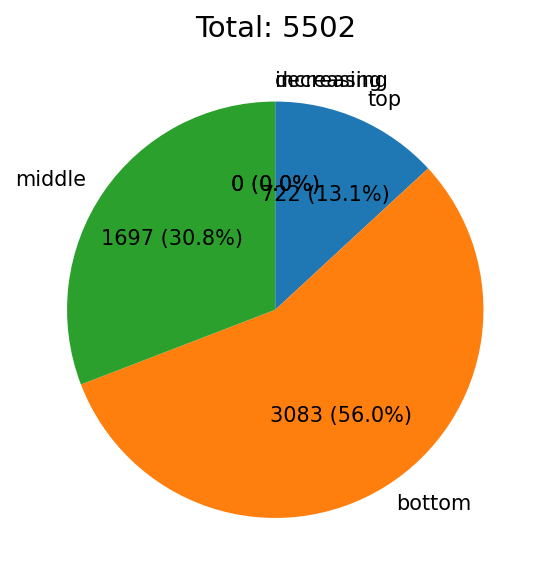

In [16]:
labels = list(categories.keys())
sizes = list(categories.values())
total = sum(sizes)

def make_autopct(sizes):
    def my_autopct(pct):
        count = int(round(pct*total/100.0))
        return f"{count} ({pct:.1f}%)"
    return my_autopct

fig, ax = plt.subplots(figsize=(4,4), dpi=150)
wedges, texts, autotexts = ax.pie(
    sizes,
    labels=labels,
    autopct=make_autopct(sizes),
    startangle=90,
    counterclock=False
)

for text in texts + autotexts:
    text.set_fontsize(10)

ax.set_title(f"Total: {total}", fontsize=14)

plt.tight_layout()
plt.show()



## get the time and height data for run hysplit

In [18]:
import numpy as np
import pandas as pd

# === 时间序列（2 min 分辨率）===
time = pd.date_range("2016-01-01 00:00:00", "2023-12-31 23:58:00", freq="2min")
time = pd.to_datetime(time)

# === 有效数据掩码 ===
mask = (~np.isnan(dust_top_height_new) &
        ~np.isnan(dust_base_height_new) &
        ~np.isnan(cloud_top_height_new) &
        ~np.isnan(cloud_base_height_new))

# === 连续事件起止索引 ===
diff = np.diff(mask.astype(int))
starts = np.where(diff == 1)[0] + 1
ends   = np.where(diff == -1)[0]

if mask[0]:
    starts = np.r_[0, starts]
if mask[-1]:
    ends = np.r_[ends, len(mask) - 1]

# === 结果容器 ===
rows_top, rows_bottom, rows_middle = [], [], []

# === 主循环 ===
for s, e in zip(starts, ends):

    d_top  = np.nanmean(dust_top_height_new[s:e+1])
    d_base = np.nanmean(dust_base_height_new[s:e+1])
    c_top  = np.nanmean(cloud_top_height_new[s:e+1])
    c_base = np.nanmean(cloud_base_height_new[s:e+1])

    # 只保留低云
    if c_top > 3.0:
        continue

    dust_mean_height = (d_base + d_top) / 2.0

    # === 时间均值（纳秒级）→ 四舍五入到整秒 ===
    t_slice = time[s:e+1].to_numpy(dtype="datetime64[ns]").astype("int64")
    t_mean  = pd.to_datetime(int(np.mean(t_slice)), unit="ns").round("1s")

    row = {
        "year":   t_mean.year,
        "month":  t_mean.month,
        "day":    t_mean.day,
        "hour":   t_mean.hour,
        "minute": t_mean.minute,
        "second": t_mean.second,     # ✅ 精确到秒（已 round）
        "dust_mean_height": dust_mean_height
    }

    # === dust–cloud 相对位置分类 ===
    if d_base - c_top > 0.1:
        rows_top.append(row)
    elif c_base - d_top > 0.1:
        rows_bottom.append(row)
    elif (c_base - 0.1 < d_base) and (c_top + 0.1 > d_top):
        rows_middle.append(row)

# === 转为 DataFrame ===
df_top    = pd.DataFrame(rows_top)
df_bottom = pd.DataFrame(rows_bottom)
df_middle = pd.DataFrame(rows_middle)

print("Top events:", len(df_top))
print("Bottom events:", len(df_bottom))
print("Middle events:", len(df_middle))
print(df_top.head())


Top events: 722
Bottom events: 3083
Middle events: 1697
   year  month  day  hour  minute  second  dust_mean_height
0  2016      3    1     7      27       0           2.27625
1  2016      3    8     0      26       0           1.68375
2  2016      3    8     7       0       0           1.84875
3  2016      3    9     1       8       0           1.96875
4  2016      3   18    20      16       0           1.57875


### Violin Plot (mean height and thickness)

In [37]:
import numpy as np

# 类别映射
class_map = {"top": 0, "bottom": 1, "middle": 2, "decreasing": 3, "increasing": 4}
cat_names = list(class_map.keys())

# 初始化标签数组（与原始数据同长度）
labels = np.full(mask.shape, np.nan, dtype=float)
event_counts = {k: 0 for k in class_map.keys()}

# 遍历每个事件段，分类并打标签
for s, e in zip(starts, ends):
    d_top  = np.nanmean(dust_top_height_new[s:e+1])
    d_base = np.nanmean(dust_base_height_new[s:e+1])
    c_top  = np.nanmean(cloud_top_height_new[s:e+1])
    c_base = np.nanmean(cloud_base_height_new[s:e+1])

    if c_top > 3.0:
        continue
        
    cat = None
    if d_base - c_top > 0.1:
        cat = "top"
    elif c_base - d_top > 0.1:
        cat = "bottom"
    elif (c_base - 0.1 < d_base) and (c_top + 0.1 > d_top):
        cat = "middle"
    elif (c_base - 0.1 < d_top < c_top + 0.1) and (d_base < c_base - 0.1):
        cat = "decreasing"
    elif (c_base - 0.1 < d_base < c_top + 0.1) and (d_top > c_top + 0.1):
        cat = "increasing"

    if cat is not None:
        labels[s:e+1] = class_map[cat]
        event_counts[cat] += 1


## Lag and ahead condition

In [38]:
# 初始化输出数组（复制一份原始数组）
dust_top_height2  = dust_top_height.copy()
dust_base_height2 = dust_base_height.copy()
dust_mean_height2 = dust_mean_height.copy()
dust_thickness2 = dust_thickness.copy()

cloud_top_height2 = cloud_top_height.copy()
cloud_base_height2 = cloud_base_height.copy()
cloud_mean_height2 = cloud_mean_height.copy()
cloud_thickness2 = cloud_thickness.copy()

In [32]:
import numpy as np, pandas as pd

PAD=20; rel=np.arange(-PAD,PAD+1)
class_map={"top":0,"bottom":1,"middle":2}
vars_dict={"dust_top_height2":dust_top_height2,"dust_base_height2":dust_base_height2,"dust_thickness2":dust_thickness2,
          "cloud_top_height2":cloud_top_height2,"cloud_base_height2":cloud_base_height2,"cloud_thickness2":cloud_thickness2,
          "COD":COD,"dust_AOD":dust_AOD,"lwp":lwp}

labels=np.asarray(labels); N=len(labels)
A={k:np.asarray(v) for k,v in vars_dict.items()}
names=list(A)

def _comp(lbl):
    idx=np.where(labels==lbl)[0]  # ✅ 不用 np.isnan，NaN/None 自动排除
    if idx.size==0: return np.full((rel.size,len(names)),np.nan)
    cut=np.where(np.diff(idx)!=1)[0]; ss=np.r_[idx[0],idx[cut+1]]; ee=np.r_[idx[cut],idx[-1]]
    E=np.full((len(ss),rel.size,len(names)),np.nan,float)
    for i,(s,e) in enumerate(zip(ss.astype(int),ee.astype(int))):
        E[i,PAD,:]=[np.nanmean(A[n][s:e+1]) for n in names]               # lag=0：段内均值
        for k in range(1,PAD+1):
            if s-k>=0: E[i,PAD-k,:]=[A[n][s-k] for n in names]            # lag<0：seg_start 往前取
            if e+k<N:  E[i,PAD+k,:]=[A[n][e+k] for n in names]            # lag>0：seg_end 往后取
    return np.nanmean(E,axis=0)

df_comp=pd.concat({c:pd.DataFrame(_comp(lbl),index=rel,columns=names) for c,lbl in class_map.items()},axis=1)
df_comp.index.name="lag"



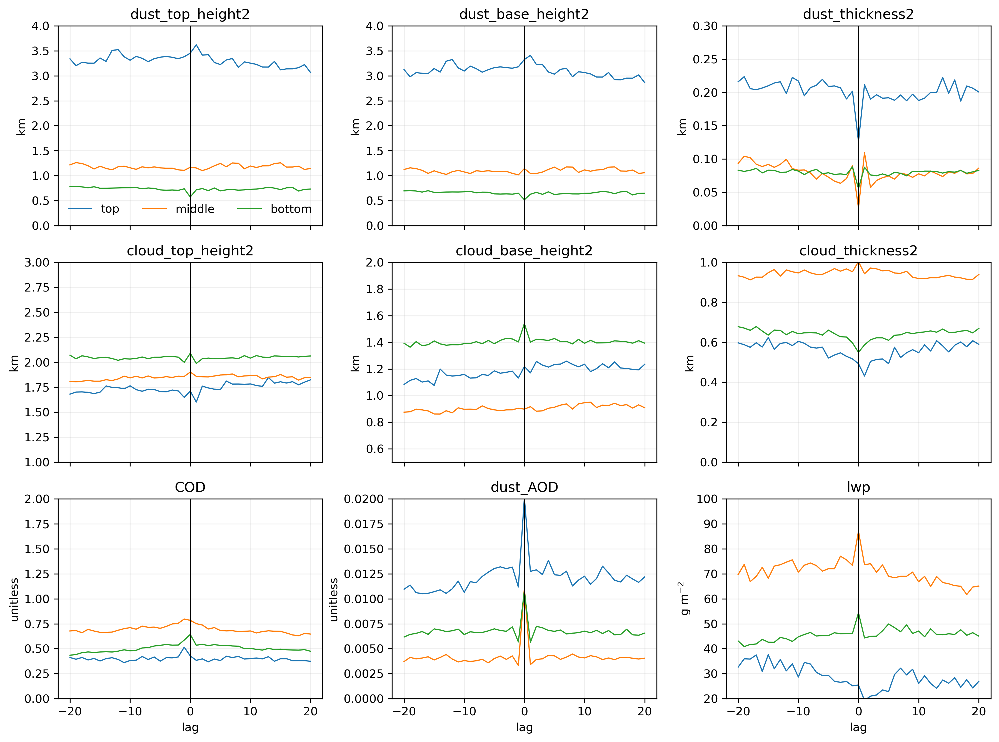

In [33]:
import matplotlib.pyplot as plt

classes = ["top","middle","bottom"]
lag = df_comp.index.values

vars9 = [
    "dust_top_height2", "dust_base_height2", "dust_thickness2",
    "cloud_top_height2","cloud_base_height2","cloud_thickness2",
    "COD","dust_AOD","lwp"
]

units = [
    "km","km","km",
    "km","km","km",
    "unitless","unitless","g m$^{-2}$"
]

ylims = [
    (0.,4.), (0.,4.), (0.,0.3),
    (1.,3.), (0.5,2), (0.,1.),
    (0,2.), (0.,0.02), (20.,100.)
]

fig, axes = plt.subplots(3, 3, figsize=(12, 9), dpi=300, sharex=True)
axes = axes.ravel()

for ax, v, u, yl in zip(axes, vars9, units, ylims):
    for c in classes:
        ax.plot(lag, df_comp[(c, v)], lw=1, label=c)
    ax.axvline(0, lw=0.8, color="k")
    ax.set_title(v)
    ax.set_ylabel(u)
    ax.set_ylim(*yl)
    ax.grid(alpha=0.2)

axes[0].legend(frameon=False, ncol=3)
for ax in axes[6:]:
    ax.set_xlabel("lag")

plt.tight_layout()
plt.show()

In [34]:
def calc_mean_lwc(lwp, thickness_km):

    lwp = np.asarray(lwp, dtype=float)
    thickness_km = np.asarray(thickness_km, dtype=float)

    thickness_m = thickness_km * 1000.0
    lwc = np.divide(lwp, thickness_m, out=np.full_like(lwp, np.nan), where=thickness_m > 0)
    
    return lwc

lwc = calc_mean_lwc(lwp, cloud_thickness_new)

In [40]:
def extract_event_means(labels, values, target_label):

    event_means = []
    current_event = []

    for lab, val in zip(labels, values):
        if lab == target_label:  # 属于目标类别
            current_event.append(val)
        else:  # 事件结束
            if current_event:  
                event_means.append(np.nanmean(current_event))
                current_event = []
    # 最后收尾
    if current_event:
        event_means.append(np.nanmean(current_event))

    return np.array(event_means)

#---------------------------------------------------------#

cloud_mh_by_cat = {}
dust_mh_by_cat  = {}
cloud_tn_by_cat = {}
dust_tn_by_cat = {}

dust_th_by_cat = {}
dust_bh_by_cat = {}
cloud_th_by_cat = {}
cloud_bh_by_cat = {}

COD_by_cat  = {}
DOD_by_cat  = {}
lwp_by_cat  = {}
lwc_by_cat  = {}
RR_by_cat   = {}
cf_by_cat   = {}
re_by_cat   = {}
for name in cat_names:
    
    lab_id = class_map[name]
    
    cloud_mh_by_cat[name] = extract_event_means(labels, cloud_mean_height_new, lab_id)
    dust_mh_by_cat[name]  = extract_event_means(labels, dust_mean_height_new, lab_id)
    cloud_tn_by_cat[name] = extract_event_means(labels, cloud_thickness_new, lab_id)
    dust_tn_by_cat[name]  = extract_event_means(labels, dust_thickness_new, lab_id)

    cloud_th_by_cat[name] = extract_event_means(labels, cloud_top_height_new, lab_id)
    dust_th_by_cat[name]  = extract_event_means(labels, dust_top_height_new, lab_id)
    cloud_bh_by_cat[name] = extract_event_means(labels, cloud_base_height_new, lab_id)
    dust_bh_by_cat[name]  = extract_event_means(labels, dust_base_height_new, lab_id)
    
    COD_by_cat[name]      = extract_event_means(labels, COD.values, lab_id)
    DOD_by_cat[name]      = extract_event_means(labels, dust_AOD.values, lab_id)
    lwp_by_cat[name]      = extract_event_means(labels, lwp, lab_id)
    lwc_by_cat[name]      = extract_event_means(labels, lwc, lab_id)
    RR_by_cat[name]       = extract_event_means(labels, RR, lab_id)
    cf_by_cat[name]       = extract_event_means(labels, cf, lab_id)

In [41]:
RH   =  ds_mete.RH_750_850.values
TEMP =  ds_mete.TEMP_750_850.values
VWS  =  ds_mete.VWS_725_925.values
LTS  =  ds_mete.LTS.values
VV   =  ds_vv.w_750_850.values
RR   =  ds_p.rain_rate.values

mask_valid = ~np.isnan(labels)

dust_AOD_valid = dust_AOD[mask_valid]
COD_valid      = COD[mask_valid]
lwp_valid      = lwp[mask_valid]
RH_valid       = RH[mask_valid]
TEMP_valid     = TEMP[mask_valid]
VWS_valid      = VWS[mask_valid]
LTS_valid      = LTS[mask_valid]
VV_valid       = VV[mask_valid]

RH_34   =  ds_mete2.RH_34.values
TEMP_34 =  ds_mete2.T_34.values
Wind_surf  =  ds_mete2.Wind_surf.values
TEMP_surf  =  ds_mete2.T_surf.values
VV_4   =  ds_vv600.w_600.values
lts_1 = ds_lts.LTS.values
lts_2 = ds_lts2.LTS.values

In [42]:
RH_by_cat = {}
TEMP_by_cat  = {}
VWS_by_cat = {}
LTS_by_cat = {}
VV_by_cat  = {}
RH_34_by_cat = {}
TEMP_34_by_cat  = {}
Wind_surf_by_cat = {}
TEMP_surf_by_cat = {}
VV_4_by_cat = {}
lts_1_by_cat = {}
lts_2_by_cat = {}
for name in cat_names:
    
    lab_id = class_map[name]
    
    RH_by_cat[name]    = extract_event_means(labels, RH, lab_id)
    TEMP_by_cat[name]  = extract_event_means(labels, TEMP, lab_id)
    VWS_by_cat[name]   = extract_event_means(labels, VWS, lab_id)
    LTS_by_cat[name]   = extract_event_means(labels, LTS, lab_id)
    VV_by_cat[name]    = extract_event_means(labels, VV, lab_id)

    RH_34_by_cat[name]    = extract_event_means(labels, RH_34, lab_id)
    TEMP_34_by_cat[name]  = extract_event_means(labels, TEMP_34, lab_id)
    Wind_surf_by_cat[name]   = extract_event_means(labels, Wind_surf, lab_id)
    TEMP_surf_by_cat[name]   = extract_event_means(labels, TEMP_surf, lab_id)
    VV_4_by_cat[name]  = extract_event_means(labels, VV_4, lab_id)
    lts_1_by_cat[name] = extract_event_means(labels, lts_1, lab_id)
    lts_2_by_cat[name] = extract_event_means(labels, lts_2, lab_id)

In [43]:
all_dicts = [
    cloud_mh_by_cat,
    dust_mh_by_cat,
    cloud_tn_by_cat,
    dust_tn_by_cat,
    cloud_th_by_cat,
    dust_th_by_cat,
    cloud_bh_by_cat,
    dust_bh_by_cat,
    COD_by_cat,
    DOD_by_cat,
    lwp_by_cat,
    lwc_by_cat,
    RR_by_cat,
    cf_by_cat,
]

categories = cloud_mh_by_cat.keys()  # ['top', 'bottom', ...]

for cat in categories:
    # 取该 category 下所有变量的数组
    arrays = [d[cat] for d in all_dicts]

    # 保证都是 numpy array
    arrays = [np.asarray(a, float) for a in arrays]

    # joint mask：只要有一个是 nan，就 False
    valid_mask = np.ones(len(arrays[0]), dtype=bool)
    for a in arrays:
        valid_mask &= np.isfinite(a)

    # 将所有 dict 在 invalid index 处设为 nan
    for d in all_dicts:
        arr = np.asarray(d[cat], float)
        arr[~valid_mask] = np.nan
        d[cat] = arr
        
for cat in categories:
    n_valid = np.sum(np.isfinite(COD_by_cat[cat]))
    print(f"{cat}: {n_valid} valid events")


top: 488 valid events
bottom: 2242 valid events
middle: 1206 valid events
decreasing: 50 valid events
increasing: 25 valid events


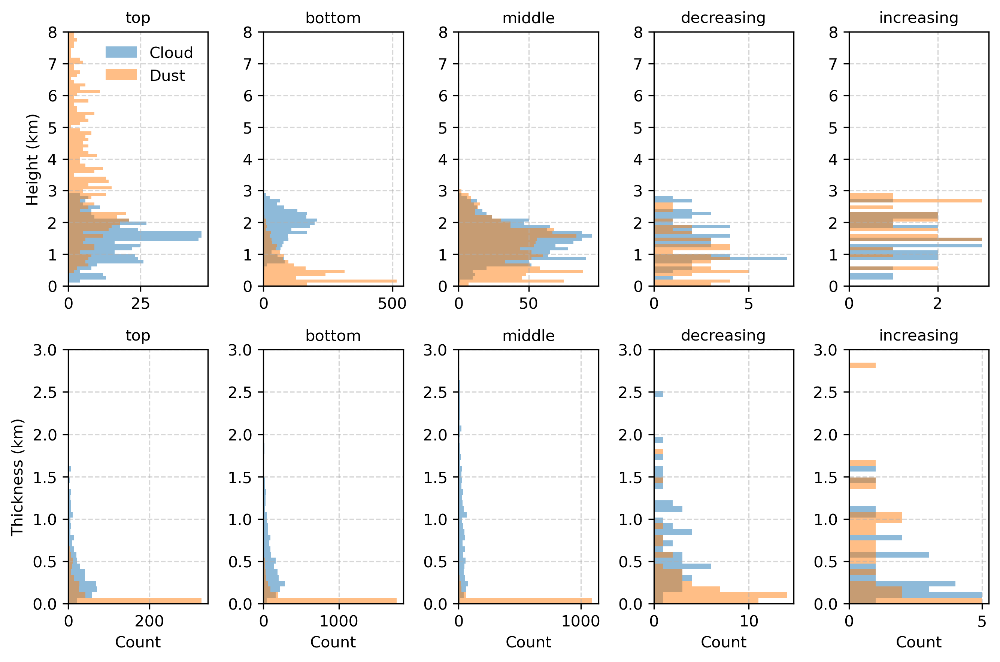

In [44]:
bins_h = np.linspace(0, 8, 80)   # 高度范围 (0-8 km)
bins_t = np.linspace(0, 4, 60)   # 厚度范围 (0-4 km)

fig, axes = plt.subplots(2, 5, figsize=(9, 6), dpi=300, sharex=False, sharey=False)
axes = axes.ravel()

for i, name in enumerate(cat_names[:5]):  # 只画前5个类别作为示例
    ax = axes[i]
    # 平均高度 (Cloud)
    cloud = cloud_mh_by_cat[name]
    cloud_valid = cloud[~np.isnan(cloud)]
    if cloud_valid.size > 0:
        ax.hist(cloud_valid, bins=bins_h, orientation="horizontal",
                color="tab:blue", alpha=0.5, label="Cloud")
    # 平均高度 (Dust)
    dust = dust_mh_by_cat[name]
    dust_valid = dust[~np.isnan(dust)]
    if dust_valid.size > 0:
        ax.hist(dust_valid, bins=bins_h, orientation="horizontal",
                color="tab:orange", alpha=0.5, label="Dust")

    ax.set_title(f"{name}", fontsize=10)
    ax.set_ylim(0, 8)
    ax.grid(ls="--", alpha=0.5)

for i, name in enumerate(cat_names[:5]):  # 下排画厚度
    ax = axes[i+5]
    # 厚度 (Cloud)
    cloud = cloud_tn_by_cat[name]
    cloud_valid = cloud[~np.isnan(cloud)]
    if cloud_valid.size > 0:
        ax.hist(cloud_valid, bins=bins_t, orientation="horizontal",
                color="tab:blue", alpha=0.5, label="Cloud")
    # 厚度 (Dust)
    dust = dust_tn_by_cat[name]
    dust_valid = dust[~np.isnan(dust)]
    if dust_valid.size > 0:
        ax.hist(dust_valid, bins=bins_t, orientation="horizontal",
                color="tab:orange", alpha=0.5, label="Dust")

    ax.set_title(f"{name}", fontsize=10)
    ax.set_ylim(0, 3)
    ax.grid(ls="--", alpha=0.5)

# 标签设置
for ax in axes[5:]:
    ax.set_xlabel("Count")
    
axes[0].set_ylabel("Height (km)")
axes[5].set_ylabel("Thickness (km)")
# 图例放在第一个子图
axes[0].legend(frameon=False, loc="upper right")

plt.tight_layout()
plt.show()


In [45]:
import numpy as np
import matplotlib.pyplot as plt

def plot_cloud_dust_by_rain(cloud_mh_by_cat, dust_mh_by_cat,
                            cloud_tn_by_cat, dust_tn_by_cat,
                            RR_by_cat, cat_names,
                            rain_thresh=0.1):
    """绘制 Cloud & Dust 在下雨/不下雨条件下的高度与厚度分布（bin宽度固定0.2 km）"""

    # --- 每个 bin 的宽度都为 0.2 km ---
    bins_h = np.arange(0, 8.01, 0.2)
    bins_t = np.arange(0, 4.01, 0.1)

    # --- 颜色设定 ---
    colors = {"cloud": "tab:blue", "dust": "tab:orange"}

    # --- 按降水率拆分 ---
    def split_rain(x, rr):
        x, rr = np.asarray(x, float).ravel(), np.asarray(rr, float).ravel()
        n = min(len(x), len(rr))
        x, rr = x[:n], rr[:n]
        valid = np.isfinite(x) & np.isfinite(rr)
        return x[valid & (rr >= rain_thresh)], x[valid & (rr < rain_thresh)]

    # --- 通用绘图函数 ---
    def plot_one(figtitle, selector):
        fig, axes = plt.subplots(2, 5, figsize=(9, 6), dpi=300)
        axes = axes.ravel()

        for i, name in enumerate(cat_names[:5]):
            ax = axes[i]
            c, d = selector(cloud_mh_by_cat[name], dust_mh_by_cat[name], RR_by_cat[name])
            if len(c): ax.hist(c, bins=bins_h, orientation="horizontal", color=colors["cloud"], alpha=0.6, label="Cloud")
            if len(d): ax.hist(d, bins=bins_h, orientation="horizontal", color=colors["dust"],  alpha=0.6, label="Dust")
            ax.set_ylim(0, 8)
            ax.set_title(name, fontsize=10)
            ax.grid(ls="--", alpha=0.5)

        for i, name in enumerate(cat_names[:5]):
            ax = axes[i+5]
            c, d = selector(cloud_tn_by_cat[name], dust_tn_by_cat[name], RR_by_cat[name])
            if len(c): ax.hist(c, bins=bins_t, orientation="horizontal", color=colors["cloud"], alpha=0.6, label="Cloud")
            if len(d): ax.hist(d, bins=bins_t, orientation="horizontal", color=colors["dust"],  alpha=0.6, label="Dust")
            ax.set_ylim(0, 3)
            ax.set_title(name, fontsize=10)
            ax.grid(ls="--", alpha=0.5)

        for ax in axes[5:]:
            ax.set_xlabel("Count")
        axes[0].set_ylabel("Height (km)")
        axes[5].set_ylabel("Thickness (km)")
        axes[0].legend(frameon=False, loc="upper right", fontsize=8)
        fig.suptitle(figtitle, fontsize=14)
        plt.tight_layout()
        plt.show()

    # --- 绘制两张图 ---
    plot_one("No-rain cases (RR < %.1f mm h$^{-1}$)" % rain_thresh,
             lambda c, d, rr: (split_rain(c, rr)[1], split_rain(d, rr)[1]))
    plot_one("Rain cases (RR ≥ %.1f mm h$^{-1}$)" % rain_thresh,
             lambda c, d, rr: (split_rain(c, rr)[0], split_rain(d, rr)[0]))


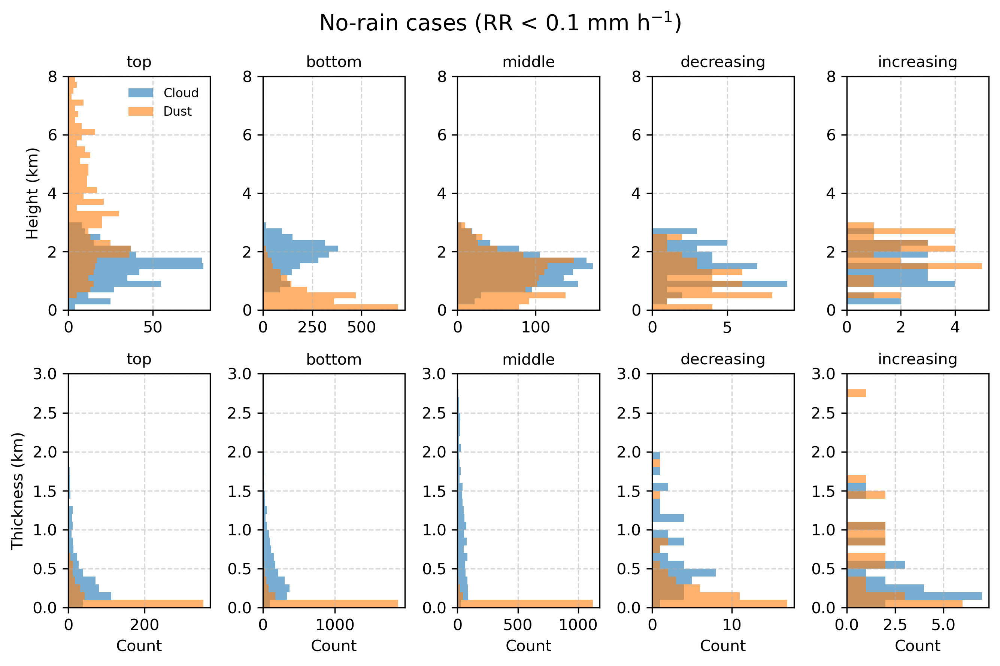

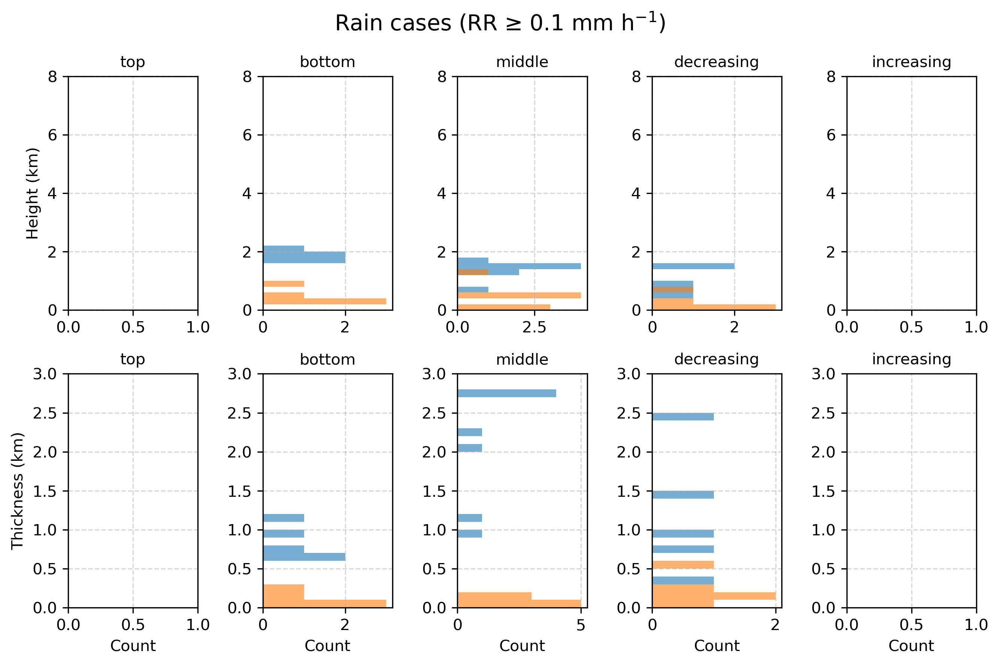

In [46]:
plot_cloud_dust_by_rain(cloud_mh_by_cat, dust_mh_by_cat,
                        cloud_tn_by_cat, dust_tn_by_cat,
                        RR_by_cat, cat_names)


### Dust-Cloud saparation distances

In [47]:
arr_dist_top    = np.full(mask.shape, np.nan)
arr_dist_bottom = np.full(mask.shape, np.nan)

for s, e in zip(starts, ends):
    d_top, d_base = np.nanmean(dust_top_height_new[s:e+1]), np.nanmean(dust_base_height_new[s:e+1])
    c_top, c_base = np.nanmean(cloud_top_height_new[s:e+1]), np.nanmean(cloud_base_height_new[s:e+1])

    if d_base - c_top > 0.1:  # top
        dist = max(0, d_base - c_top - 0.1)
        arr_dist_top[s:e+1] = dist
    elif c_base - d_top > 0.1:  # bottom
        dist = max(0, c_base - d_top - 0.1)
        arr_dist_bottom[s:e+1] = dist

def extract_event_meanss(arr):
    """输入: 带 NaN 的数组; 输出: 每个事件的平均值列表"""
    events = []
    in_event, start = False, None

    for i, v in enumerate(arr):
        if not np.isnan(v) and not in_event:
            # 事件开始
            in_event, start = True, i
        elif np.isnan(v) and in_event:
            # 事件结束
            events.append(np.nanmean(arr[start:i]))
            in_event = False
    # 若最后一个事件到结尾
    if in_event:
        events.append(np.nanmean(arr[start:]))
    return np.array(events)

# 分别计算 top 和 bottom 事件的平均距离
arr_dist_top    = extract_event_meanss(arr_dist_top)
arr_dist_bottom = extract_event_meanss(arr_dist_bottom)

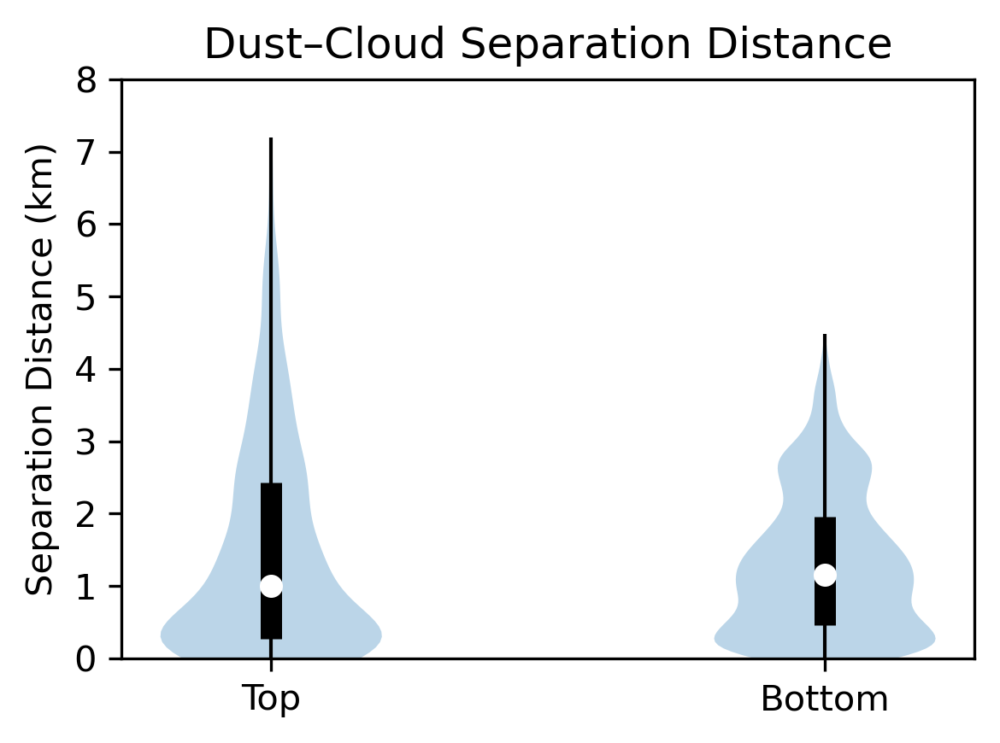

In [48]:
import numpy as np
import matplotlib.pyplot as plt

# 数据
data = [arr_dist_top, arr_dist_bottom]
positions = [1, 2]
fig, ax = plt.subplots(1, 1, figsize=(4, 3), dpi=300)

# 绘制 violin，不显示均值/中位数/极值
parts = ax.violinplot(
    data, positions=positions, widths=0.4,
    showmeans=False, showmedians=False, showextrema=False
)


# 添加中位数、IQR、min–max
for pos, d in zip(positions, data):
    q1, med, q3 = np.percentile(d, [25, 50, 75])
    ax.scatter(pos, med, color="white", s=30, zorder=3)   # 中位数
    ax.vlines(pos, q1, q3, color="black", lw=6)           # IQR
    ax.vlines(pos, d.min(), d.max(), color="black", lw=1) # min–max

# 坐标轴美化
ax.set_xticks(positions)
ax.set_xticklabels(["Top", "Bottom"])
ax.set_ylabel("Separation Distance (km)")
ax.set_title("Dust–Cloud Separation Distance")
ax.set_ylim(0,8)
plt.tight_layout()
plt.show()


### Dust Optical Depth vs. Variables

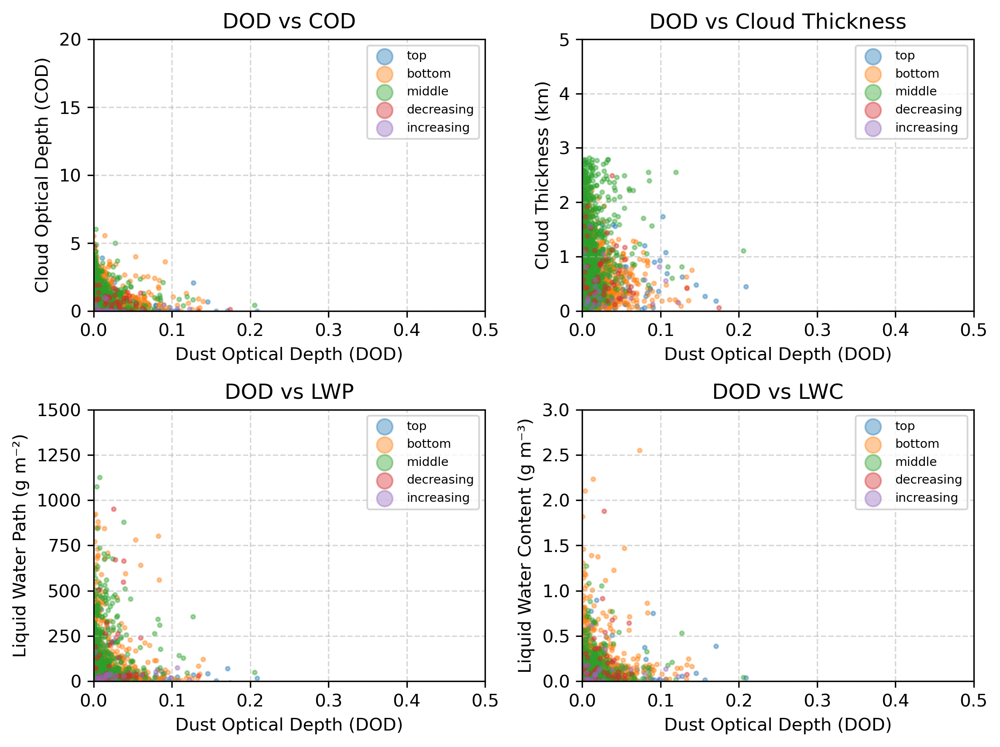

In [49]:
import matplotlib.pyplot as plt
import numpy as np

colors = ["tab:blue", "tab:orange", "tab:green", "tab:red", "tab:purple"]

fig, axes = plt.subplots(2, 2, figsize=(8, 6), dpi=300)

# 子图列表配置：[(x数据字典, y数据字典, xlabel, ylabel, title, ylim)]
plots = [
    (DOD_by_cat, COD_by_cat, "Dust Optical Depth (DOD)", "Cloud Optical Depth (COD)", "DOD vs COD", (0, 20)),
    (DOD_by_cat, cloud_tn_by_cat, "Dust Optical Depth (DOD)", "Cloud Thickness (km)", "DOD vs Cloud Thickness", (0, 5)),
    (DOD_by_cat, lwp_by_cat, "Dust Optical Depth (DOD)", "Liquid Water Path (g m⁻²)", "DOD vs LWP", (0, 1500)),
    (DOD_by_cat, lwc_by_cat, "Dust Optical Depth (DOD)", "Liquid Water Content (g m⁻³)", "DOD vs LWC", (0, 3)),
]

for ax, (xdict, ydict, xlabel, ylabel, title, ylim) in zip(axes.ravel(), plots):
    for i, name in enumerate(cat_names):
        x, y = xdict[name], ydict[name]
        mask = (~np.isnan(x)) & (~np.isnan(y))
        ax.scatter(x[mask], y[mask], s=5, alpha=0.4, color=colors[i], label=name)
    ax.set(xlabel=xlabel, ylabel=ylabel, title=title, xlim=(0, 0.5), ylim=ylim)
    ax.grid(ls="--", alpha=0.5)
    ax.legend(markerscale=4, fontsize=7)

plt.tight_layout()
plt.show()


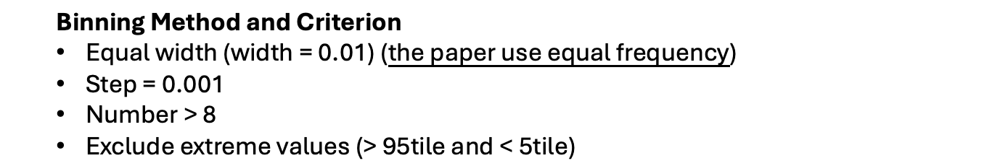

In [50]:
import numpy as np

# ===== 参数 =====
window_width = 0.010   # 滑动窗口宽度（DOD 绝对值尺度，可调）
step          = 0.001   # 滑动步长（越小越丝滑）
min_count_win = 8       # 每个窗口最少样本数
q_low, q_high = 0.10, 0.90

def mask_extremes(a, q_low=0.05, q_high=0.95):
    a = np.asarray(a, dtype=float)
    v = np.isfinite(a)
    if v.sum() == 0:
        return np.full_like(a, np.nan)
    lo, hi = np.nanquantile(a[v], [q_low, q_high])
    out = a.copy()
    out[(a < lo) | (a > hi)] = np.nan
    return out

def moving_window_xy(x, y, xmin, xmax, width, step):
    # 窗口中心序列
    centers = np.arange(xmin + width/2, xmax - width/2 + step/2, step)
    x_mean = np.full_like(centers, np.nan, dtype=float)
    y_mean = np.full_like(centers, np.nan, dtype=float)
    y_sem  = np.full_like(centers, np.nan, dtype=float)
    count  = np.zeros_like(centers, dtype=int)

    m = np.isfinite(x) & np.isfinite(y)
    x, y = x[m], y[m]
    if x.size == 0:
        return {"x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count}

    half = width / 2.0
    for i, c in enumerate(centers):
        sel = (x >= c - half) & (x < c + half)
        if sel.any():
            xb, yb = x[sel], y[sel]
            count[i]  = xb.size
            x_mean[i] = xb.mean()
            y_mean[i] = yb.mean()
            if xb.size > 1:
                y_sem[i] = yb.std(ddof=1) / np.sqrt(xb.size)

    return {"x_mean": x_mean, "y_mean": y_mean, "y_sem": y_sem, "count": count}

# ===== 1) 去极值 + 三变量交集，收集全局范围 =====
trip = {}
all_DOD = []
for name in cat_names:
    x0 = mask_extremes(DOD_by_cat[name], q_low, q_high)
    y0 = mask_extremes(COD_by_cat[name], q_low, q_high)
    z0 = mask_extremes(cloud_tn_by_cat[name], q_low, q_high)
    m = np.isfinite(x0) & np.isfinite(y0) & np.isfinite(z0)
    x, y, z = x0[m], y0[m], z0[m]
    trip[name] = {"x": x, "y": y, "z": z}
    all_DOD.append(x)
all_DOD = np.concatenate(all_DOD) if all_DOD else np.array([])

xmin, xmax = np.nanmin(all_DOD), np.nanmax(all_DOD)
if np.isclose(xmin, xmax):
    xmin, xmax = xmin - 1e-9, xmax + 1e-9

# ===== 2) 滑动窗口统计 =====
results_cod_mov = {}
results_tn_mov  = {}
for name in cat_names:
    x = trip[name]["x"]; y = trip[name]["y"]; z = trip[name]["z"]
    results_cod_mov[name] = moving_window_xy(x, y, xmin, xmax, window_width, step)
    results_tn_mov[name]  = moving_window_xy(x, z, xmin, xmax, window_width, step)

binning_meta_mov = {
    "window_width": window_width,
    "step": step,
    "min_count": min_count_win,
}

In [52]:
# ===== 2') 为 LWP / LWC 做同样的滑窗统计（与 DOD 成对） =====
results_lwp_mov = {}
results_lwc_mov = {}

for name in cat_names:
    # 去极值
    x0   = mask_extremes(DOD_by_cat[name], q_low, q_high)
    lwp0 = mask_extremes(lwp_by_cat[name], q_low, q_high)
    lwc0 = mask_extremes(lwc_by_cat[name], q_low, q_high)

    # 与 DOD 的有效交集（分别与 LWP / LWC 成对）
    m_lwp = np.isfinite(x0) & np.isfinite(lwp0)
    m_lwc = np.isfinite(x0) & np.isfinite(lwc0)

    x_lwp, y_lwp = x0[m_lwp], lwp0[m_lwp]
    x_lwc, y_lwc = x0[m_lwc], lwc0[m_lwc]

    # 滑窗
    r_lwp = moving_window_xy(x_lwp, y_lwp, xmin, xmax, window_width, step)
    r_lwc = moving_window_xy(x_lwc, y_lwc, xmin, xmax, window_width, step)

    # 可选：按最小样本数阈值屏蔽
    bad = r_lwp["count"] < min_count_win
    r_lwp["x_mean"][bad] = np.nan; r_lwp["y_mean"][bad] = np.nan; r_lwp["y_sem"][bad] = np.nan
    bad = r_lwc["count"] < min_count_win
    r_lwc["x_mean"][bad] = np.nan; r_lwc["y_mean"][bad] = np.nan; r_lwc["y_sem"][bad] = np.nan

    results_lwp_mov[name] = r_lwp
    results_lwc_mov[name] = r_lwc

# 记录元数据
binning_meta_mov.update({"vars_added": ["LWP", "LWC"]})


In [53]:
def plot_moving(ax, results, ylabel, title, colors, cat_names, meta, show_legend=True):
    min_n = meta["min_count"]
    for i, name in enumerate(cat_names):
        res = results[name]
        x, y, yerr, n = res["x_mean"], res["y_mean"], res["y_sem"], res["count"]
        m = (n >= min_n) & np.isfinite(x) & np.isfinite(y)
        if not m.any():
            continue
        ax.plot(x[m], y[m], '-', lw=1.6, color=colors[i], alpha=0.7, label=name,)
        # 误差阴影可选
        # if np.isfinite(yerr[m]).any():
        #     ax.fill_between(x[m], y[m]-yerr[m], y[m]+yerr[m], alpha=0.15, color=colors[i])

    ax.set(xlabel="Dust Optical Depth", ylabel=ylabel, title=title)
    ax.grid(ls="--", alpha=0.5)
    if show_legend:
        ax.legend()


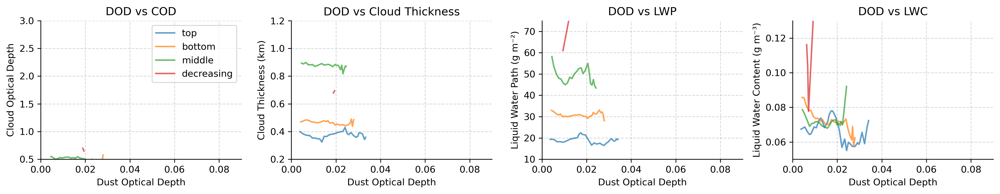

In [54]:
# ==== 画图 ====
fig, axes = plt.subplots(1, 4, figsize=(15, 3), dpi=300)

# ---- (1) COD ----
plot_moving(axes[0], results_cod_mov, "Cloud Optical Depth",
            "DOD vs COD", colors, cat_names, binning_meta_mov, show_legend=True)
axes[0].set_ylim(0.5, 3)
axes[0].set_xlim(0, 0.09)

# ---- (2) Cloud Thickness ----
plot_moving(axes[1], results_tn_mov, "Cloud Thickness (km)",
            "DOD vs Cloud Thickness", colors, cat_names, binning_meta_mov, show_legend=False)
axes[1].set_ylim(0.2, 1.2)
axes[1].set_xlim(0, 0.09)

# ---- (3) LWP ----
plot_moving(axes[2], results_lwp_mov, "Liquid Water Path (g m⁻²)",
            "DOD vs LWP", colors, cat_names, binning_meta_mov, show_legend=False)
axes[2].set_ylim(10, 75)
axes[2].set_xlim(0, 0.09)

# ---- (4) LWC ----
plot_moving(axes[3], results_lwc_mov, "Liquid Water Content (g m⁻³)",
            "DOD vs LWC", colors, cat_names, binning_meta_mov, show_legend=False)
axes[3].set_ylim(0.05, 0.13)
axes[3].set_xlim(0, 0.09)

# === 去除 top / right spines ===
for ax in axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.show()


## Sensitive test of ∂ln(LWP)/∂ln(DOD), -∂ln(Re)/∂ln(DOD)

### ∂ln(LWP)/∂ln(DOD)

In [ ]:
# === 计算：同时得到 LWP 与 Thickness (cloud_tn_by_cat) 相对敏感度 ===
import numpy as np

# 可选：用 scipy 获得 t 分布置信区间；没有就用正态近似
try:
    from scipy.stats import linregress, t
    _HAVE_SCIPY = True
except Exception:
    _HAVE_SCIPY = False

def _linregress_with_ci(x, y):
    x = np.asarray(x, float).ravel()
    y = np.asarray(y, float).ravel()
    n = x.size
    if n < 3:
        return np.nan, np.nan, np.nan, n, (np.nan, np.nan)

    if _HAVE_SCIPY:
        lr = linregress(x, y)
        slope, intercept, stderr = lr.slope, lr.intercept, lr.stderr
        tcrit = t.ppf(0.975, df=n-2) if n > 2 else np.nan
        ci = (slope - tcrit*stderr, slope + tcrit*stderr)
        return slope, intercept, stderr, n, ci
    else:
        xm, ym = x.mean(), y.mean()
        Sxx = np.sum((x - xm)**2)
        Sxy = np.sum((x - xm)*(y - ym))
        slope = Sxy / Sxx if Sxx != 0 else np.nan
        intercept = ym - slope*xm
        dof = n - 2
        if dof <= 0 or not np.isfinite(slope) or Sxx <= 0:
            return slope, intercept, np.nan, n, (np.nan, np.nan)
        yhat = intercept + slope*x
        resid = y - yhat
        s2 = np.sum(resid**2) / dof
        stderr = np.sqrt(s2 / Sxx)
        z = 1.96
        ci = (slope - z*stderr, slope + z*stderr)
        return slope, intercept, stderr, n, ci

def _compute_one_target(DOD_by_cat, Y_by_cat, categories, y_min_positive=0.0):
    """通用：计算 d ln(Y) / d ln(DOD)；返回 {cat:指标} + total。"""
    results = {}
    dod_all, y_all = [], []

    for cat in categories:
        X = np.asarray(DOD_by_cat[cat], float)
        Y = np.asarray(Y_by_cat[cat],  float)

        if X.shape != Y.shape:
            raise ValueError(f"{cat}: shape mismatch {X.shape} vs {Y.shape}")

        m = np.isfinite(X) & np.isfinite(Y) & (X > 0) & (Y > y_min_positive)
        Xf, Yf = X[m], Y[m]

        if Xf.size >= 3:
            slope, intercept, stderr, n, (ci_low, ci_high) = _linregress_with_ci(np.log(Xf), np.log(Yf))
            results[cat] = dict(slope=slope, ci_low=ci_low, ci_high=ci_high, stderr=stderr, n=n)
            dod_all.append(Xf); y_all.append(Yf)
        else:
            results[cat] = dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=Xf.size)

    # total
    if dod_all:
        Xt, Yt = np.concatenate(dod_all), np.concatenate(y_all)
        if Xt.size >= 3:
            slope, intercept, stderr, n, (ci_low, ci_high) = _linregress_with_ci(np.log(Xt), np.log(Yt))
            results["total"] = dict(slope=slope, ci_low=ci_low, ci_high=ci_high, stderr=stderr, n=n)
        else:
            results["total"] = dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=Xt.size)
    else:
        results["total"] = dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=0)

    return results

def compute_sensitivities(
    DOD_by_cat,
    lwp_by_cat,
    cloud_tn_by_cat,
    re_by_cat,
    cloud_th_by_cat,
    COD_by_cat,
    categories=("top","bottom","middle","decreasing","increasing"),
    min_lwp=0.0,
    min_thickness=0.0,
    min_re=0.0,
    min_cloud_th=0.0,
    min_cod=0.0,
):
    results = {}

    results["LWP"]       = _compute_one_target(DOD_by_cat, lwp_by_cat,      categories, y_min_positive=min_lwp)
    results["Thickness"] = _compute_one_target(DOD_by_cat, cloud_tn_by_cat, categories, y_min_positive=min_thickness)
    results["COD"]       = _compute_one_target(DOD_by_cat, COD_by_cat,      categories, y_min_positive=min_cod)
    results["Cloud_TH"]  = _compute_one_target(DOD_by_cat, cloud_th_by_cat, categories, y_min_positive=min_cloud_th)

    # ===== Re：计算后统一取负号（ACI_Re 定义）=====
    re_res = _compute_one_target(DOD_by_cat, re_by_cat, categories, y_min_positive=min_re)
    for k, v in re_res.items():   # k = cat 或 'total'
        if np.isfinite(v["slope"]):
            v["slope"]   = -v["slope"]
            v["ci_low"], v["ci_high"] = -v["ci_high"], -v["ci_low"]
    results["Re"] = re_res

    order = list(categories) + ["total"]
    return results, order


# === 运行计算 ===
results_all, order = compute_sensitivities(
    DOD_by_cat, lwp_by_cat, cloud_tn_by_cat, re_by_cat, cloud_th_by_cat, COD_by_cat,
    categories=("top","bottom","middle","decreasing","increasing"),
    min_lwp=0.0, min_thickness=0.0, min_re=0.0, min_cloud_th=0.0, min_cod=0.0
)



In [ ]:
# === 绘图：1x2 子图；facecolor 为同色系亮 50%（不使用 alpha） ===
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def _extract(results_dict, order):
    s  = np.array([results_dict[c]["slope"]   for c in order], float)
    lo = np.array([results_dict[c]["ci_low"]  for c in order], float)
    hi = np.array([results_dict[c]["ci_high"] for c in order], float)
    return s, np.vstack([s-lo, hi-s])

def _lighten(c, a=0.5):
    rgb = np.array(mcolors.to_rgb(c))
    return tuple(rgb + (1-rgb)*a)

def plot_sens_bars(results_all, order,
                   ylim_left=(-0.3,0.3), ylim_right=(-0.3,0.3)):

    base = ["top", "middle", "bottom"]
    rest = [c for c in order if c not in base]
    cats = base + rest
    x = np.arange(len(cats))

    fig, ax = plt.subplots(1, 2, figsize=(11, 3), dpi=300, constrained_layout=True)

    bg_colors = {"top": "b", "middle": "#ff9505", "bottom": "#ba181b", "total": "k"}
    for a, ylim in zip(ax, [ylim_left, ylim_right]):
        for i,c in enumerate(cats):
            if c in bg_colors:
                a.axvspan(i-0.5, i+0.5, facecolor=bg_colors[c], alpha=0.15, zorder=0)
        a.set_ylim(*ylim)

    cols = ["#540863", "#EE6983", "#CF4B00"]

    # ---------- 左图 ----------
    w = 0.22
    for k, off, col, lab in zip(
        ["COD","LWP","Re"], [-w, 0.0, w], cols,
        ["COD|DOD","LWP|DOD","Re|DOD"]
    ):
        s, yerr = _extract(results_all[k], cats)
        ax[0].bar(x+off, s, width=w,
                  edgecolor=col, facecolor=_lighten(col, 0.5),
                  hatch="xx", linewidth=1.0, label=lab, zorder=2)
        ax[0].errorbar(x+off, s, yerr=yerr, fmt="none",
                       ecolor="k", elinewidth=1, capsize=3, zorder=3)

    ax[0].axhline(0, color="k", lw=1)
    ax[0].set_xticks(x); ax[0].set_xticklabels(cats)
    ax[0].set_ylabel(r"$\partial \ln(Y) / \partial \ln(\mathrm{DOD})$")
    ax[0].set_title("LWP|DOD, Re|DOD, COD|DOD")
    ax[0].grid(alpha=0.4, ls="--", axis="y")
    ax[0].legend(frameon=False)

    # ---------- 右图 ----------
    w2 = 0.28
    for k, off, col, lab in zip(
        ["Thickness","Cloud_TH"], [-w2/2, w2/2], cols[:2],
        ["CGT|DOD","CTH|DOD"]
    ):
        s, yerr = _extract(results_all[k], cats)
        ax[1].bar(x+off, s, width=w2,
                  edgecolor=col, facecolor=_lighten(col, 0.5),
                  hatch="///", linewidth=1.0, label=lab, zorder=2)
        ax[1].errorbar(x+off, s, yerr=yerr, fmt="none",
                       ecolor="k", elinewidth=1, capsize=3, zorder=3)

    ax[1].axhline(0, color="k", lw=1)
    ax[1].set_xticks(x); ax[1].set_xticklabels(cats)
    ax[1].set_ylabel(r"$\partial \ln(Y) / \partial \ln(\mathrm{DOD})$")
    ax[1].set_title("CGT|DOD, CTH|DOD")
    ax[1].grid(alpha=0.4, ls="--", axis="y")
    ax[1].legend(frameon=False)
    plt.tight_layout()
    plt.savefig("figsave/SGP_ACI1_chara.pdf", dpi=300, bbox_inches="tight")
    plt.show()

# === 调用 ===
plot_sens_bars(results_all, order)


## Binning method for ACI

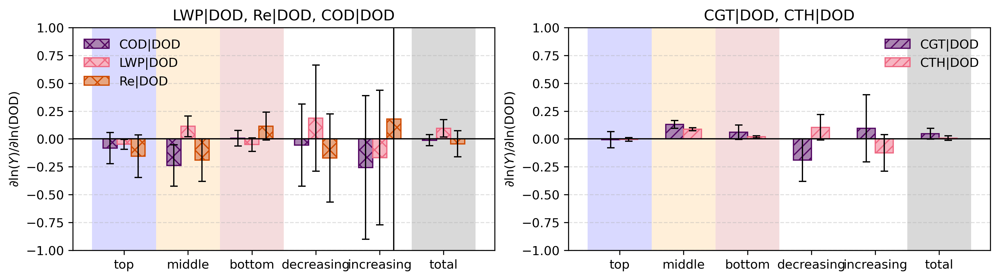

In [60]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from typing import Mapping, Sequence

try:
    from scipy import stats
    _HAVE_SCIPY = True
except Exception:
    _HAVE_SCIPY = False

# ========= moving-window 参数 =========
window_width = 0.010
step          = 0.001
min_count_win = 8
q_clip        = (0.05, 0.95)

# ====== 回归+CI（用于“median点回归”）======
def _linreg_ci(x, y, alpha=0.05):
    x = np.asarray(x, float).ravel(); y = np.asarray(y, float).ravel()
    n = x.size
    if n < 3: return np.nan, np.nan, np.nan, n, (np.nan, np.nan)
    if _HAVE_SCIPY:
        lr = stats.linregress(x, y)
        tcrit = stats.t.ppf(1-alpha/2, df=n-2) if n>2 else np.nan
        return lr.slope, lr.intercept, lr.stderr, n, (lr.slope - tcrit*lr.stderr, lr.slope + tcrit*lr.stderr)
    # normal approx fallback
    xm, ym = x.mean(), y.mean()
    Sxx = np.sum((x-xm)**2); Sxy = np.sum((x-xm)*(y-ym))
    b = Sxy/Sxx if Sxx>0 else np.nan
    a = ym - b*xm
    dof = n-2
    if dof<=0 or not np.isfinite(b): return b, a, np.nan, n, (np.nan, np.nan)
    yhat = a + b*x
    s2 = np.sum((y-yhat)**2)/dof
    se = np.sqrt(s2/Sxx) if Sxx>0 else np.nan
    z = 1.96
    return b, a, se, n, (b - z*se, b + z*se)

# ====== moving window：每个window取 median(lnDOD), median(lnY) -> 对这些median点回归 ======
def _mw_median_sens(DOD, Y, window_width, step, min_count_win, q_clip=(0.05,0.95), y_min_positive=0.0):
    DOD = np.asarray(DOD, float); Y = np.asarray(Y, float)
    m = np.isfinite(DOD)&np.isfinite(Y)&(DOD>0)&(Y>y_min_positive)
    DOD = DOD[m]; Y = Y[m]
    if DOD.size < min_count_win: return np.nan, np.nan, np.nan, int(DOD.size)

    idx = np.argsort(DOD); DOD = DOD[idx]; Y = Y[idx]
    dmin, dmax = DOD.min(), DOD.max()
    if dmax - dmin < window_width:  # fallback: one-shot
        b,_,_,n,(cl,ch)=_linreg_ci(np.log(DOD), np.log(Y))
        return b, cl, ch, n

    xs, ys = [], []
    c = dmin + window_width/2
    while c <= dmax - window_width/2 + 1e-12:
        lo, hi = c-window_width/2, c+window_width/2
        w = (DOD>=lo)&(DOD<hi)
        if w.sum() >= min_count_win:
            xw, yw = np.log(DOD[w]), np.log(Y[w])
            if q_clip is not None:
                ql,qh = q_clip
                xlo,xhi = np.quantile(xw,[ql,qh]); ylo,yhi = np.quantile(yw,[ql,qh])
                keep = (xw>=xlo)&(xw<=xhi)&(yw>=ylo)&(yw<=yhi)
                xw, yw = xw[keep], yw[keep]
            if xw.size >= min_count_win:
                xs.append(np.nanmedian(xw)); ys.append(np.nanmedian(yw))
        c += step

    xs=np.asarray(xs,float); ys=np.asarray(ys,float)
    if xs.size < 3:  # fallback
        b,_,_,n,(cl,ch)=_linreg_ci(np.log(DOD), np.log(Y))
        return b, cl, ch, n
    b,_,_,n,(cl,ch)=_linreg_ci(xs, ys)
    return b, cl, ch, n

# ====== 通用：对一个目标Y_by_cat 做 moving-window 敏感性 ======
def _compute_one_target_mw(DOD_by_cat, Y_by_cat, categories, y_min_positive=0.0,
                           window_width=0.010, step=0.001, min_count_win=8, q_clip=(0.05,0.95)):
    out = {}
    D_all, Y_all = [], []
    for cat in categories:
        X = np.asarray(DOD_by_cat[cat], float)
        Y = np.asarray(Y_by_cat[cat],  float)
        if X.shape != Y.shape: raise ValueError(f"{cat}: shape mismatch {X.shape} vs {Y.shape}")
        b, cl, ch, n = _mw_median_sens(X, Y, window_width, step, min_count_win, q_clip, y_min_positive)
        out[cat] = dict(slope=b, ci_low=cl, ci_high=ch, stderr=np.nan, n=n)
        if np.isfinite(b):
            m = np.isfinite(X)&np.isfinite(Y)&(X>0)&(Y>y_min_positive)
            D_all.append(X[m]); Y_all.append(Y[m])
    if D_all:
        Xt, Yt = np.concatenate(D_all), np.concatenate(Y_all)
        b, cl, ch, n = _mw_median_sens(Xt, Yt, window_width, step, min_count_win, q_clip, y_min_positive)
        out["total"] = dict(slope=b, ci_low=cl, ci_high=ch, stderr=np.nan, n=n)
    else:
        out["total"] = dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=0)
    return out

# ====== 主函数：LWP / Thickness / COD / Cloud_TH / Re (Re取负号) ======
def compute_sensitivities_mw(
    DOD_by_cat, lwp_by_cat, cloud_tn_by_cat, re_by_cat, cloud_th_by_cat, COD_by_cat,
    categories=("top","bottom","middle","decreasing","increasing"),
    min_lwp=0.0, min_thickness=0.0, min_re=0.0, min_cloud_th=0.0, min_cod=0.0,
    window_width=0.010, step=0.001, min_count_win=8, q_clip=(0.05,0.95),
):
    R = {}
    R["LWP"]       = _compute_one_target_mw(DOD_by_cat, lwp_by_cat,      categories, min_lwp,       window_width,step,min_count_win,q_clip)
    R["Thickness"] = _compute_one_target_mw(DOD_by_cat, cloud_tn_by_cat, categories, min_thickness, window_width,step,min_count_win,q_clip)
    R["COD"]       = _compute_one_target_mw(DOD_by_cat, COD_by_cat,      categories, min_cod,       window_width,step,min_count_win,q_clip)
    R["Cloud_TH"]  = _compute_one_target_mw(DOD_by_cat, cloud_th_by_cat, categories, min_cloud_th,  window_width,step,min_count_win,q_clip)

    re_res = _compute_one_target_mw(DOD_by_cat, re_by_cat, categories, min_re, window_width,step,min_count_win,q_clip)
    for k,v in re_res.items():
        if np.isfinite(v["slope"]):
            v["slope"]   = -v["slope"]
            v["ci_low"], v["ci_high"] = -v["ci_high"], -v["ci_low"]
    R["Re"] = re_res

    order = list(categories) + ["total"]
    return R, order

# ====== 绘图（保持你原样）=====
def _extract(results_dict, order):
    s  = np.array([results_dict[c]["slope"]   for c in order], float)
    lo = np.array([results_dict[c]["ci_low"]  for c in order], float)
    hi = np.array([results_dict[c]["ci_high"] for c in order], float)
    return s, np.vstack([s-lo, hi-s])

def _lighten(c, a=0.5):
    rgb = np.array(mcolors.to_rgb(c))
    return tuple(rgb + (1-rgb)*a)

def plot_sens_bars(results_all, order, ylim_left=(-0.3,0.3), ylim_right=(-0.3,0.3),
                   out="figsave/SGP_ACI1_chara_mw.pdf"):
    base = ["top","middle","bottom"]
    rest = [c for c in order if c not in base]
    cats = base + rest
    x = np.arange(len(cats))
    fig, ax = plt.subplots(1, 2, figsize=(11, 3), dpi=300, constrained_layout=True)

    bg_colors = {"top":"b","middle":"#ff9505","bottom":"#ba181b","total":"k"}
    for a, ylim in zip(ax, [ylim_left, ylim_right]):
        for i,c in enumerate(cats):
            if c in bg_colors: a.axvspan(i-0.5, i+0.5, facecolor=bg_colors[c], alpha=0.15, zorder=0)
        a.set_ylim(*ylim)

    cols = ["#540863", "#EE6983", "#CF4B00"]

    w = 0.22
    for k, off, col, lab in zip(["COD","LWP","Re"], [-w,0.0,w], cols, ["COD|DOD","LWP|DOD","Re|DOD"]):
        s, yerr = _extract(results_all[k], cats)
        ax[0].bar(x+off, s, width=w, edgecolor=col, facecolor=_lighten(col,0.5), hatch="xx", linewidth=1.0, label=lab, zorder=2)
        ax[0].errorbar(x+off, s, yerr=yerr, fmt="none", ecolor="k", elinewidth=1, capsize=3, zorder=3)

    ax[0].axhline(0, color="k", lw=1)
    ax[0].set_xticks(x); ax[0].set_xticklabels(cats)
    ax[0].set_ylabel(r"$\partial \ln(Y) / \partial \ln(\mathrm{DOD})$")
    ax[0].set_title("LWP|DOD, Re|DOD, COD|DOD")
    ax[0].grid(alpha=0.4, ls="--", axis="y")
    ax[0].legend(frameon=False)

    w2 = 0.28
    for k, off, col, lab in zip(["Thickness","Cloud_TH"], [-w2/2, w2/2], cols[:2], ["CGT|DOD","CTH|DOD"]):
        s, yerr = _extract(results_all[k], cats)
        ax[1].bar(x+off, s, width=w2, edgecolor=col, facecolor=_lighten(col,0.5), hatch="///", linewidth=1.0, label=lab, zorder=2)
        ax[1].errorbar(x+off, s, yerr=yerr, fmt="none", ecolor="k", elinewidth=1, capsize=3, zorder=3)

    ax[1].axhline(0, color="k", lw=1)
    ax[1].set_xticks(x); ax[1].set_xticklabels(cats)
    ax[1].set_ylabel(r"$\partial \ln(Y) / \partial \ln(\mathrm{DOD})$")
    ax[1].set_title("CGT|DOD, CTH|DOD")
    ax[1].grid(alpha=0.4, ls="--", axis="y")
    ax[1].legend(frameon=False)

    plt.savefig(out, dpi=300, bbox_inches="tight")
    plt.show()

# ====== 运行 ======
results_all, order = compute_sensitivities_mw(
    DOD_by_cat, lwp_by_cat, cloud_tn_by_cat, re_by_cat, cloud_th_by_cat, COD_by_cat,
    categories=("top","bottom","middle","decreasing","increasing"),
    min_lwp=0.0, min_thickness=0.0, min_re=0.0, min_cloud_th=0.0, min_cod=0.0,
    window_width=window_width, step=step, min_count_win=min_count_win, q_clip=q_clip
)

plot_sens_bars(results_all, order, ylim_left=(-1,1), ylim_right=(-1,1))


### -∂ln(Re)/∂ln(DOD), ∂ln(COD)/∂ln(DOD), ∂ln(CF)/∂ln(DOD)

In [58]:
import numpy as np
from typing import Dict, Sequence, Mapping, Optional
from scipy import stats

# ====== 工具：线性回归 + 95%CI ======
def _linregress_with_ci(x, y, alpha=0.05):
    """
    对 x, y 做线性回归：
      y = a + b x
    返回:
      slope, intercept, stderr, n, (ci_low, ci_high)
    其中 (ci_low, ci_high) 是 slope 的 (1-alpha) 置信区间
    """
    x = np.asarray(x, float)
    y = np.asarray(y, float)
    n = x.size
    if n < 3:
        return np.nan, np.nan, np.nan, n, (np.nan, np.nan)

    res = stats.linregress(x, y)
    slope = res.slope
    intercept = res.intercept
    stderr = res.stderr

    # t 分布临界值
    tcrit = stats.t.ppf(1 - alpha/2, df=n-2)
    ci_low = slope - tcrit * stderr
    ci_high = slope + tcrit * stderr
    return slope, intercept, stderr, n, (ci_low, ci_high)


# ====== 主函数：按 LWP 三档计算 ACI_Re / ACI_COD / CF 斜率 ======
def compute_aci_re_cod_by_lwp_bins(
    DOD_by_cat: Mapping[str, Sequence[float]],
    lwp_by_cat: Mapping[str, Sequence[float]],
    COD_by_cat: Mapping[str, Sequence[float]],
    cf_by_cat: Optional[Mapping[str, Sequence[float]]] = None,
    categories=("top","bottom","middle","decreasing","increasing"),
    # ✅ 改成三档 LWP：0–40, 40–80, 80–150
    lwp_bins=((0, 20.0), (20.0, 50.0), (50.0, 150.0)),
):
    """
    计算各类 + total 的（按 LWP 分箱）：
      - ACI_Re   = - d ln(Re)  / d ln(DOD)，其中 Re = (3/(2*rho_l)) * LWP / COD, rho_l=1
      - ACI_COD  =   d ln(COD) / d ln(DOD)
      - CF_slope =   d CF      / d ln(DOD)     （若提供 cf_by_cat）
    并给出 95% 置信区间（来自 _linregress_with_ci）。

    返回:
      results_re, results_cod, results_cf, bin_order, cat_order, re_by_cat
    """
    rho_l = 1.0
    const = 3.0 / (2.0 * rho_l)

    results_re, results_cod = {}, {}
    results_cf = {}
    re_by_cat = {}
    bin_order = []
    cat_order = list(categories) + ["total"]

    # === 先构建与输入同长的 Re 数组 ===
    for cat in categories:
        DOD = np.asarray(DOD_by_cat[cat], float)
        LWP = np.asarray(lwp_by_cat[cat], float)
        COD = np.asarray(COD_by_cat[cat], float)
        if not (DOD.shape == LWP.shape == COD.shape):
            raise ValueError(f"{cat}: shape mismatch: {DOD.shape}, {LWP.shape}, {COD.shape}")

        re_full = np.full_like(DOD, np.nan)
        valid = np.isfinite(DOD) & np.isfinite(LWP) & np.isfinite(COD)
        pos = valid & (DOD > 0) & (LWP > 0) & (COD > 0)
        re_full[pos] = const * LWP[pos] / COD[pos]
        re_by_cat[cat] = re_full

        if cf_by_cat is not None:
            CF = np.asarray(cf_by_cat[cat], float)
            if CF.shape != DOD.shape:
                raise ValueError(f"{cat}: CF shape mismatch: {CF.shape} vs {DOD.shape}")

    # === 按 LWP 分箱回归 ===
    for (lo, hi) in lwp_bins:
        bin_label = f"LWP:{lo:.0f}-{hi:.0f}"
        bin_order.append(bin_label)
        results_re[bin_label], results_cod[bin_label] = {}, {}
        results_cf[bin_label] = {}
        dod_re_all, re_all, dod_cod_all, cod_all = [], [], [], []
        dod_cf_all, cf_all = [], []

        for cat in categories:
            DOD = np.asarray(DOD_by_cat[cat], float)
            LWP = np.asarray(lwp_by_cat[cat], float)
            COD = np.asarray(COD_by_cat[cat], float)
            RE  = re_by_cat[cat]

            # --- ACI_Re ---
            m_re = np.isfinite(DOD) & np.isfinite(RE) & np.isfinite(LWP)
            m_re &= (DOD > 0) & (RE > 0) & (LWP >= lo) & (LWP < hi)
            if np.count_nonzero(m_re) >= 3:
                x, y = np.log(DOD[m_re]), np.log(RE[m_re])
                slope, _, stderr, n, (ci_low, ci_high) = _linregress_with_ci(x, y)
                aci_re = -slope
                results_re[bin_label][cat] = dict(
                    slope=aci_re,
                    ci_low=-ci_high,
                    ci_high=-ci_low,
                    stderr=stderr,
                    n=n,
                )
                dod_re_all.append(np.exp(x)); re_all.append(np.exp(y))
            else:
                results_re[bin_label][cat] = dict(
                    slope=np.nan, ci_low=np.nan, ci_high=np.nan,
                    stderr=np.nan, n=int(np.count_nonzero(m_re))
                )

            # --- ACI_COD ---
            m_cod = np.isfinite(DOD) & np.isfinite(COD) & np.isfinite(LWP)
            m_cod &= (DOD > 0) & (COD > 0) & (LWP >= lo) & (LWP < hi)
            if np.count_nonzero(m_cod) >= 3:
                x2, y2 = np.log(DOD[m_cod]), np.log(COD[m_cod])
                slope2, _, stderr2, n2, (ci_low2, ci_high2) = _linregress_with_ci(x2, y2)
                results_cod[bin_label][cat] = dict(
                    slope=slope2,
                    ci_low=ci_low2,
                    ci_high=ci_high2,
                    stderr=stderr2,
                    n=n2,
                )
                dod_cod_all.append(np.exp(x2)); cod_all.append(np.exp(y2))
            else:
                results_cod[bin_label][cat] = dict(
                    slope=np.nan, ci_low=np.nan, ci_high=np.nan,
                    stderr=np.nan, n=int(np.count_nonzero(m_cod))
                )

            # --- CF vs ln(DOD)（可选） ---
            if cf_by_cat is not None:
                CF = np.asarray(cf_by_cat[cat], float)
                m_cf = np.isfinite(DOD) & np.isfinite(CF) & np.isfinite(LWP)
                m_cf &= (DOD > 0) & (LWP >= lo) & (LWP < hi)
                if np.count_nonzero(m_cf) >= 3:
                    x3, y3 = np.log(DOD[m_cf]), CF[m_cf]
                    slope3, intercept3, stderr3, n3, (ci_low3, ci_high3) = _linregress_with_ci(x3, y3)
                    results_cf[bin_label][cat] = dict(
                        slope=slope3,
                        intercept=intercept3,
                        ci_low=ci_low3,
                        ci_high=ci_high3,
                        stderr=stderr3,
                        n=n3,
                    )
                    dod_cf_all.append(np.exp(x3)); cf_all.append(y3)
                else:
                    results_cf[bin_label][cat] = dict(
                        slope=np.nan, intercept=np.nan,
                        ci_low=np.nan, ci_high=np.nan,
                        stderr=np.nan, n=int(np.count_nonzero(m_cf))
                    )

        # --- total (ACI_Re) ---
        if dod_re_all:
            X, Y = np.log(np.concatenate(dod_re_all)), np.log(np.concatenate(re_all))
            if X.size >= 3:
                slope, _, stderr, n, (ci_low, ci_high) = _linregress_with_ci(X, Y)
                results_re[bin_label]["total"] = dict(
                    slope=-slope, ci_low=-ci_high, ci_high=-ci_low,
                    stderr=stderr, n=n,
                )
            else:
                results_re[bin_label]["total"] = dict(
                    slope=np.nan, ci_low=np.nan, ci_high=np.nan,
                    stderr=np.nan, n=X.size,
                )
        else:
            results_re[bin_label]["total"] = dict(
                slope=np.nan, ci_low=np.nan, ci_high=np.nan,
                stderr=np.nan, n=0,
            )

        # --- total (ACI_COD) ---
        if dod_cod_all:
            X2, Y2 = np.log(np.concatenate(dod_cod_all)), np.log(np.concatenate(cod_all))
            if X2.size >= 3:
                slope2, _, stderr2, n2, (ci_low2, ci_high2) = _linregress_with_ci(X2, Y2)
                results_cod[bin_label]["total"] = dict(
                    slope=slope2, ci_low=ci_low2, ci_high=ci_high2,
                    stderr=stderr2, n=n2,
                )
            else:
                results_cod[bin_label]["total"] = dict(
                    slope=np.nan, ci_low=np.nan, ci_high=np.nan,
                    stderr=np.nan, n=X2.size,
                )
        else:
            results_cod[bin_label]["total"] = dict(
                slope=np.nan, ci_low=np.nan, ci_high=np.nan,
                stderr=np.nan, n=0,
            )

        # --- total (CF) ---
        if cf_by_cat is not None:
            if dod_cf_all:
                X3, Y3 = np.log(np.concatenate(dod_cf_all)), np.concatenate(cf_all)
                if X3.size >= 3:
                    slope3, intercept3, stderr3, n3, (ci_low3, ci_high3) = _linregress_with_ci(X3, Y3)
                    results_cf[bin_label]["total"] = dict(
                        slope=slope3, intercept=intercept3,
                        ci_low=ci_low3, ci_high=ci_high3,
                        stderr=stderr3, n=n3,
                    )
                else:
                    results_cf[bin_label]["total"] = dict(
                        slope=np.nan, intercept=np.nan,
                        ci_low=np.nan, ci_high=np.nan,
                        stderr=np.nan, n=X3.size,
                    )
            else:
                results_cf[bin_label]["total"] = dict(
                    slope=np.nan, intercept=np.nan,
                    ci_low=np.nan, ci_high=np.nan,
                    stderr=np.nan, n=0,
                )

    return results_re, results_cod, results_cf, bin_order, cat_order, re_by_cat


# ====== 调用：使用三档 LWP 分箱 ======
results_re, results_cod, results_cf, bin_order, cat_order, re_by_cat = \
    compute_aci_re_cod_by_lwp_bins(
        DOD_by_cat,
        lwp_by_cat,
        COD_by_cat,
        cf_by_cat=cf_by_cat
    )


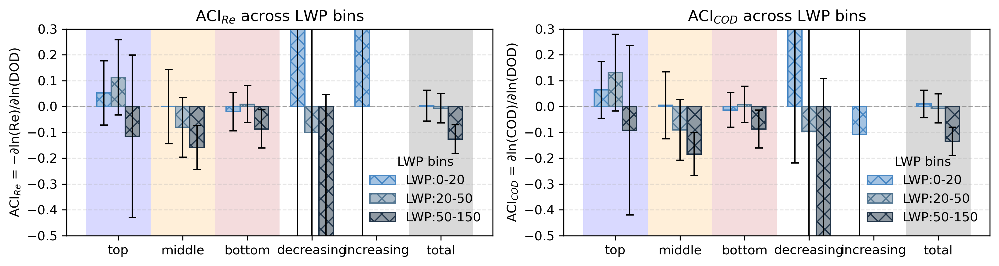

In [59]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def _get_series(res, b, cats):
    s  = np.array([res[b][c]["slope"]   for c in cats], float)
    lo = np.array([res[b][c]["ci_low"]  for c in cats], float)
    hi = np.array([res[b][c]["ci_high"] for c in cats], float)
    return s, np.vstack([s-lo, hi-s])

def _lighten(c, a=0.5):
    rgb = np.array(mcolors.to_rgb(c))
    return tuple(rgb + (1-rgb)*a)

def plot_aci_re_cod_bar(results_re, results_cod, bin_order, cat_order=None, ylim=(-0.3, 0.4)):
    cats = (list(cat_order) if cat_order is not None else [c for c in results_re[bin_order[0]] if c!="total"]+["total"])
    if {"top","bottom","middle"}.issubset(cats): cats = ["top","middle","bottom"] + [c for c in cats if c not in ["top","middle","bottom"]]
    x = np.arange(len(cats))
    cols = ["#4988C4", "#547792", "#213448"]
    bg = {"top":"b", "bottom":"#ba181b", "middle":"#ff9505", "total":"k"}

    fig, ax = plt.subplots(1, 2, figsize=(11, 3), dpi=300, constrained_layout=True)
    for a in ax:
        for i,c in enumerate(cats):
            if c in bg: a.axvspan(i-0.5, i+0.5, facecolor=bg[c], alpha=0.15, zorder=0)
        a.axhline(0, ls="--", lw=1, color="gray", alpha=0.7)
        a.set_ylim(*ylim); a.set_xticks(x); a.set_xticklabels(cats); a.grid(alpha=0.3, ls="--", axis="y")

    w = 0.22; offs = (np.arange(len(bin_order)) - (len(bin_order)-1)/2) * w
    for i,b in enumerate(bin_order):
        ec, fc = cols[i], _lighten(cols[i], 0.5)

        s,y = _get_series(results_re, b, cats)
        ax[0].bar(x+offs[i], s, width=w, edgecolor=ec, facecolor=fc, hatch="xx", linewidth=1.0, label=b, zorder=2)
        ax[0].errorbar(x+offs[i], s, yerr=y, fmt="none", ecolor="k", elinewidth=1, capsize=3, zorder=3)

        s,y = _get_series(results_cod, b, cats)
        ax[1].bar(x+offs[i], s, width=w, edgecolor=ec, facecolor=fc, hatch="xx", linewidth=1.0, label=b, zorder=2)
        ax[1].errorbar(x+offs[i], s, yerr=y, fmt="none", ecolor="k", elinewidth=1, capsize=3, zorder=3)

    ax[0].set_ylabel(r"ACI$_{Re}$ = $-\partial \ln(\mathrm{Re})/\partial \ln(\mathrm{DOD})$"); ax[0].set_title("ACI$_{Re}$ across LWP bins"); ax[0].legend(title="LWP bins", frameon=False)
    ax[1].set_ylabel(r"ACI$_{COD}$ = $\partial \ln(\mathrm{COD})/\partial \ln(\mathrm{DOD})$"); ax[1].set_title("ACI$_{COD}$ across LWP bins"); ax[1].legend(title="LWP bins", frameon=False)
    
    plt.tight_layout()
    plt.savefig("figsave/SGP_ACI2_chara.pdf", dpi=300, bbox_inches="tight")
    plt.show()

plot_aci_re_cod_bar(results_re, results_cod, bin_order, cat_order, ylim=(-0.5, 0.3))


## Binning methods for ACI

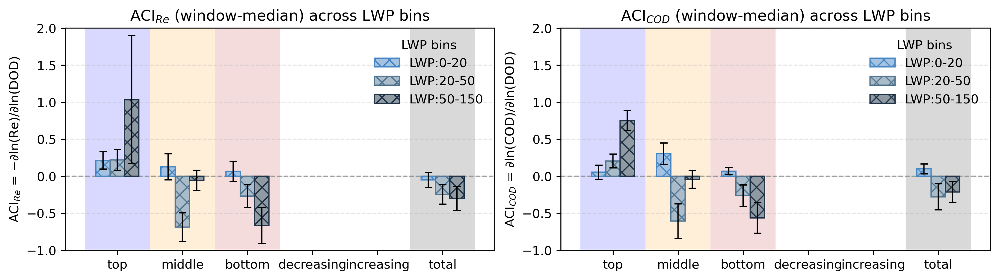

In [64]:
import numpy as np
from typing import Mapping, Sequence, Optional
from scipy import stats
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# ========= 参数（可调） =========
window_width = 0.010
step          = 0.001
min_count_win = 8
q_clip        = (0.05, 0.95)

# ====== 回归 + 95%CI ======
def _linreg_ci(x, y, alpha=0.05):
    res = stats.linregress(x, y)
    n = int(len(x))
    if n < 3 or not np.isfinite(res.stderr):
        return res.slope, res.intercept, np.nan, n, (np.nan, np.nan)
    tcrit = stats.t.ppf(1 - alpha/2, df=n-2)
    return res.slope, res.intercept, res.stderr, n, (res.slope - tcrit*res.stderr, res.slope + tcrit*res.stderr)

# ====== moving window: 先在每个window取 median 点，再对这些 median 点做回归 ======
def _mw_median_regression(DOD, Y, window_width, step, min_count_win, q_clip=(0.05,0.95)):
    DOD = np.asarray(DOD, float); Y = np.asarray(Y, float)
    m = np.isfinite(DOD) & np.isfinite(Y) & (DOD>0) & (Y>0)
    DOD = DOD[m]; Y = Y[m]
    if DOD.size < min_count_win:
        return np.nan, np.nan, np.nan, int(DOD.size), (np.nan, np.nan)

    idx = np.argsort(DOD); DOD = DOD[idx]; Y = Y[idx]
    dmin, dmax = DOD.min(), DOD.max()
    if dmax - dmin < window_width:  # fallback: 直接对原始点回归（median点太少）
        x, y = np.log(DOD), np.log(Y)
        return _linreg_ci(x, y)

    xs, ys = [], []
    c = dmin + window_width/2
    while c <= dmax - window_width/2 + 1e-12:
        lo, hi = c - window_width/2, c + window_width/2
        w = (DOD>=lo) & (DOD<hi)
        if w.sum() >= min_count_win:
            xw, yw = np.log(DOD[w]), np.log(Y[w])
            if q_clip is not None:
                ql,qh = q_clip
                xlo,xhi = np.quantile(xw,[ql,qh]); ylo,yhi = np.quantile(yw,[ql,qh])
                keep = (xw>=xlo)&(xw<=xhi)&(yw>=ylo)&(yw<=yhi)
                xw, yw = xw[keep], yw[keep]
            if xw.size >= min_count_win:
                xs.append(np.nanmedian(xw))
                ys.append(np.nanmedian(yw))
        c += step

    xs = np.asarray(xs, float); ys = np.asarray(ys, float)
    if xs.size < 3:
        x, y = np.log(DOD), np.log(Y)
        return _linreg_ci(x, y)
    return _linreg_ci(xs, ys)

# ====== 主函数：按 LWP bins + moving window (median->regression) 计算 ACI_Re / ACI_COD / 可选CF ======
def compute_aci_by_lwp_bins_mw_median(
    DOD_by_cat: Mapping[str, Sequence[float]],
    lwp_by_cat: Mapping[str, Sequence[float]],
    COD_by_cat: Mapping[str, Sequence[float]],
    cf_by_cat: Optional[Mapping[str, Sequence[float]]] = None,
    categories=("top","bottom","middle","decreasing","increasing"),
    lwp_bins=((0,20.0),(20.0,50.0),(50.0,150.0)),
    window_width=0.010, step=0.001, min_count_win=8, q_clip=(0.05,0.95),
):
    const = 3.0/(2.0*1.0)
    results_re, results_cod, results_cf = {}, {}, {}
    re_by_cat = {}
    bin_order = [f"LWP:{lo:.0f}-{hi:.0f}" for lo,hi in lwp_bins]
    cat_order = list(categories) + ["total"]

    # build Re
    for cat in categories:
        DOD = np.asarray(DOD_by_cat[cat], float)
        LWP = np.asarray(lwp_by_cat[cat], float)
        COD = np.asarray(COD_by_cat[cat], float)
        if not (DOD.shape == LWP.shape == COD.shape):
            raise ValueError(f"{cat}: shape mismatch")
        RE = np.full_like(DOD, np.nan)
        m = np.isfinite(DOD)&np.isfinite(LWP)&np.isfinite(COD)&(DOD>0)&(LWP>0)&(COD>0)
        RE[m] = const * LWP[m] / COD[m]
        re_by_cat[cat] = RE
        if cf_by_cat is not None and np.asarray(cf_by_cat[cat], float).shape != DOD.shape:
            raise ValueError(f"{cat}: CF shape mismatch")

    for (lo,hi), b in zip(lwp_bins, bin_order):
        results_re[b], results_cod[b], results_cf[b] = {}, {}, {}
        # collect for total
        D_re_all, RE_all, D_cod_all, COD_all = [], [], [], []
        D_cf_all, CF_all = [], []

        for cat in categories:
            DOD = np.asarray(DOD_by_cat[cat], float)
            LWP = np.asarray(lwp_by_cat[cat], float)
            COD = np.asarray(COD_by_cat[cat], float)
            RE  = re_by_cat[cat]
            mm = np.isfinite(LWP) & (LWP>=lo) & (LWP<hi)

            # ACI_Re: regression on (median lnDOD, median lnRE) points
            s, itc, se, n, (cl, ch) = _mw_median_regression(DOD[mm], RE[mm], window_width, step, min_count_win, q_clip)
            results_re[b][cat] = dict(slope=-s, ci_low=-ch, ci_high=-cl, stderr=se, n=n)
            if np.isfinite(s): D_re_all.append(DOD[mm]); RE_all.append(RE[mm])

            # ACI_COD
            s2, itc2, se2, n2, (cl2, ch2) = _mw_median_regression(DOD[mm], COD[mm], window_width, step, min_count_win, q_clip)
            results_cod[b][cat] = dict(slope=s2, ci_low=cl2, ci_high=ch2, stderr=se2, n=n2)
            if np.isfinite(s2): D_cod_all.append(DOD[mm]); COD_all.append(COD[mm])

            # CF (可选)：对每个window取 median(lnDOD) 与 median(CF)，再回归 CF ~ lnDOD
            if cf_by_cat is not None:
                CF = np.asarray(cf_by_cat[cat], float)[mm]
                DD = np.asarray(DOD[mm], float)
                mcf = np.isfinite(DD)&(DD>0)&np.isfinite(CF)
                DD, CF = DD[mcf], CF[mcf]
                # 用与上面一致的 windowing，只是 y 不取log
                if DD.size < min_count_win:
                    results_cf[b][cat] = dict(slope=np.nan, intercept=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=int(DD.size))
                else:
                    idx = np.argsort(DD); DD, CF = DD[idx], CF[idx]
                    dmin,dmax = DD.min(), DD.max()
                    xs, ys = [], []
                    c = dmin + window_width/2
                    while c <= dmax - window_width/2 + 1e-12:
                        loW, hiW = c-window_width/2, c+window_width/2
                        w = (DD>=loW)&(DD<hiW)
                        if w.sum() >= min_count_win:
                            xw = np.log(DD[w]); yw = CF[w]
                            if q_clip is not None:
                                ql,qh = q_clip
                                xlo,xhi = np.quantile(xw,[ql,qh]); ylo,yhi = np.quantile(yw,[ql,qh])
                                keep = (xw>=xlo)&(xw<=xhi)&(yw>=ylo)&(yw<=yhi)
                                xw,yw = xw[keep], yw[keep]
                            if xw.size >= min_count_win:
                                xs.append(np.nanmedian(xw)); ys.append(np.nanmedian(yw))
                        c += step
                    xs=np.asarray(xs,float); ys=np.asarray(ys,float)
                    if xs.size >= 3:
                        s3,it3,se3,n3,(cl3,ch3)=_linreg_ci(xs,ys)
                        results_cf[b][cat]=dict(slope=s3, intercept=it3, ci_low=cl3, ci_high=ch3, stderr=se3, n=n3)
                    else:
                        results_cf[b][cat]=dict(slope=np.nan, intercept=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=int(xs.size))

        # total
        def _total(D_list, Y_list, negate=False):
            if not D_list: return dict(slope=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=0)
            D = np.concatenate(D_list); Y = np.concatenate(Y_list)
            s,itc,se,n,(cl,ch)=_mw_median_regression(D, Y, window_width, step, min_count_win, q_clip)
            if negate: return dict(slope=-s, ci_low=-ch, ci_high=-cl, stderr=se, n=n)
            return dict(slope=s, ci_low=cl, ci_high=ch, stderr=se, n=n)

        results_re[b]["total"]  = _total(D_re_all,  RE_all,  negate=True)
        results_cod[b]["total"] = _total(D_cod_all, COD_all, negate=False)

        if cf_by_cat is not None:
            # 简化：total CF 用 median-window 点回归（同上）
            D = np.concatenate([np.asarray(DOD_by_cat[c],float) for c in categories])
            L = np.concatenate([np.asarray(lwp_by_cat[c],float) for c in categories])
            C = np.concatenate([np.asarray(cf_by_cat[c],float)  for c in categories])
            m = np.isfinite(D)&(D>0)&np.isfinite(L)&(L>=lo)&(L<hi)&np.isfinite(C)
            # 先生成window-median点再回归
            DD, CC = D[m], C[m]
            if DD.size < min_count_win:
                results_cf[b]["total"]=dict(slope=np.nan, intercept=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=int(DD.size))
            else:
                idx=np.argsort(DD); DD,CC=DD[idx],CC[idx]
                dmin,dmax=DD.min(),DD.max()
                xs,ys=[],[]
                c=dmin+window_width/2
                while c<=dmax-window_width/2+1e-12:
                    loW,hiW=c-window_width/2,c+window_width/2
                    w=(DD>=loW)&(DD<hiW)
                    if w.sum()>=min_count_win:
                        xw=np.log(DD[w]); yw=CC[w]
                        if q_clip is not None:
                            ql,qh=q_clip
                            xlo,xhi=np.quantile(xw,[ql,qh]); ylo,yhi=np.quantile(yw,[ql,qh])
                            keep=(xw>=xlo)&(xw<=xhi)&(yw>=ylo)&(yw<=yhi)
                            xw,yw=xw[keep],yw[keep]
                        if xw.size>=min_count_win:
                            xs.append(np.nanmedian(xw)); ys.append(np.nanmedian(yw))
                    c+=step
                xs=np.asarray(xs,float); ys=np.asarray(ys,float)
                if xs.size>=3:
                    s3,it3,se3,n3,(cl3,ch3)=_linreg_ci(xs,ys)
                    results_cf[b]["total"]=dict(slope=s3, intercept=it3, ci_low=cl3, ci_high=ch3, stderr=se3, n=n3)
                else:
                    results_cf[b]["total"]=dict(slope=np.nan, intercept=np.nan, ci_low=np.nan, ci_high=np.nan, stderr=np.nan, n=int(xs.size))

    return results_re, results_cod, results_cf, bin_order, cat_order, re_by_cat

# ====== plotting（沿用你原来的） ======
def _get_series(res, b, cats):
    s  = np.array([res[b][c]["slope"]   for c in cats], float)
    lo = np.array([res[b][c]["ci_low"]  for c in cats], float)
    hi = np.array([res[b][c]["ci_high"] for c in cats], float)
    return s, np.vstack([s-lo, hi-s])

def _lighten(c, a=0.5):
    rgb = np.array(mcolors.to_rgb(c))
    return tuple(rgb + (1-rgb)*a)

def plot_aci_re_cod_bar(results_re, results_cod, bin_order, cat_order=None, ylim=(-0.5, 0.3), out="figsave/SGP_ACI2_chara_mw_median.pdf"):
    cats = (list(cat_order) if cat_order is not None else [c for c in results_re[bin_order[0]] if c!="total"]+["total"])
    if {"top","bottom","middle"}.issubset(cats): cats = ["top","middle","bottom"] + [c for c in cats if c not in ["top","middle","bottom"]]
    x = np.arange(len(cats))
    cols = ["#4988C4", "#547792", "#213448"][:len(bin_order)]
    bg = {"top":"b", "bottom":"#ba181b", "middle":"#ff9505", "total":"k"}

    fig, ax = plt.subplots(1, 2, figsize=(11, 3), dpi=300, constrained_layout=True)
    for a in ax:
        for i,c in enumerate(cats):
            if c in bg: a.axvspan(i-0.5, i+0.5, facecolor=bg[c], alpha=0.15, zorder=0)
        a.axhline(0, ls="--", lw=1, color="gray", alpha=0.7)
        a.set_ylim(*ylim); a.set_xticks(x); a.set_xticklabels(cats); a.grid(alpha=0.3, ls="--", axis="y")

    w = 0.22; offs = (np.arange(len(bin_order)) - (len(bin_order)-1)/2) * w
    for i,b in enumerate(bin_order):
        ec, fc = cols[i], _lighten(cols[i], 0.5)

        s,y = _get_series(results_re, b, cats)
        ax[0].bar(x+offs[i], s, width=w, edgecolor=ec, facecolor=fc, hatch="xx", linewidth=1.0, label=b, zorder=2)
        ax[0].errorbar(x+offs[i], s, yerr=y, fmt="none", ecolor="k", elinewidth=1, capsize=3, zorder=3)

        s,y = _get_series(results_cod, b, cats)
        ax[1].bar(x+offs[i], s, width=w, edgecolor=ec, facecolor=fc, hatch="xx", linewidth=1.0, label=b, zorder=2)
        ax[1].errorbar(x+offs[i], s, yerr=y, fmt="none", ecolor="k", elinewidth=1, capsize=3, zorder=3)

    ax[0].set_ylabel(r"ACI$_{Re}$ = $-\partial \ln(\mathrm{Re})/\partial \ln(\mathrm{DOD})$")
    ax[0].set_title("ACI$_{Re}$ (window-median) across LWP bins")
    ax[0].legend(title="LWP bins", frameon=False)

    ax[1].set_ylabel(r"ACI$_{COD}$ = $\partial \ln(\mathrm{COD})/\partial \ln(\mathrm{DOD})$")
    ax[1].set_title("ACI$_{COD}$ (window-median) across LWP bins")
    ax[1].legend(title="LWP bins", frameon=False)

    plt.savefig(out, dpi=300, bbox_inches="tight")
    plt.show()

# ====== 调用：window median -> regression ======
results_re, results_cod, results_cf, bin_order, cat_order, re_by_cat = compute_aci_by_lwp_bins_mw_median(
    DOD_by_cat, lwp_by_cat, COD_by_cat, cf_by_cat=cf_by_cat,
    categories=("top","bottom","middle","decreasing","increasing"),
    lwp_bins=((0,20.0),(20.0,50.0),(50.0,150.0)),
    window_width=window_width, step=step, min_count_win=min_count_win, q_clip=q_clip
)

plot_aci_re_cod_bar(results_re, results_cod, bin_order, cat_order, ylim=(-1, 2))


## 2D bin plot

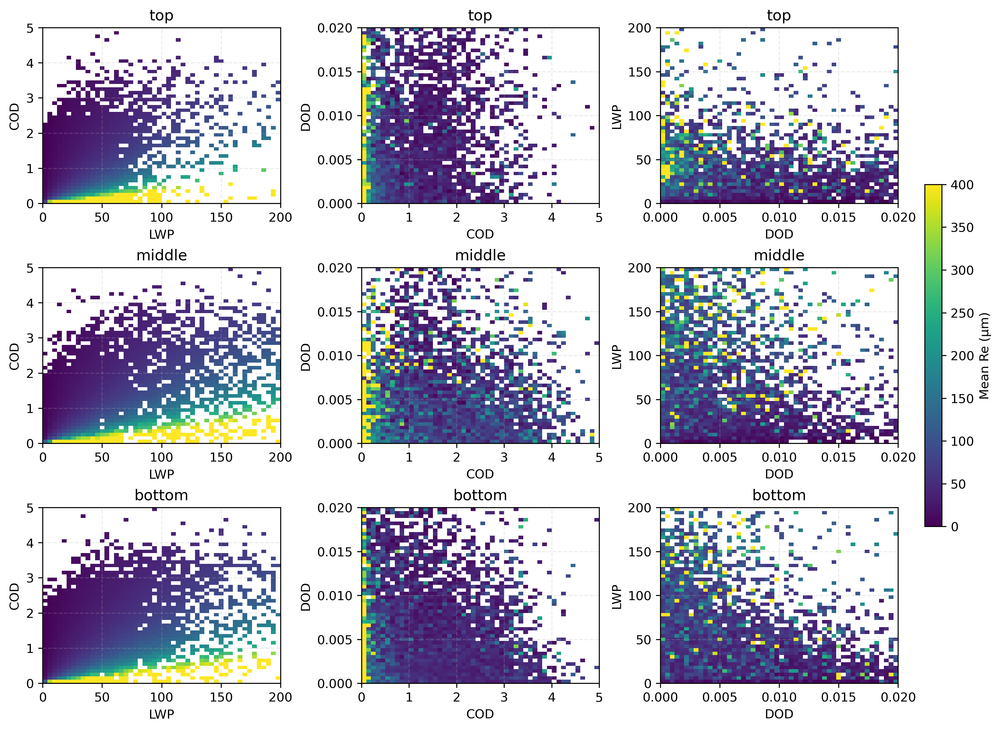

In [38]:
import numpy as np
import matplotlib.pyplot as plt

cats = ["top","middle","bottom"]

def mean_re_grid(X, Y, Re, xedges, yedges, min_count=0):
    X=np.asarray(X,float).ravel(); Y=np.asarray(Y,float).ravel(); Re=np.asarray(Re,float).ravel()
    m=np.isfinite(X)&np.isfinite(Y)&np.isfinite(Re)
    X,Y,Re=X[m],Y[m],Re[m]
    S,_,_=np.histogram2d(X,Y,bins=[xedges,yedges],weights=Re)
    N,_,_=np.histogram2d(X,Y,bins=[xedges,yedges])
    M=S/np.where(N==0,np.nan,N); M[N < min_count]=np.nan
    return M.T

cod_edges = np.linspace(0, 5,    51)
lwp_edges = np.linspace(0, 200,  51)
dod_edges = np.linspace(0, 0.02, 51)

fig, ax = plt.subplots(3, 3, figsize=(11, 8), dpi=300, constrained_layout=True)
pcms = []

for i,c in enumerate(cats):
    COD=np.asarray(COD_by_cat[c],float).ravel()
    LWP=np.asarray(lwp_by_cat[c],float).ravel()
    DOD=np.asarray(DOD_by_cat[c],float).ravel()
    RE =np.asarray(re_by_cat[c], float).ravel()

    M = mean_re_grid(LWP, COD, RE, lwp_edges, cod_edges,)
    pcms.append(ax[i,0].pcolormesh(lwp_edges, cod_edges, M, shading="auto", vmin=0, vmax=400))
    ax[i,0].set(xlabel="LWP", ylabel="COD", xlim=(0,200), ylim=(0,5), title=c)

    M = mean_re_grid(COD, DOD, RE, cod_edges, dod_edges,)
    pcms.append(ax[i,1].pcolormesh(cod_edges, dod_edges, M, shading="auto", vmin=0, vmax=400))
    ax[i,1].set(xlabel="COD", ylabel="DOD", xlim=(0,5), ylim=(0,0.02), title=c)

    M = mean_re_grid(DOD, LWP, RE, dod_edges, lwp_edges,)
    pcm = ax[i,2].pcolormesh(dod_edges, lwp_edges, M, shading="auto", vmin=0, vmax=400)
    pcms.append(pcm)
    ax[i,2].set(xlabel="DOD", ylabel="LWP", xlim=(0,0.02), ylim=(0,200), title=c)

for a in ax.ravel(): a.grid(alpha=0.25, ls="--")

cb = fig.colorbar(pcms[-1], ax=ax, fraction=0.02, pad=0.01)
cb.set_label("Mean Re (µm)")
plt.show()



## monthly and diurnal trend of DOD

### Whole data, no classfication

In [88]:
# ====== A. 数据处理 ======
import numpy as np
import pandas as pd
import xarray as xr

# --- 0) 基础：参数/颜色与层定义 ---
order = [
    ("dust_AOD_0_200m",    "0-200 m",    "#9C4F96"),
    ("dust_AOD_200_400m",  "200-400 m",  "#FF6355"),
    ("dust_AOD_400_600m",  "400-600 m",  "#FBA949"),
    ("dust_AOD_600_800m",  "600-800 m",  "#FAE442"),
    ("dust_AOD_800_1200m", "800-1200 m", "#8BD448"),
    ("dust_AOD_gt_1200m",  ">1200 m",    "#2AA8F2"),
]

layers_km = [(0.00,0.20),(0.20,0.40),(0.40,0.60),(0.60,0.80),(0.80,1.20),(1.20,999.0)]
layer_names = [x[0] for x in order]

# --- 1) QC：去掉 >1 的点（对 Dask 友好）---
mask_valid = ext_dust.where(ext_dust <= 1)
pre_valid  = int(ext_dust.count().compute())
post_valid = int(mask_valid.count().compute())
n_filtered = pre_valid - post_valid
filtered_ratio = 100.0 * n_filtered / pre_valid if pre_valid > 0 else np.nan
print(f"[QC] 滤掉的数据: {n_filtered} / {pre_valid} ({filtered_ratio:.4f}%)")

ext_dust = mask_valid  # 替换为过滤后的版本

# --- 2) 按高度层积分（得到各层 DOD=分层AOD；沿 height_high 对 ext_dust*dz 积分）---
h_km = ds_a["height_high"]              # (km)
dzA  = (ext_dust * dz2d)                # 与 ext_dust 对齐的 Δz 权重

layer_results = {}
for (lo, hi), name in zip(layers_km, layer_names):
    mask_layer = (h_km >= lo) if hi >= 900 else ((h_km >= lo) & (h_km < hi))
    layer_results[name] = dzA.where(mask_layer).sum("height_high")

dust_AOD_layers = xr.Dataset(layer_results)  # (time,)

# 可选一致性检查：与整柱 AOD 比较
# dust_AOD_check = dust_AOD_layers.to_array("layer").sum("layer")

# --- 3) 季节平均的 extinction 剖面（曲线用）---
da_season = ext_dust.groupby("time.season").mean("time", skipna=True)
season_order = ["MAM", "JJA", "SON", "DJF"]
da_season = da_season.sel(season=season_order)

# --- 4) 简易本地时 (ENA 冬季近似：UTC-1h；若要精确 DST/LST，用你之前的函数) ---
dust_AOD_layers_local = dust_AOD_layers.assign_coords(
    time=dust_AOD_layers.indexes["time"] - pd.to_timedelta(1, "h")
)
ext_dust_local = ext_dust.assign_coords(
    time=ext_dust.indexes["time"] - pd.to_timedelta(1, "h")
)

# --- 5) 逐小时统计（画日变化堆叠 & 两条总线，以及 02/08/24h 剖面）---
# 各层逐时均值（0..23）
layer_hour_means = []
for var, _, _ in order:
    hmean = dust_AOD_layers_local[var].groupby("time.hour").mean("time", skipna=True)
    layer_hour_means.append(hmean.sel(hour=np.arange(24)).values)  # (24,)

# <800m 与 ≥800m 的逐时均值
low_hour  = sum(dust_AOD_layers_local[v].groupby("time.hour").mean("time", skipna=True)
                for v,_,_ in order[:4]).sel(hour=np.arange(24))
high_hour = sum(dust_AOD_layers_local[v].groupby("time.hour").mean("time", skipna=True)
                for v,_,_ in order[4:]).sel(hour=np.arange(24))

# 02/08/24h extinction 剖面
ext_hourly = ext_dust_local.groupby("time.hour").mean("time", skipna=True)  # (hour, height_high)
ext_mean   = ext_dust_local.mean("time", skipna=True)                       # (height_high,)

# --- 6) 逐月层平均（用于月循环子图；若不需要可跳过）---
def monthly_mean_sem(da):
    g   = da.groupby("time.month")
    mu  = g.mean("time", skipna=True)
    sd  = g.std("time",  skipna=True)
    n   = g.count("time")
    sem = sd / np.sqrt(xr.where(n>0, n, np.nan))
    return mu, sem

low_series  = sum(dust_AOD_layers[v] for v,_,_ in order[:4])
high_series = sum(dust_AOD_layers[v] for v,_,_ in order[4:])
low_mean,  low_sem  = monthly_mean_sem(low_series)
high_mean, high_sem = monthly_mean_sem(high_series)

layer_month_means = []
for var, _, _ in order:
    m, _ = monthly_mean_sem(dust_AOD_layers[var])
    layer_month_means.append(m.values)  # 每层的 12 个月均值


[QC] 滤掉的数据: 0 / 33039527 (0.0000%)


In [89]:
# --- 0) 基础：参数/颜色与层定义 ---
order = [
    ("dust_AOD_0_200m",    "0-200 m",    "#efa9a9"),
    ("dust_AOD_200_400m",  "200-400 m",  "#e88889"),
    ("dust_AOD_400_600m",  "400-600 m",  "#e26869"),
    ("dust_AOD_600_800m",  "600-800 m",  "#dc4748"),
    ("dust_AOD_800_1200m", "800-1200 m", "#d62728"),
    ("dust_AOD_gt_1200m",  ">1200 m",    "#b62122"),
]

## Monthly and diurnal trend of Cloud

In [90]:
# ====== Warm low-cloud (cloud-top < 3 km, T>=273.15 K) layered COD: monthly & diurnal ======
import numpy as np
import pandas as pd
import xarray as xr

# -----------------------
# 0) layer settings (km)
# -----------------------
order_cloud = [
    ("cloud_COD_0_200m",     "0-200 m",     "#9C4F96"),
    ("cloud_COD_200_400m",   "200-400 m",   "#FF6355"),
    ("cloud_COD_400_600m",   "400-600 m",   "#FBA949"),
    ("cloud_COD_600_800m",   "600-800 m",   "#FAE442"),
    ("cloud_COD_800_1200m",  "800-1200 m",  "#8BD448"),
    ("cloud_COD_1200_3000m", "1200-3000 m", "#2AA8F2"),
]
layers_km_cloud = [(0.00,0.20),(0.20,0.40),(0.40,0.60),(0.60,0.80),(0.80,1.20),(1.20,3.00)]
cloud_layer_names = [x[0] for x in order_cloud]

# height coord (km) for vertical masks
h_km = ds_a["height_high"]  # (height_high,) in km

# -------------------------------------------------------
# 1) low-cloud selection MUST be by profile cloud-top <3km
#    You have: top_km.shape=(N,) and ext_cloud.shape=(N, nlev)
# -------------------------------------------------------
# Make a boolean mask aligned to ext_cloud's first dimension.
# If ext_cloud is DataArray with dim 'time' (or similar), keep that.
if isinstance(ext_cloud, xr.DataArray):
    prof_dim = ext_cloud.dims[0]
    if isinstance(cloud_top_height, xr.DataArray):
        # align to same dim/coords if possible
        if cloud_top_height.dims == (prof_dim,):
            cloud_top_height_da = cloud_top_height
        else:
            cloud_top_height_da = xr.DataArray(cloud_top_height.values, dims=[prof_dim], coords={prof_dim: ext_cloud[prof_dim]})
    else:
        cloud_top_height_da = xr.DataArray(np.asarray(cloud_top_height), dims=[prof_dim], coords={prof_dim: ext_cloud[prof_dim]})
    mask_low_prof = cloud_top_height_da < 3.0
else:
    # fallback (unlikely in your workflow since ext_cloud is usually an xarray object)
    raise TypeError("ext_cloud should be an xarray.DataArray with dims like (time, height_high).")

# Apply profile-level mask (keeps full vertical structure for low clouds)
ext_cloud_low = ext_cloud.where(mask_low_prof)

# -------------------------------------------------------
# 2) QC for cloud extinction (already warm-cloud + ext>0 in your pipeline)
#    keep only (0, 20] km^-1
# -------------------------------------------------------
ext_cloud_low = ext_cloud_low.where(ext_cloud_low > 0)
pre_valid_c  = int(ext_cloud_low.count().compute())
ext_cloud_low = ext_cloud_low.where(ext_cloud_low <= 20)
post_valid_c = int(ext_cloud_low.count().compute())
n_filtered_c = pre_valid_c - post_valid_c
filtered_ratio_c = 100.0 * n_filtered_c / pre_valid_c if pre_valid_c > 0 else np.nan
print(f"[QC-cloud] 滤掉的数据: {n_filtered_c} / {pre_valid_c} ({filtered_ratio_c:.4f}%)")

# -------------------------------------------------------
# 3) Layer-integrated COD contributions: sum(ext_cloud_low * dz) within height bins
#    dz2d must be aligned to ext_cloud (same dims as ext_cloud)
# -------------------------------------------------------
dzC = ext_cloud_low * dz2d

cloud_layer_results = {}
for (lo, hi), name in zip(layers_km_cloud, cloud_layer_names):
    mask_layer = (h_km >= lo) & (h_km < hi)   # (height_high,)
    cloud_layer_results[name] = dzC.where(mask_layer).sum("height_high")

cloud_COD_layers = xr.Dataset(cloud_layer_results)  # (time,)

# Optional: low-cloud (cloud-top<3 km) total COD (column)
COD_low = (ext_cloud_low * dz2d).sum("height_high")  # (time,)

# -------------------------------------------------------
# 4) Seasonal mean extinction profile (for curves)
# -------------------------------------------------------
cloud_season = ext_cloud_low.groupby(f"{prof_dim}.season").mean(prof_dim, skipna=True)
season_order = ["MAM", "JJA", "SON", "DJF"]
cloud_season = cloud_season.sel(season=season_order)

# -------------------------------------------------------
# 5) Simple local time shift (ENA winter approx UTC-1h), same as your dust workflow
# -------------------------------------------------------
cloud_COD_layers_local = cloud_COD_layers.assign_coords(
    {prof_dim: cloud_COD_layers.indexes[prof_dim] - pd.to_timedelta(1, "h")}
)
ext_cloud_low_local = ext_cloud_low.assign_coords(
    {prof_dim: ext_cloud_low.indexes[prof_dim] - pd.to_timedelta(1, "h")}
)
COD_low_local = COD_low.assign_coords(
    {prof_dim: COD_low.indexes[prof_dim] - pd.to_timedelta(1, "h")}
)

# -------------------------------------------------------
# 6) Diurnal cycle (hourly means) for stacked layers + two totals (<800m vs >=800m)
# -------------------------------------------------------
# per-layer hourly mean (0..23)
cloud_layer_hour_means = []
for var, _, _ in order_cloud:
    hmean = cloud_COD_layers_local[var].groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True)
    cloud_layer_hour_means.append(hmean.sel(hour=np.arange(24)).values)  # list of (24,)

# totals: <800m (first 4 layers) and >=800m (last 2 layers)
cloud_low_hour = sum(
    cloud_COD_layers_local[v].groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True)
    for v,_,_ in order_cloud[:4]
).sel(hour=np.arange(24))

cloud_high_hour = sum(
    cloud_COD_layers_local[v].groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True)
    for v,_,_ in order_cloud[4:]
).sel(hour=np.arange(24))

# total low-cloud COD diurnal (column)
COD_low_hour = COD_low_local.groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True).sel(hour=np.arange(24))

# extinction profiles at each hour + overall mean profile
cloud_ext_hourly = ext_cloud_low_local.groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True)  # (hour, height_high)
cloud_ext_mean   = ext_cloud_low_local.mean(prof_dim, skipna=True)                              # (height_high,)

# -------------------------------------------------------
# 7) Monthly cycle (mean + SEM), same helper as your dust workflow
# -------------------------------------------------------
def monthly_mean_sem(da, time_dim=prof_dim):
    g   = da.groupby(f"{time_dim}.month")
    mu  = g.mean(time_dim, skipna=True)
    sd  = g.std(time_dim,  skipna=True)
    n   = g.count(time_dim)
    sem = sd / np.sqrt(xr.where(n>0, n, np.nan))
    return mu, sem

# totals monthly mean/sem
cloud_low_series  = sum(cloud_COD_layers[v] for v,_,_ in order_cloud[:4])
cloud_high_series = sum(cloud_COD_layers[v] for v,_,_ in order_cloud[4:])
cloud_low_mean,  cloud_low_sem  = monthly_mean_sem(cloud_low_series)
cloud_high_mean, cloud_high_sem = monthly_mean_sem(cloud_high_series)

COD_low_mean, COD_low_sem = monthly_mean_sem(COD_low)

# per-layer monthly means (12 months) for stacked monthly plots
cloud_layer_month_means = []
for var, _, _ in order_cloud:
    m, _ = monthly_mean_sem(cloud_COD_layers[var])
    cloud_layer_month_means.append(m.values)  # each is (12,)


[QC-cloud] 滤掉的数据: 0 / 4780257 (0.0000%)


In [91]:
# ============================================================
# 8) Low-level warm cloud (cloud_top<3km) LWP / top / base
#     monthly & diurnal means (and SEM)
# ============================================================

# ---- 8.1 把 lwp/top/base 变成与 prof_dim 对齐的 DataArray ----
def as_prof_da(x, name):
    if isinstance(x, xr.DataArray):
        if x.dims == (prof_dim,):
            return x.rename(name)
        return xr.DataArray(x.values, dims=[prof_dim], coords={prof_dim: ext_cloud[prof_dim]}, name=name)
    return xr.DataArray(np.asarray(x), dims=[prof_dim], coords={prof_dim: ext_cloud[prof_dim]}, name=name)

lwp_da   = as_prof_da(lwp, "lwp")
ctop_da  = as_prof_da(cloud_top_height, "cloud_top_height")
cbase_da = as_prof_da(cloud_base_height, "cloud_base_height")

# ---- 8.2 只保留 low-level warm cloud 的廓线（mask_low_prof 是 (prof_dim,)） ----
lwp_low   = lwp_da.where(mask_low_prof)
ctop_low  = ctop_da.where(mask_low_prof)
cbase_low = cbase_da.where(mask_low_prof)

# （可选）再做一点物理 QC：base<=top、非负、且 top<3km 已满足
valid_geom = (cbase_low >= 0) & (ctop_low >= 0) & (cbase_low <= ctop_low)
lwp_low   = lwp_low.where(valid_geom)
ctop_low  = ctop_low.where(valid_geom)
cbase_low = cbase_low.where(valid_geom)

# ---- 8.3 与你的 ENA 本地时处理一致：UTC-1h shift ----
lwp_low_local   = lwp_low.assign_coords({prof_dim: lwp_low.indexes[prof_dim] - pd.to_timedelta(1, "h")})
ctop_low_local  = ctop_low.assign_coords({prof_dim: ctop_low.indexes[prof_dim] - pd.to_timedelta(1, "h")})
cbase_low_local = cbase_low.assign_coords({prof_dim: cbase_low.indexes[prof_dim] - pd.to_timedelta(1, "h")})

# ---- 8.4 diurnal means (0..23) ----
lwp_low_hour   = lwp_low_local.groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True).sel(hour=np.arange(24))
ctop_low_hour  = ctop_low_local.groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True).sel(hour=np.arange(24))
cbase_low_hour = cbase_low_local.groupby(f"{prof_dim}.hour").mean(prof_dim, skipna=True).sel(hour=np.arange(24))

# ---- 8.5 monthly means (+SEM) ----
lwp_low_mean,   lwp_low_sem   = monthly_mean_sem(lwp_low)
ctop_low_mean,  ctop_low_sem  = monthly_mean_sem(ctop_low)
cbase_low_mean, cbase_low_sem = monthly_mean_sem(cbase_low)

# ---- 8.6 (可选) diurnal SEM：如果你要画 hour 上的误差带 ----
def hourly_mean_sem(da, time_dim=prof_dim):
    g   = da.groupby(f"{time_dim}.hour")
    mu  = g.mean(time_dim, skipna=True)
    sd  = g.std(time_dim,  skipna=True)
    n   = g.count(time_dim)
    sem = sd / np.sqrt(xr.where(n>0, n, np.nan))
    return mu.sel(hour=np.arange(24)), sem.sel(hour=np.arange(24))

lwp_low_hour_mu,   lwp_low_hour_sem   = hourly_mean_sem(lwp_low_local)
ctop_low_hour_mu,  ctop_low_hour_sem  = hourly_mean_sem(ctop_low_local)
cbase_low_hour_mu, cbase_low_hour_sem = hourly_mean_sem(cbase_low_local)

print("[low-warm-cloud] samples kept:",
      int(mask_low_prof.sum().compute()) if hasattr(mask_low_prof, "compute") else int(np.sum(mask_low_prof.values)))


[low-warm-cloud] samples kept: 382596


In [92]:
import numpy as np
import pandas as pd
import xarray as xr

# ---- 1) 对齐到 time 维（prof_dim）----
# 复用你前面代码里的 prof_dim（ext_cloud.dims[0]），如果你这里没有，就用 dust_top_height 的维度名
prof_dim = ext_cloud.dims[0]  # 你前面已经有 ext_cloud，最稳

def as_prof_da(x, name):
    if isinstance(x, xr.DataArray):
        if x.dims == (prof_dim,):
            return x.rename(name)
        return xr.DataArray(x.values, dims=[prof_dim], coords={prof_dim: ext_cloud[prof_dim]}, name=name)
    return xr.DataArray(np.asarray(x), dims=[prof_dim], coords={prof_dim: ext_cloud[prof_dim]}, name=name)

dtop  = as_prof_da(dust_top_height,  "dust_top_height")
dbase = as_prof_da(dust_base_height, "dust_base_height")

# ---- 2) 可选 QC：非负、base<=top ----
mask_geom = (dtop >= 0) & (dbase >= 0) & (dbase <= dtop)
dtop  = dtop.where(mask_geom)
dbase = dbase.where(mask_geom)

# ---- 3) 本地时（如果你 dust 也要和前面一致：ENA 冬季近似 UTC-1h）----
dtop_local  = dtop.assign_coords({prof_dim: dtop.indexes[prof_dim] - pd.to_timedelta(1, "h")})
dbase_local = dbase.assign_coords({prof_dim: dbase.indexes[prof_dim] - pd.to_timedelta(1, "h")})

# ---- 4) monthly mean + SEM（复用你之前的 monthly_mean_sem）----
def monthly_mean_sem(da, time_dim=prof_dim):
    g   = da.groupby(f"{time_dim}.month")
    mu  = g.mean(time_dim, skipna=True)
    sd  = g.std(time_dim,  skipna=True)
    n   = g.count(time_dim)
    sem = sd / np.sqrt(xr.where(n>0, n, np.nan))
    return mu, sem

dtop_month_mean,  dtop_month_sem  = monthly_mean_sem(dtop_local)
dbase_month_mean, dbase_month_sem = monthly_mean_sem(dbase_local)

# ---- 5) hourly(diurnal) mean + SEM ----
def hourly_mean_sem(da, time_dim=prof_dim):
    g   = da.groupby(f"{time_dim}.hour")
    mu  = g.mean(time_dim, skipna=True)
    sd  = g.std(time_dim,  skipna=True)
    n   = g.count(time_dim)
    sem = sd / np.sqrt(xr.where(n>0, n, np.nan))
    return mu.sel(hour=np.arange(24)), sem.sel(hour=np.arange(24))

dtop_hour_mean,  dtop_hour_sem  = hourly_mean_sem(dtop_local)
dbase_hour_mean, dbase_hour_sem = hourly_mean_sem(dbase_local)


In [93]:
# 假设 mask_low_prof 是 xarray.DataArray，dim = (prof_dim,)

cloud_thickness_da = xr.DataArray(
    cloud_thickness,
    dims=[prof_dim],
    coords={prof_dim: ext_cloud[prof_dim]},
    name="cloud_thickness"
)

cloud_mean_height_da = xr.DataArray(
    cloud_mean_height,
    dims=[prof_dim],
    coords={prof_dim: ext_cloud[prof_dim]},
    name="cloud_mean_height"
)

cloud_thickness_low_warm   = cloud_thickness_da.where(mask_low_prof)
cloud_mean_height_low_warm = cloud_mean_height_da.where(mask_low_prof)

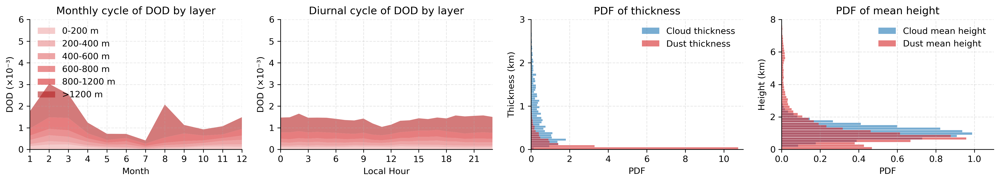

In [94]:
import numpy as np
import matplotlib.pyplot as plt

fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(16, 3), dpi=300)
hours, months = np.arange(24), np.arange(1, 13)

# ===================== (1) Monthly DOD by layer =====================
y, yticks = np.zeros(12), np.linspace(0, 0.006, 7)
for vals, (_, lab, col) in zip(layer_month_means, order):
    ax1.fill_between(months, y, y+vals, color=col, alpha=0.6, label=lab, edgecolor="none", linewidth=0); y += vals
ax1.set(xlim=(1,12), ylim=(0,0.006), xticks=months, xlabel="Month", ylabel="DOD (×10⁻³)", title="Monthly cycle of DOD by layer")
ax1.set_yticks(yticks); ax1.set_yticklabels([f"{v*1e3:.0f}" for v in yticks]); ax1.grid(alpha=0.25, ls="--"); ax1.legend(loc="upper left", frameon=False)

# ===================== (2) Diurnal DOD by layer =====================
y = np.zeros(24)
for vals, (_, _, col) in zip(layer_hour_means, order):
    ax2.fill_between(hours, y, y+vals, color=col, alpha=0.6, edgecolor="none", linewidth=0); y += vals
ax2.set(xlim=(0,23), ylim=(0,0.006), xticks=np.arange(0,24,3), xlabel="Local Hour", ylabel="DOD (×10⁻³)", title="Diurnal cycle of DOD by layer")
ax2.set_yticks(yticks); ax2.set_yticklabels([f"{v*1e3:.0f}" for v in yticks]); ax2.grid(alpha=0.3, ls="--")
# ========= PDF barh helper (custom bin) =========
hbar = lambda ax, a, bw, c, l, s=0: (
    lambda h,e: ax.barh(0.5*(e[:-1]+e[1:])+s, h, height=bw*0.9, color=c, alpha=0.6, label=l)
)(*np.histogram(
    a[np.isfinite(a)],
    bins=np.arange(np.nanmin(a)//bw*bw, np.nanmax(a)//bw*bw + bw, bw),
    density=True
))

# ========= ax3: thickness PDF (bin = 0.2 km) =========
hbar(ax3, cloud_thickness_low_warm, 0.05, "tab:blue", "Cloud thickness", )
hbar(ax3, dust_thickness,           0.05, "tab:red",  "Dust thickness",  )
ax3.set(xlabel="PDF", ylabel="Thickness (km)", title="PDF of thickness")
ax3.grid(alpha=0.3, ls="--"); ax3.legend(frameon=False)
ax3.set_ylim(0, 3) 
ax3.set_xlim(0, 11)
ax3.set_yticks([0, 1, 2, 3])
# ========= ax4: mean height PDF (bin = 0.5 km) =========
hbar(ax4, cloud_mean_height_low_warm, 0.15, "tab:blue", "Cloud mean height",)
hbar(ax4, dust_mean_height,           0.15, "tab:red",  "Dust mean height",)
ax4.set(xlabel="PDF", ylabel="Height (km)", title="PDF of mean height")
ax4.grid(alpha=0.3, ls="--"); ax4.legend(frameon=False)
ax4.set_ylim(0, 8) 
ax4.set_xlim(0, 1.1)
# # ===================== (3) Seasonal mean dust extinction profile =====================
# season_colors = {"MAM":"tab:green","JJA":"tab:red","SON":"tab:orange","DJF":"tab:blue"}
# for s in ["MAM","JJA","SON","DJF"]:
#     ax3.plot(da_season.sel(season=s).values, da_season["height_high"].values, lw=1, color=season_colors[s], label=s)
# ax3.set(xscale="log", xlim=(1e-4,0.2), xticks=[1e-4,1e-3,1e-2,1e-1,0.2], ylim=(0,8),
#         xlabel="Dust extinction (1/km)", ylabel="Height (km)", title="Seasonal mean dust extinction profile")
# ax3.xaxis.set_major_formatter(ticker.FuncFormatter(lambda v, p: f"{v:g}"))
# ax3.grid(alpha=0.3, ls="--"); ax3.legend(loc="best", frameon=False)

# # ===================== (4) Hourly extinction profiles =====================
# ax4.plot(ext_hourly.sel(hour=2).values,  ext_hourly.height_high.values,  lw=1, color="tab:blue",   label="02:00")
# ax4.plot(ext_hourly.sel(hour=11).values, ext_hourly.height_high.values,  lw=1, color="tab:orange", label="11:00")
# ax4.plot(ext_mean.values,                ext_mean.height_high.values,   "k--", lw=1, label="24h mean")
# ax4.set(xscale="log", xlim=(1e-4,0.2), xticks=[1e-4,1e-3,1e-2,1e-1,0.2], ylim=(0,8),
#         xlabel="Dust extinction (1/km)", ylabel="Height (km)", title="Extinction profiles at 02, 11, 24h mean")
# ax4.xaxis.set_major_formatter(ticker.FuncFormatter(lambda v, p: f"{v:g}"))
# ax4.grid(alpha=0.3, ls="--"); ax4.legend(loc="best", frameon=False)

for ax in (ax1, ax2, ax3, ax4):
    ax.spines["top"].set_visible(False); ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.savefig("figsave/ENA_dust_chara.pdf", dpi=300, bbox_inches="tight")
plt.show()

In [95]:
order_cloud = [
    ("cloud_COD_0_200m",     "0-200 m",     "#a5c9e1"),
    ("cloud_COD_200_400m",   "200-400 m",   "#84b4d6"),
    ("cloud_COD_400_600m",   "400-600 m",   "#62a0cb"),
    ("cloud_COD_600_800m",   "600-800 m",   "#418bbf"),
    ("cloud_COD_800_1200m",  "800-1200 m",  "#1f77b4"),
    ("cloud_COD_1200_3000m", "1200-3000 m", "#1a6599"),
]


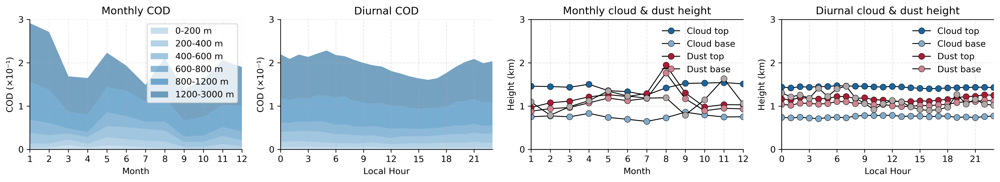

In [96]:
import matplotlib.pyplot as plt
import numpy as np

# =======================
# Fixed style knobs
# =======================
FIGSIZE, DPI = (16, 3), 300
ALPHA_FILL = 0.6
COD_YLIM = (0, 0.3)
COD_YTICKS = [0.0, 0.1, 0.2, 0.3]
COD_YTICKLAB = ["0", "1", "2", "3"]
H_YLIM, H_YTICKS = (0, 3), [0, 1, 2, 3]
GRID1, GRID2 = dict(alpha=0.25, ls="--"), dict(alpha=0.3, ls="--")
FILL_KW = dict(alpha=ALPHA_FILL, linewidth=0, edgecolor="none")

MS, MEW = 7, 0.4
LINE_KW = dict(color="k", lw=1, marker="o", ms=MS, mec="k", mew=MEW)

# top colors (unchanged)
CLOUD_TOP_KW = dict(mfc="#1a659e")
DUST_TOP_KW  = dict(mfc="#a71e34")

# base colors (modified)
CLOUD_BASE_KW = dict(mfc="#81aaca")
DUST_BASE_KW  = dict(mfc="#cf838f")

# =======================
# Figure / axes
# =======================
fig, axes = plt.subplots(1, 4, figsize=FIGSIZE, dpi=DPI)
ax1, ax2, ax3, ax4 = axes
hours, months = np.arange(24), np.arange(1, 13)

# =======================
# (1) Monthly stacked COD
# =======================
y = np.zeros_like(months, dtype=float)
for vals, (_, lab, col) in zip(cloud_layer_month_means, order_cloud):
    ax1.fill_between(months, y, y + vals, color=col, label=lab, **FILL_KW)
    y += vals

ax1.set(
    xlim=(1, 12), ylim=COD_YLIM,
    xticks=months, yticks=COD_YTICKS, yticklabels=COD_YTICKLAB,
    xlabel="Month", ylabel="COD (×10⁻¹)", title="Monthly COD"
)
ax1.grid(**GRID1)
ax1.legend(loc="upper right", frameon=True)

# =======================
# (2) Diurnal stacked COD
# =======================
y = np.zeros_like(hours, dtype=float)
for vals, (_, _, col) in zip(cloud_layer_hour_means, order_cloud):
    ax2.fill_between(hours, y, y + vals, color=col, **FILL_KW)
    y += vals

ax2.set(
    xlim=(0, 23), ylim=COD_YLIM,
    xticks=np.arange(0, 24, 3),
    yticks=COD_YTICKS, yticklabels=COD_YTICKLAB,
    xlabel="Local Hour", ylabel="COD (×10⁻¹)", title="Diurnal COD"
)
ax2.grid(**GRID2)

# =======================
# (3) Monthly heights — markers only
# =======================
ax3.plot(months, ctop_low_mean,  label="Cloud top",  **LINE_KW, **CLOUD_TOP_KW)
ax3.plot(months, cbase_low_mean, label="Cloud base", **LINE_KW, **CLOUD_BASE_KW)
ax3.plot(months, dtop_month_mean,  label="Dust top",  **LINE_KW, **DUST_TOP_KW)
ax3.plot(months, dbase_month_mean, label="Dust base", **LINE_KW, **DUST_BASE_KW)

ax3.set(
    xlim=(1, 12), ylim=H_YLIM, yticks=H_YTICKS, xticks=months,
    xlabel="Month", ylabel="Height (km)", title="Monthly cloud & dust height"
)
ax3.grid(**GRID2)
ax3.legend(loc="upper right", frameon=False)

# =======================
# (4) Diurnal heights — markers only
# =======================
ax4.plot(hours, ctop_low_hour_mu,  label="Cloud top",  **LINE_KW, **CLOUD_TOP_KW)
ax4.plot(hours, cbase_low_hour_mu, label="Cloud base", **LINE_KW, **CLOUD_BASE_KW)
ax4.plot(hours, dtop_hour_mean,  label="Dust top",  **LINE_KW, **DUST_TOP_KW)
ax4.plot(hours, dbase_hour_mean, label="Dust base", **LINE_KW, **DUST_BASE_KW)

ax4.set(
    xlim=(0, 23), ylim=H_YLIM, yticks=H_YTICKS,
    xticks=np.arange(0, 24, 3),
    xlabel="Local Hour", ylabel="Height (km)", title="Diurnal cloud & dust height"
)
ax4.grid(**GRID2)
ax4.legend(loc="upper right", frameon=False)





# --- twin y-axis for LWP (monthly) ---
ax3_lwp = ax3.twinx()
ax3_lwp.plot(
    months, lwp_low_mean,
    "-o", lw=1, color="k", mew=0.4,   
    mec="k", mfc="#b1a7a6", ms=7, alpha=1
)

# hide twin y-axis
ax3_lwp.set_ylim(50, 140)
ax3_lwp.tick_params(right=False, labelright=False)
ax3_lwp.spines["right"].set_visible(False)



# --- twin y-axis for LWP (diurnal) ---
ax4_lwp = ax4.twinx()
ax4_lwp.plot(
    hours, lwp_low_hour,
    "-o", lw=1, color="k", mew=0.4,   
    mec="k", mfc="#b1a7a6", ms=7, alpha=1
)

# hide twin y-axis
ax4_lwp.set_ylim(50, 140)
ax4_lwp.tick_params(right=False, labelright=False)
ax4_lwp.spines["right"].set_visible(False)

# =======================
# Common style
# =======================
for ax in axes:
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

plt.tight_layout()
plt.savefig("figsave/ENA_cloud_chara.pdf", dpi=DPI, bbox_inches="tight")
plt.show()

## Break down to 5 catagries

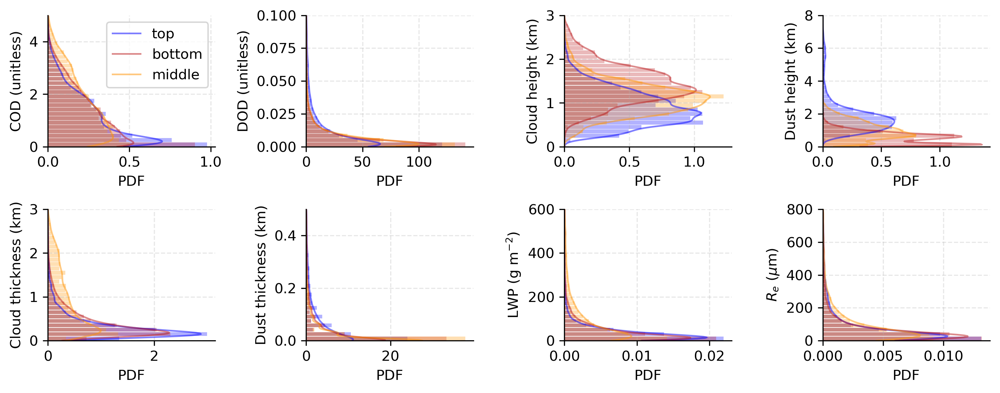

In [52]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

cats_to_plot = ["top", "bottom", "middle"]
cat_colors = {"top": "b", "bottom": "#ba181b", "middle": "#ff9505"}

def plot_pdf_hist(ax, data_list, labels, colors, yrange, nbins=30):
    lo, hi = yrange
    clean = []
    for d, lab, col in zip(data_list, labels, colors):
        if d is None: 
            continue
        arr = np.asarray(d)
        arr = arr[np.isfinite(arr)]
        arr = arr[(arr >= lo) & (arr <= hi)]
        if arr.size < 5: 
            continue
        clean.append((arr, lab, col))

    if not clean:
        ax.text(0.5, 0.5, "No Data", ha="center", va="center", transform=ax.transAxes)
        return

    # ==== 计算 bins ====
    bins = np.linspace(lo, hi, nbins + 1)
    centers = 0.5 * (bins[:-1] + bins[1:])
    bin_h = (hi - lo) / nbins * 0.9

    for arr, lab, col in clean:

        # ======= ⭐ 柱状图（PDF histogram）======
        hist, _ = np.histogram(arr, bins=bins, density=True)
        ax.barh(
            centers, hist, height=bin_h,
            color=col, alpha=0.3, edgecolor=None
        )

        # ======= ⭐ KDE 曲线 =======
        if arr.size > 5:
            try:
                kde = gaussian_kde(arr)
                y_kde = np.linspace(lo, hi, 200)
                x_kde = kde(y_kde)
                ax.plot(x_kde, y_kde, color=col, linewidth=1.2, alpha=0.5, label=lab)
            except Exception:
                pass

    ax.set_xlim(left=0); ax.set_ylim(lo, hi)
    ax.legend()


var_configs = [
    dict(key="COD_by_cat",       title="COD",              yrange=(0, 5),    ylabel="COD (unitless)"),
    dict(key="DOD_by_cat",       title="DOD",              yrange=(0, 0.1),  ylabel="DOD (unitless)"),
    dict(key="cloud_mh_by_cat",  title="Cloud Mean Height",yrange=(0, 3),    ylabel="Cloud height (km)"),
    dict(key="dust_mh_by_cat",   title="Dust Mean Height", yrange=(0, 8),    ylabel="Dust height (km)"),
    dict(key="cloud_tn_by_cat",  title="Cloud Thickness",  yrange=(0, 3),    ylabel="Cloud thickness (km)"),
    dict(key="dust_tn_by_cat",   title="Dust Thickness",   yrange=(0, 0.5),  ylabel="Dust thickness (km)"),
    dict(key="lwp_by_cat",       title="LWP",              yrange=(0, 600),  ylabel=r"LWP (g m$^{-2}$)"),
    dict(key="re_by_cat",        title=r"$R_e$",           yrange=(0, 800),  ylabel=r"$R_e$ ($\mu$m)"),
]

n_rows, n_cols = 2, 4
fig, axes = plt.subplots(n_rows, n_cols, figsize=(10, 4), dpi=300)
plt.subplots_adjust(hspace=0.35, wspace=0.3)
axes_flat = axes.ravel()

for idx, (ax, cfg) in enumerate(zip(axes_flat, var_configs)):
    data_dict = globals()[cfg["key"]]
    data_list = [data_dict[cat] for cat in cats_to_plot]
    labels    = cats_to_plot
    colors    = [cat_colors[cat] for cat in cats_to_plot]

    plot_pdf_hist(ax, data_list=data_list, labels=labels, colors=colors, yrange=cfg["yrange"], nbins=30)

    # ⭐ 只保留第 1 张图的 legend
    if idx != 0 and ax.get_legend() is not None:
        ax.get_legend().remove()

    ax.set_xlabel("PDF"); 
    ax.set_ylabel(cfg["ylabel"]); 
    ax.grid(ls="--", alpha=0.3)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
# 删除空图（如果不足 8）
if len(var_configs) < n_rows * n_cols:
    for k in range(len(var_configs), n_rows * n_cols):
        fig.delaxes(axes_flat[k])

plt.tight_layout()
# plt.savefig("figsave/ENA_3_chara.pdf", dpi=300, bbox_inches='tight')
plt.show()


## monthly and diurnal variability of 5 cate

In [39]:
import numpy as np

# 3个类别的 df
dfs = {"top": df_top.copy(), "middle": df_middle.copy(), "bottom": df_bottom.copy()}

# 你要追加的所有 by_cat 变量（列名 -> dict）
bycats = {
    "cloud_mh": cloud_mh_by_cat,
    "dust_mh":  dust_mh_by_cat,
    "cloud_tn": cloud_tn_by_cat,
    "dust_tn":  dust_tn_by_cat,

    "dust_th":  dust_th_by_cat,
    "dust_bh":  dust_bh_by_cat,
    "cloud_th": cloud_th_by_cat,
    "cloud_bh": cloud_bh_by_cat,

    "COD":      COD_by_cat,
    "DOD":      DOD_by_cat,
    "LWP":      lwp_by_cat,
    "LWC":      lwc_by_cat,
    "Re":       re_by_cat,
    "CF":       cf_by_cat,
}

# 只加 top/middle/bottom
for cat, df in dfs.items():
    n = len(df)
    for col, dct in bycats.items():
        arr = np.asarray(dct[cat])
        if arr.shape[0] != n:
            raise ValueError(f"[{cat}] {col} length mismatch: df={n}, arr={arr.shape[0]}")
        df[col] = arr  # 追加到最右边
    dfs[cat] = df

df_top_new    = dfs["top"]
df_middle_new = dfs["middle"]
df_bottom_new = dfs["bottom"]


## Influence of Meteorology Covariation

In [40]:
import numpy as np

def split_by_quantile(var, name=None):
    v = np.asarray(var, float)
    if name in ("VV","VV_4"):
        return {"low": (v<=0), "high": (v>0)}
    m = np.nanmedian(v)
    return {"low": (v<m), "high": (v>=m)}


# ===== 按分位数划分 =====
rh_bins  = split_by_quantile(RH_valid)
lts_bins = split_by_quantile(LTS_valid)
vws_bins = split_by_quantile(VWS_valid)
vv_bins = split_by_quantile(VV_valid)

# ===== 获取每档对应的 dust_AOD / COD / LWP =====
def extract_by_bins(bins_dict, name):
    out = {}
    for k, idx in bins_dict.items():
        out[k] = {
            "dust_AOD": dust_AOD_valid[idx],
            "COD":      COD_valid[idx],
            "LWP":      lwp_valid[idx],
        }
        print(f"{name} {k}: {np.sum(idx)} samples")
    return out

rh_groups  = extract_by_bins(rh_bins,  "RH")
lts_groups = extract_by_bins(lts_bins, "LTS")
vws_groups = extract_by_bins(vws_bins, "VWS")
vv_groups = extract_by_bins(vv_bins, "VV")

RH low: 5069 samples
RH high: 5070 samples
LTS low: 4967 samples
LTS high: 4968 samples
VWS low: 5066 samples
VWS high: 5066 samples
VV low: 4556 samples
VV high: 4557 samples


In [41]:
import numpy as np
import matplotlib.pyplot as plt

# ========= 参数（可调） =========
window_width=0.010; step=0.001; min_count_win=8; q_clip=(0.05,0.95)
linestyles={"low":"--","high":"--","All":"-"}; unit_map={"RH":"%","LTS":"K","VWS":"m s⁻¹"}

# ========= 工具函数 =========
def split_by_quantile(var, q=None, name=None):
    v=np.asarray(var,float); f=np.isfinite(v)
    z=np.zeros_like(v,bool)
    if f.sum()==0: return {"low":z,"high":z}, np.array([np.nan])
    if name in ("VV","VV_4"): return {"low":(v<=0)&f,"high":(v>0)&f}, np.array([0.0])
    m=np.nanmedian(v[f]); return {"low":(v<m)&f,"high":(v>=m)&f}, np.array([m])

def moving_window_xy(x, y, xmin, xmax, width, step):
    ctr=np.arange(xmin+width/2, xmax-width/2+step/2, step)
    xm=np.full_like(ctr,np.nan,float); ym=np.full_like(ctr,np.nan,float); sem=np.full_like(ctr,np.nan,float); cnt=np.zeros_like(ctr,int)
    m=np.isfinite(x)&np.isfinite(y); x,y=np.asarray(x,float)[m],np.asarray(y,float)[m]
    if x.size==0: return {"centers":ctr,"x_mean":xm,"y_mean":ym,"y_sem":sem,"count":cnt}
    h=width/2.0
    for i,c in enumerate(ctr):
        sel=(x>=c-h)&(x<c+h)
        if sel.any():
            xb,yb=x[sel],y[sel]; cnt[i]=xb.size; xm[i]=np.nanmean(xb); ym[i]=np.nanmean(yb)
            if xb.size>1: sem[i]=np.nanstd(yb,ddof=1)/np.sqrt(xb.size)
    return {"centers":ctr,"x_mean":xm,"y_mean":ym,"y_sem":sem,"count":cnt}

# ========= 1) 用 labels 做基础有效筛选 =========
mask_valid=~np.isnan(labels)
x_all=np.asarray(dust_AOD[mask_valid]); COD_all=np.asarray(COD[mask_valid]); LWP_all=np.asarray(lwp[mask_valid])
RH_all=np.asarray(RH[mask_valid]); LTS_all=np.asarray(LTS[mask_valid]); VWS_all=np.asarray(VWS[mask_valid])

# ========= 2) dust_AOD 去极值，并同步过滤 =========
fx=np.isfinite(x_all)
if fx.sum()==0: raise ValueError("dust_AOD 有效样本全为 NaN，无法计算分位数。")
q_lo,q_hi=np.nanquantile(x_all[fx], q_clip)
keep=(x_all>=q_lo)&(x_all<=q_hi)&np.isfinite(COD_all)&np.isfinite(LWP_all)&np.isfinite(RH_all)&np.isfinite(LTS_all)&np.isfinite(VWS_all)

x=x_all[keep]; COD_y=COD_all[keep]; LWP_y=LWP_all[keep]; RH_g=RH_all[keep]; LTS_g=LTS_all[keep]; VWS_g=VWS_all[keep]
xmin, xmax = np.nanmin(x), np.nanmax(x)
# ========= 3) 二分位分组（RH / LTS / VWS：median split） =========
rh_bins,rh_edge=split_by_quantile(RH_g, name="RH")
lts_bins,lts_edge=split_by_quantile(LTS_g, name="LTS")
vws_bins,vws_edge=split_by_quantile(VWS_g, name="VWS")

groups={"RH":(rh_bins,rh_edge), "LTS":(lts_bins,lts_edge), "VWS":(vws_bins,vws_edge)}


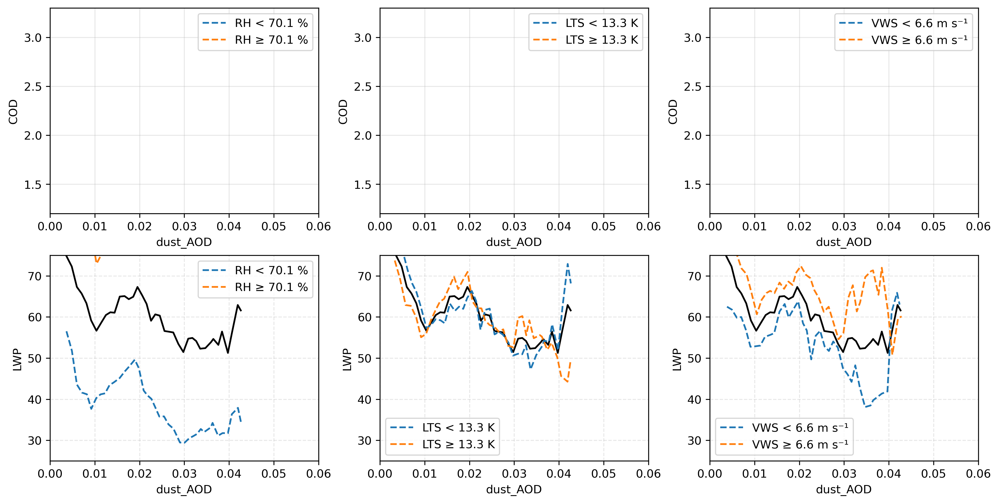

In [42]:
# ========= 4) 绘图（2×3） =========
fig,axes=plt.subplots(2,3,figsize=(12,6),dpi=300,constrained_layout=True)

for j,(gv_name,(bin_dict,edges)) in enumerate(groups.items()):
    unit=unit_map.get(gv_name,""); thr=float(edges[0]) if np.size(edges)>0 else np.nan
    idx_list=[bin_dict["low"],bin_dict["high"]]
    if gv_name in ("VV","VV_4"): labels_formatted=[f"{gv_name} ≤ 0 {unit}", f"{gv_name} > 0 {unit}"]
    else: labels_formatted=[f"{gv_name} < {thr:.1f} {unit}", f"{gv_name} ≥ {thr:.1f} {unit}"]

    ax=axes[0,j]
    r=moving_window_xy(x,COD_y,xmin,xmax,window_width,step); m=r["count"]>=min_count_win
    ax.plot(r["x_mean"][m],r["y_mean"][m],color="black",ls=linestyles["All"],label="_nolegend_")
    for idx,lbl in zip(idx_list,labels_formatted):
        if idx.sum()==0: continue
        r=moving_window_xy(x[idx],COD_y[idx],xmin,xmax,window_width,step); m=r["count"]>=min_count_win
        ax.plot(r["x_mean"][m],r["y_mean"][m],ls="--",label=lbl)
    ax.set(xlabel="dust_AOD",ylabel="COD",xlim=(0,0.06),ylim=(1.2,3.3)); ax.grid(True,alpha=0.3); ax.legend()

    ax=axes[1,j]
    r=moving_window_xy(x,LWP_y,xmin,xmax,window_width,step); m=r["count"]>=min_count_win
    ax.plot(r["x_mean"][m],r["y_mean"][m],color="black",ls=linestyles["All"],label="_nolegend_")
    for idx,lbl in zip(idx_list,labels_formatted):
        if idx.sum()==0: continue
        r=moving_window_xy(x[idx],LWP_y[idx],xmin,xmax,window_width,step); m=r["count"]>=min_count_win
        ax.plot(r["x_mean"][m],r["y_mean"][m],ls="--",label=lbl)
    ax.set(xlabel="dust_AOD",ylabel="LWP",xlim=(0,0.06),ylim=(25,75)); ax.grid(ls="--",alpha=0.3); ax.legend()

plt.show()

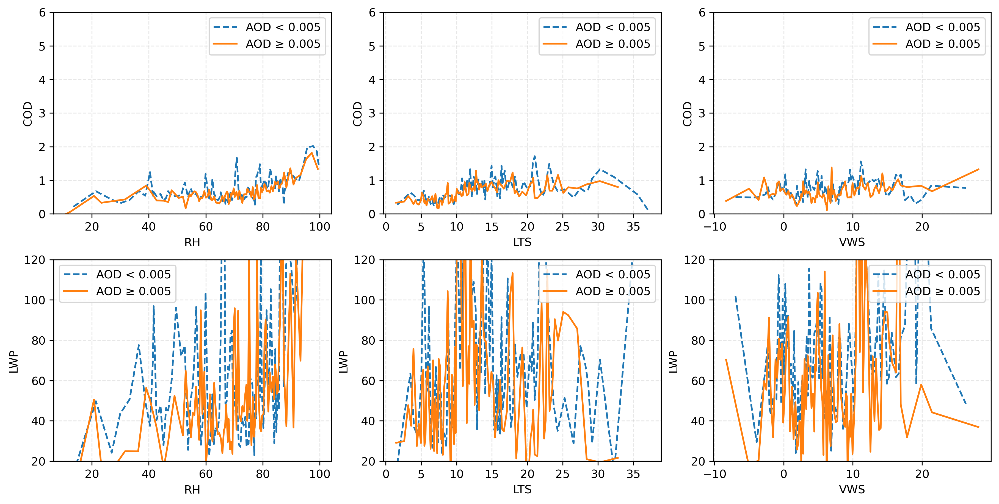

AOD clip (0.05, 0.95): [0.000,0.048], split=0.005, n_bins=100, min_count=8


In [43]:
import numpy as np, matplotlib.pyplot as plt

q_clip=(0.05,0.95); AOD_SPLIT=None; n_bins=100; min_count_bin=8

def equal_frequency_xy(x,y,n_bins=100):
    x,y=np.asarray(x,float),np.asarray(y,float)
    m=np.isfinite(x)&np.isfinite(y); x,y=x[m],y[m]
    if x.size==0: return dict(x_mean=[],y_mean=[],count=[])
    o=np.argsort(x); x,y=x[o],y[o]; n=x.size
    edges=np.linspace(0,n,n_bins+1,dtype=int)
    xm,ym,c=[],[],[]
    for i in range(n_bins):
        s,e=edges[i],edges[i+1]
        if e-s<1: continue
        xb,yb=x[s:e],y[s:e]
        xm.append(np.nanmean(xb)); ym.append(np.nanmean(yb)); c.append(xb.size)
    return dict(x_mean=np.array(xm),y_mean=np.array(ym),count=np.array(c))

# ==== 基础筛选 ====
try: mask=~np.isnan(labels)
except NameError: mask=np.ones_like(dust_AOD,bool)

x=np.asarray(dust_AOD)[mask]
Y={"COD":np.asarray(COD)[mask],"LWP":np.asarray(lwp)[mask]}
X={"RH":np.asarray(RH)[mask],"LTS":np.asarray(LTS)[mask],"VWS":np.asarray(VWS)[mask]}

qlo,qhi=np.nanquantile(x[np.isfinite(x)],q_clip)
keep=(x>=qlo)&(x<=qhi)
for k in Y: keep&=np.isfinite(Y[k])
for k in X: keep&=np.isfinite(X[k])

x=x[keep]; 
for k in Y: Y[k]=Y[k][keep]
for k in X: X[k]=X[k][keep]

aod_split=np.nanmedian(x) if AOD_SPLIT is None else float(AOD_SPLIT)
idx={"low":x<aod_split,"high":x>=aod_split}

# ==== 画图 ====
fig,ax=plt.subplots(2,3,figsize=(12,6),dpi=300,constrained_layout=True)
vars_x=["RH","LTS","VWS"]; vars_y=["COD","LWP"]; ylims={"COD":(0,6),"LWP":(20,120)}

for i,vy in enumerate(vars_y):
    for j,vx in enumerate(vars_x):
        a=ax[i,j]
        for tag,ls in zip(["low","high"],["--","-"]):
            if idx[tag].any():
                r=equal_frequency_xy(X[vx][idx[tag]],Y[vy][idx[tag]],n_bins)
                m=r["count"]>=min_count_bin
                a.plot(np.array(r["x_mean"])[m],np.array(r["y_mean"])[m],
                       ls=ls,label=f"AOD {'<' if tag=='low' else '≥'} {aod_split:.3f}")
        a.set(xlabel=vx,ylabel=vy,ylim=ylims[vy]); a.grid(ls='--',alpha=0.3); a.legend()

plt.show()
print(f"AOD clip {q_clip}: [{qlo:.3f},{qhi:.3f}], split={aod_split:.3f}, n_bins={n_bins}, min_count={min_count_bin}")


### Mete of 5 Categories

In [44]:
import numpy as np, pandas as pd
from collections import defaultdict

# ========= 参数 =========
window_width=0.01; step=0.001; min_count_win=8; q_clip=(0.05,0.95)

# ======== 二分位：默认中位数；VV/VV_4 用 0 ========
def split_by_quantile(var, mask=None, name=None):
    v=np.asarray(var,float); m=np.isfinite(v) if mask is None else (np.isfinite(v)&mask)
    lab=np.full(v.shape,np.nan)
    if m.sum()==0: return lab, [np.nan]
    if name in ("VV","VV_4"):
        lab[m&(v<=0)]=0; lab[m&(v>0)]=1; return lab, [0.0]
    med=np.nanmedian(v[m]); lab[m&(v<med)]=0; lab[m&(v>=med)]=1; return lab, [float(med)]

# ======== 滑动窗口（原逻辑不变） ========
def moving_window_xy(x,y,xmin,xmax,width,step):
    x=np.asarray(x); y=np.asarray(y); good=np.isfinite(x)&np.isfinite(y); x,y=x[good],y[good]
    if x.size==0: return dict(x_center=np.array([]),y_mean=np.array([]),x_mean=np.array([]),count=np.array([]),y_std=np.array([]))
    lo_x,hi_x=np.quantile(x,q_clip); lo_y,hi_y=np.quantile(y,q_clip); keep=(x>=lo_x)&(x<=hi_x)&(y>=lo_y)&(y<=hi_y); x,y=x[keep],y[keep]
    if x.size==0: return dict(x_center=np.array([]),y_mean=np.array([]),x_mean=np.array([]),count=np.array([]),y_std=np.array([]))
    centers=np.arange(xmin+width/2, xmax-width/2+step/2, step); half=width/2.0
    xc=[]; ym=[]; xm=[]; cnt=[]; ys=[]
    for c in centers:
        sel=(x>=c-half)&(x<c+half)
        if sel.sum()>=min_count_win:
            xs,yy=x[sel],y[sel]; xc.append(c); ym.append(np.nanmean(yy)); xm.append(np.nanmean(xs)); cnt.append(sel.sum()); ys.append(np.nanstd(yy,ddof=1) if sel.sum()>=2 else np.nan)
    return dict(x_center=np.asarray(xc), y_mean=np.asarray(ym), x_mean=np.asarray(xm), count=np.asarray(cnt), y_std=np.asarray(ys))

# ======== 主函数：准备结果（改成二分位） ========
def prepare_tercile_curves_per_category(cat_names,DOD_by_cat,COD_by_cat,lwp_by_cat,re_by_cat,control_vars_by_cat_dict,window_width,step,min_count_win):
    qnames={0:"low",1:"high"}; results=defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))
    for cat in cat_names:
        x_dod=np.asarray(DOD_by_cat[cat],float); y_cod=np.asarray(COD_by_cat[cat],float); y_lwp=np.asarray(lwp_by_cat[cat],float); y_re=np.asarray(re_by_cat[cat],float)
        if np.isfinite(x_dod).sum()==0: continue
        x_lo,x_hi=np.quantile(x_dod[np.isfinite(x_dod)], q_clip)
        for ctrl_name,ctrl_dict in control_vars_by_cat_dict.items():
            ctrl=np.asarray(ctrl_dict[cat],float)
            ok=np.isfinite(x_dod)&np.isfinite(ctrl)&np.isfinite(y_cod)&np.isfinite(y_lwp)&np.isfinite(y_re)
            if ok.sum()==0: continue
            x_use,cod_use,lwp_use,re_use,ctrl_use=x_dod[ok],y_cod[ok],y_lwp[ok],y_re[ok],ctrl[ok]
            lbls,edge=split_by_quantile(ctrl_use, mask=None, name=ctrl_name); results[cat][ctrl_name]["_edges"]=edge
            for t_lbl in (0,1):
                m=(lbls==t_lbl); tname=qnames[t_lbl]
                for target,arr in (("COD",cod_use),("LWP",lwp_use),("Re",re_use)):
                    if m.sum()<min_count_win: results[cat][ctrl_name][target][tname]=pd.DataFrame({"x":[],"y":[],"count":[]}); continue
                    mw=moving_window_xy(x_use[m],arr[m],xmin=x_lo,xmax=x_hi,width=window_width,step=step)
                    df=pd.DataFrame({"x":mw["x_mean"],"y":mw["y_mean"],"count":mw["count"]})
                    df=df[np.isfinite(df.x)&np.isfinite(df.y)&(df["count"]>=min_count_win)]
                    results[cat][ctrl_name][target][tname]=df.reset_index(drop=True)
            for target,arr in (("COD",cod_use),("LWP",lwp_use),("Re",re_use)):
                mw=moving_window_xy(x_use,arr,xmin=x_lo,xmax=x_hi,width=window_width,step=step)
                df=pd.DataFrame({"x":mw["x_mean"],"y":mw["y_mean"],"count":mw["count"]})
                df=df[np.isfinite(df.x)&np.isfinite(df.y)&(df["count"]>=min_count_win)]
                results[cat][ctrl_name][target]["_total"]=df.reset_index(drop=True)
    return results

# ======= 控制变量字典 & 生成 results =======
control_vars_by_cat_dict={'RH':RH_by_cat,'TEMP':TEMP_by_cat,'VWS':VWS_by_cat,'LTS':LTS_by_cat,'VV':VV_by_cat,'RH_34':RH_34_by_cat,'TEMP_34':TEMP_34_by_cat,'Wind_surf':Wind_surf_by_cat,'TEMP_surf':TEMP_surf_by_cat,'VV_4':VV_4_by_cat,'lts_1':lts_1_by_cat,'lts_2':lts_2_by_cat}

results=prepare_tercile_curves_per_category(cat_names,DOD_by_cat,COD_by_cat,lwp_by_cat,re_by_cat,control_vars_by_cat_dict,window_width,step,min_count_win)
print("keys in results:", list(results.keys()))



keys in results: ['top', 'bottom', 'middle']


In [45]:
# ======== 构造 total（5类合并） ========
def _concat_from(d, cats):
    """把字典 d 中指定 cats 的数组安全拼接；若没有数据返回空数组。"""
    arrs = [np.asarray(d[c], float) for c in cats if (c in d)]
    return np.concatenate(arrs) if len(arrs) else np.array([], float)

base_cats = list(cat_names)  # 你原来的5类

# 给主要变量加上 'total'
DOD_by_cat['total'] = _concat_from(DOD_by_cat, base_cats)
COD_by_cat['total'] = _concat_from(COD_by_cat, base_cats)
lwp_by_cat['total'] = _concat_from(lwp_by_cat, base_cats)
re_by_cat['total']  = _concat_from(re_by_cat,  base_cats)

# 给控制变量也加上 'total'
for _ctl_name, _ctl_dict in [
    ('RH', RH_by_cat),
    ('TEMP', TEMP_by_cat),
    ('VWS', VWS_by_cat),
    ('LTS', LTS_by_cat),
    ('VV', VV_by_cat),
    ("RH_34",     RH_34_by_cat),
    ("TEMP_34",   TEMP_34_by_cat),
    ("Wind_surf", Wind_surf_by_cat),
    ("TEMP_surf", TEMP_surf_by_cat),
    ("VV_4",      VV_4_by_cat),
    ("lts_1",     lts_1_by_cat),
    ("lts_2",     lts_2_by_cat),
]:
    _ctl_dict['total'] = _concat_from(_ctl_dict, base_cats)

# 把 'total' 也纳入类别列表（放在最后，方便作图时排序）
cat_names_with_total = list(base_cats) + ['total']

# ======= 生成 control_vars_by_cat_dict 并计算 results =======
control_vars_by_cat_dict = {
    'RH':   RH_by_cat,
    'TEMP': TEMP_by_cat,
    'VWS':  VWS_by_cat,
    'LTS':  LTS_by_cat,
    'VV':   VV_by_cat,
    "RH_34":     RH_34_by_cat,
    "TEMP_34":   TEMP_34_by_cat,
    "Wind_surf": Wind_surf_by_cat,
    "TEMP_surf": TEMP_surf_by_cat,
    "VV_4":      VV_4_by_cat,
    "lts_1":     lts_1_by_cat,
    "lts_2":     lts_2_by_cat,
}

results = prepare_tercile_curves_per_category(
    cat_names=cat_names_with_total,   # ✅ 包含 total
    DOD_by_cat=DOD_by_cat,
    COD_by_cat=COD_by_cat,
    lwp_by_cat=lwp_by_cat,
    re_by_cat=re_by_cat,
    control_vars_by_cat_dict=control_vars_by_cat_dict,
    window_width=window_width,
    step=step,
    min_count_win=min_count_win
)

print("keys in results:", list(results.keys()))


keys in results: ['top', 'bottom', 'middle', 'total']


In [46]:
import numpy as np
import matplotlib.pyplot as plt

def plot_category_panel(category_name, results,
                        control_order=('RH','TEMP','VWS','LTS','VV'),
                        targets_order=('COD','LWP','Re'),
                        figsize=(15,7), suptitle=None,
                        xlim_fixed=(0,0.1), units_map=None, ylim_map=None):
    if units_map is None: units_map={'RH':'%','TEMP':'℃','VWS':'m s⁻¹','LTS':'K','VV':'m s⁻¹','VV_4':'m s⁻¹'}
    if ylim_map  is None: ylim_map={'COD':(0,3.6),'LWP':(20,120),'Re':(10,180)}
    if category_name not in results: raise ValueError(f"category '{category_name}' 不在 results 中。可用类别：{list(results.keys())}")

    fig, axes = plt.subplots(len(targets_order), len(control_order), figsize=figsize, dpi=200, constrained_layout=True)
    qstyles={'low':dict(ls='--',lw=1.5),'high':dict(ls='-.',lw=1.5)}  # 二分位两条线

    for i,tgt in enumerate(targets_order):
        for j,ctrl in enumerate(control_order):
            ax=axes[i,j]; handles=[]; labels=[]
            grp=results[category_name].get(ctrl,{})
            if not grp: ax.set_visible(False); continue
            unit=units_map.get(ctrl,''); edge=grp.get('_edges',[np.nan]); thr=float(edge[0]) if len(edge) else np.nan

            # low/high
            for terc in ('low','high'):
                df=grp.get(tgt,{}).get(terc,None)
                if df is None or len(df)==0: continue
                ln=ax.plot(df['x'].values, df['y'].values, **qstyles[terc])[0]
                if ctrl in ('VV','VV_4'):
                    lab = (f"{ctrl} ≤ 0 {unit}" if terc=='low' else f"{ctrl} > 0 {unit}")
                else:
                    lab = (f"{ctrl} < {thr:.2f} {unit}" if terc=='low' else f"{ctrl} ≥ {thr:.2f} {unit}") if np.isfinite(thr) else terc
                handles.append(ln); labels.append(lab)

            # total
            dfT=grp.get(tgt,{}).get('_total',None)
            if dfT is not None and len(dfT)>0:
                ln=ax.plot(dfT['x'].values, dfT['y'].values, color='k', lw=1.8)[0]
                handles.append(ln); labels.append('Total')

            if xlim_fixed is not None: ax.set_xlim(xlim_fixed)
            if tgt in ylim_map: ax.set_ylim(ylim_map[tgt])
            if j==0: ax.set_ylabel(tgt, fontsize=11)
            if i==len(targets_order)-1: ax.set_xlabel('DOD', fontsize=11)
            ax.grid(ls='--', alpha=0.3)
            if handles: ax.legend(handles, labels, frameon=False, loc='upper right', title=ctrl)
            else: ax.set_facecolor((0.97,0.97,0.97))

    if suptitle is None: suptitle=f"Category: {category_name} — DOD vs COD/LWP/Re (median split)"
    fig.suptitle(suptitle, fontsize=20, y=1.05)
    return fig, axes


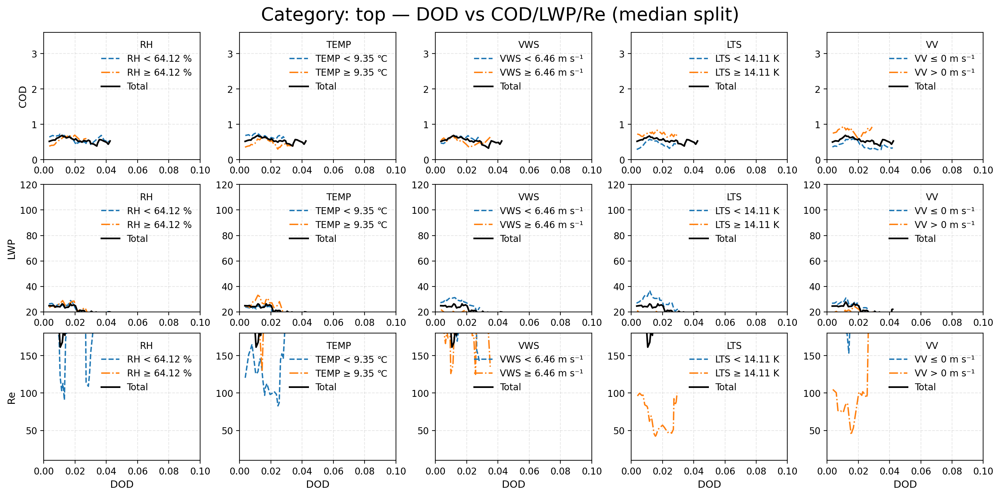

In [47]:
fig, axes = plot_category_panel(category_name='top', results=results)
plt.show()


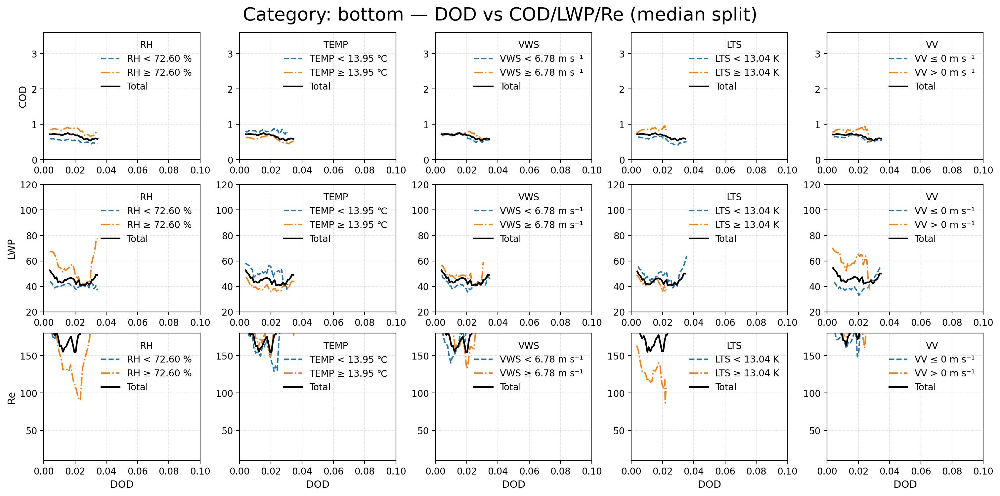

In [48]:
fig, axes = plot_category_panel(category_name='bottom', results=results)
plt.show()

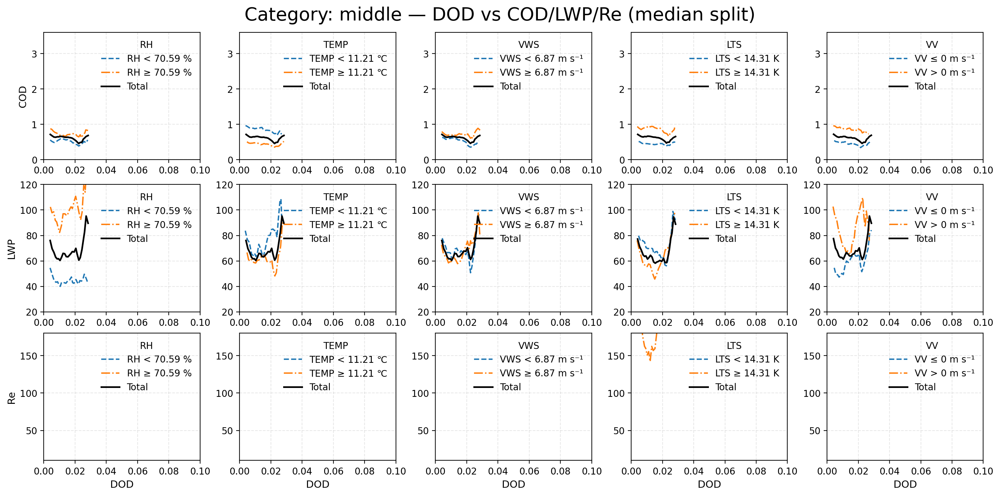

In [49]:
fig, axes = plot_category_panel(category_name='middle', results=results)
plt.show()

In [ ]:
fig, axes = plot_category_panel(category_name='total', results=results)
plt.show()

In [50]:
import numpy as np
import matplotlib.pyplot as plt

def _equal_frequency_xy(x, y, n_bins=100, q_clip=None, min_count_bin=8):
    x=np.asarray(x,float); y=np.asarray(y,float)
    m=np.isfinite(x)&np.isfinite(y); x,y=x[m],y[m]
    if x.size==0: return {k:np.array([]) for k in ["x_mean","y_mean","y_sem","count","mask_valid"]}
    if q_clip is not None:
        lo,hi=np.nanquantile(x,q_clip); m2=(x>=lo)&(x<=hi); x,y=x[m2],y[m2]
        if x.size==0: return {k:np.array([]) for k in ["x_mean","y_mean","y_sem","count","mask_valid"]}
    order=np.argsort(x); x_sorted,y_sorted=x[order],y[order]; n=x_sorted.size; n_bins=int(min(n_bins,n))
    edges=np.linspace(0,n,n_bins+1,dtype=int)
    x_mean=np.full(n_bins,np.nan); y_mean=np.full(n_bins,np.nan); y_sem=np.full(n_bins,np.nan); count=np.zeros(n_bins,int)
    for i in range(n_bins):
        s,e=edges[i],edges[i+1]
        if e-s<1: continue
        xb,yb=x_sorted[s:e],y_sorted[s:e]
        x_mean[i]=np.nanmean(xb); y_mean[i]=np.nanmean(yb); count[i]=xb.size
        if xb.size>1: y_sem[i]=np.nanstd(yb,ddof=1)/np.sqrt(xb.size)
    mask_valid=count>=int(min_count_bin)
    return {"x_mean":x_mean,"y_mean":y_mean,"y_sem":y_sem,"count":count,"mask_valid":mask_valid}

def build_curves_for_category(category_name,
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=None,
    compute_re_if_missing=True, rho_l_g_cm3=1.0,
    n_bins=100, q_clip=(0.05,0.95), min_count_bin=8
):
    try:
        x_RH=RH_by_cat[category_name]; x_TEMP=TEMP_by_cat[category_name]; x_VWS=VWS_by_cat[category_name]
        x_LTS=LTS_by_cat[category_name]; x_VV=VV_by_cat[category_name]
    except KeyError as e:
        raise KeyError(f"缺少控制量数据：{e}")
    try:
        y_COD=COD_by_cat[category_name]; y_LWP=lwp_by_cat[category_name]
    except KeyError as e:
        raise KeyError(f"缺少目标量数据：{e}")

    if (re_by_cat is not None) and (category_name in re_by_cat):
        y_Re=re_by_cat[category_name]
    elif compute_re_if_missing:
        L=np.asarray(y_LWP,float); C=np.asarray(y_COD,float)
        y_Re=(3.0/(2.0*rho_l_g_cm3))*np.where(C>0, L/C, np.nan)
    else:
        y_Re=None

    controls={"RH":np.asarray(x_RH,float),"TEMP":np.asarray(x_TEMP,float),"VWS":np.asarray(x_VWS,float),
              "LTS":np.asarray(x_LTS,float),"VV":np.asarray(x_VV,float)}
    targets={"COD":np.asarray(y_COD,float),"LWP":np.asarray(y_LWP,float)}
    if y_Re is not None: targets["Re"]=np.asarray(y_Re,float)

    curves={}
    for cname,x in controls.items():
        curves[cname]={}
        for tname,y in targets.items():
            curves[cname][tname]=_equal_frequency_xy(x,y,n_bins=n_bins,q_clip=q_clip,min_count_bin=min_count_bin)
    return curves

In [51]:
import numpy as np

def _concat_from(d, cats):
    arrs=[np.asarray(d[c],float) for c in cats if c in d and c!='total']
    return np.concatenate(arrs) if arrs else np.array([],float)

def add_total_to_all_by_cat(base_cats, RH_by_cat,TEMP_by_cat,VWS_by_cat,LTS_by_cat,VV_by_cat, COD_by_cat,lwp_by_cat, re_by_cat=None):
    base=[c for c in base_cats if c!='total']
    for D in (RH_by_cat,TEMP_by_cat,VWS_by_cat,LTS_by_cat,VV_by_cat,COD_by_cat,lwp_by_cat):
        D['total']=_concat_from(D, base)
    if re_by_cat is not None: re_by_cat['total']=_concat_from(re_by_cat, base)
    return {'RH_by_cat':RH_by_cat,'TEMP_by_cat':TEMP_by_cat,'VWS_by_cat':VWS_by_cat,'LTS_by_cat':LTS_by_cat,'VV_by_cat':VV_by_cat,
            'COD_by_cat':COD_by_cat,'lwp_by_cat':lwp_by_cat,'re_by_cat':re_by_cat}

def build_curves_all_categories(cat_names, RH_by_cat,TEMP_by_cat,VWS_by_cat,LTS_by_cat,VV_by_cat, COD_by_cat,lwp_by_cat, re_by_cat=None,
                               compute_re_if_missing=True, rho_l_g_cm3=1.0, n_bins=100, q_clip=(0.05,0.95), min_count_bin=8):
    add_total_to_all_by_cat(list(cat_names), RH_by_cat,TEMP_by_cat,VWS_by_cat,LTS_by_cat,VV_by_cat, COD_by_cat,lwp_by_cat, re_by_cat)
    cats=[c for c in list(cat_names) if c!='total']+['total']
    curves_by_cat={}
    for cname in cats:
        curves_by_cat[cname]=build_curves_for_category(cname, RH_by_cat,TEMP_by_cat,VWS_by_cat,LTS_by_cat,VV_by_cat,
                                                       COD_by_cat,lwp_by_cat,re_by_cat, compute_re_if_missing,rho_l_g_cm3,
                                                       n_bins,q_clip,min_count_bin)
    return curves_by_cat


In [52]:
import numpy as np
import matplotlib.pyplot as plt

def plot_category_panel(category_name, curves,
    controls_order=("RH","TEMP","VWS","LTS","VV"),
    targets_order=("COD","LWP","Re"),
    figsize=(15,7),
    suptitle=None,
    fixed_ylim={"COD": (0, 4), "LWP": (15, 170), "Re": (0,500)},
    show_sem=False,
    scatter=None
):
    # 更稳：targets 用并集判断
    have=set()
    for c in controls_order:
        if c in curves: have |= set(curves[c].keys())
    targets_available=[t for t in targets_order if t in have]
    n_rows=len(targets_available); n_cols=len(controls_order)

    fig,axes=plt.subplots(n_rows,n_cols,figsize=figsize,dpi=220,constrained_layout=True)
    if n_rows==1: axes=np.array([axes])

    unit_map={"RH":"%","TEMP":"℃","VWS":"m s⁻¹","LTS":"K","VV":"m s⁻¹"}
    y_label_map={"COD":"COD","LWP":"LWP (g m⁻²)","Re":"Re (μm)"}
    xlim_map={"RH":(0,80),"TEMP":(-2,15),"VWS":(0,10),"LTS":(10,20),"VV":(-0.2,0.8)}

    for ci,cname in enumerate(controls_order):
        if cname not in curves:
            for ri in range(n_rows): axes[ri,ci].set_visible(False)
            continue
        for ri,tname in enumerate(targets_available):
            ax=axes[ri,ci]
            res=curves[cname].get(tname,None)
            if res is None: ax.set_visible(False); continue
            x,y,m=res["x_mean"],res["y_mean"],res["mask_valid"]
            ax.plot(x[m],y[m],lw=1.8)

            if show_sem and np.any(m) and np.isfinite(res["y_sem"][m]).any():
                ax.fill_between(x[m], y[m]-res["y_sem"][m], y[m]+res["y_sem"][m], alpha=0.18, linewidth=0)

            ax.grid(ls="--", alpha=0.3)
            ax.set_ylabel(y_label_map.get(tname,tname) if ci==0 else "")
            ax.set_xlabel(f"{cname} ({unit_map.get(cname,'')})" if ri==n_rows-1 else "")
            if fixed_ylim.get(tname) is not None: ax.set_ylim(*fixed_ylim[tname])
            if cname in xlim_map: ax.set_xlim(*xlim_map[cname])

    if suptitle is None: suptitle=f"Category: {category_name} — COD/LWP/Re vs Meteorological variables"
    fig.suptitle(suptitle, fontsize=15)
    return fig, axes


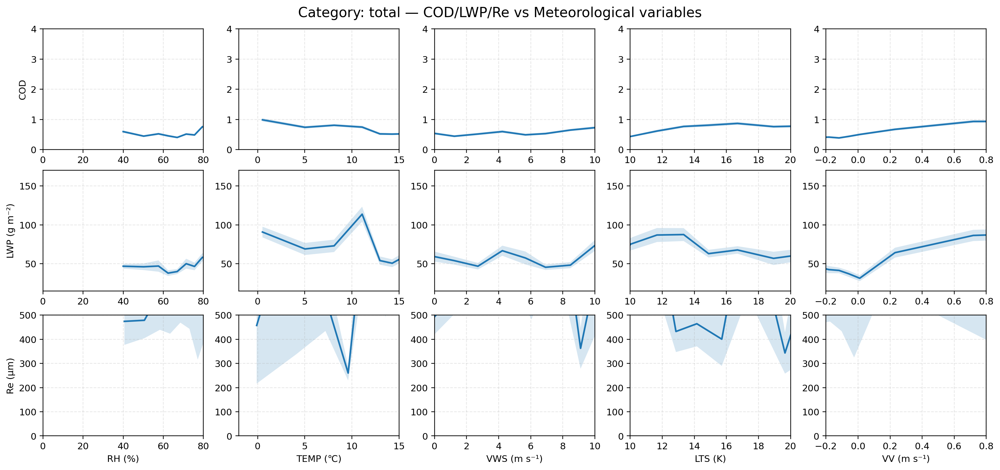

In [53]:
curves_top = build_curves_for_category(
    "total",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("total", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

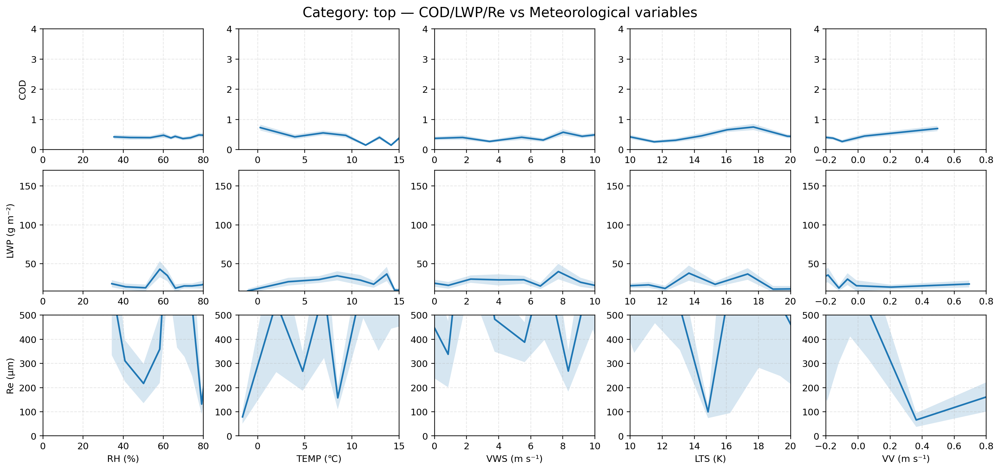

In [54]:
curves_top = build_curves_for_category(
    "top",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("top", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

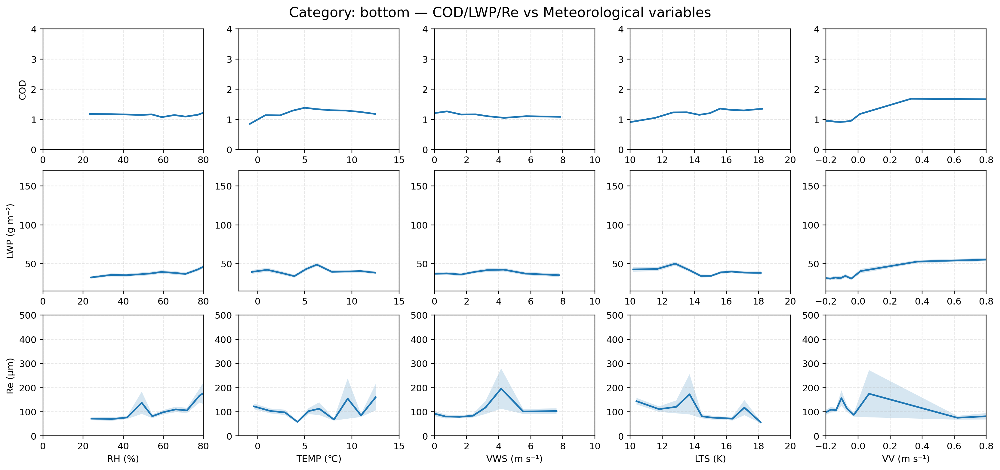

In [55]:
curves_top = build_curves_for_category(
    "bottom",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("bottom", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

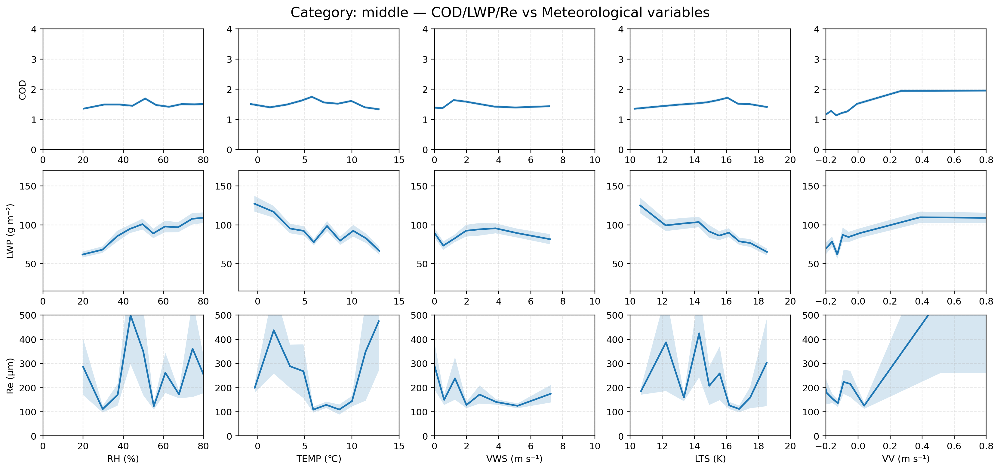

In [56]:
curves_top = build_curves_for_category(
    "middle",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("middle", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

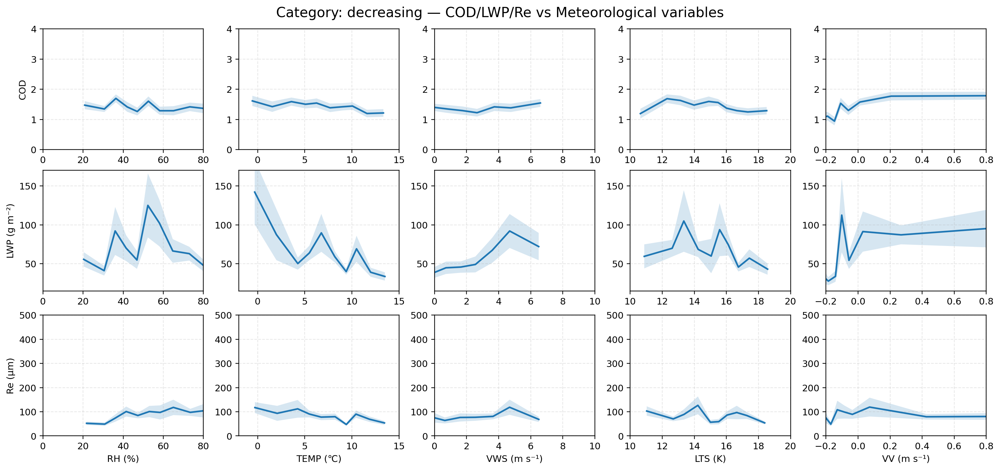

In [67]:
curves_top = build_curves_for_category(
    "decreasing",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("decreasing", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

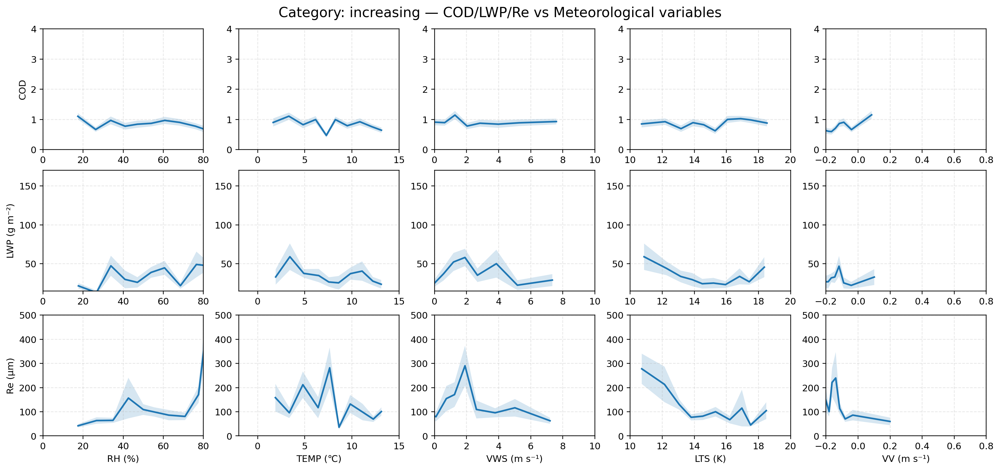

In [68]:
curves_top = build_curves_for_category(
    "increasing",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("increasing", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

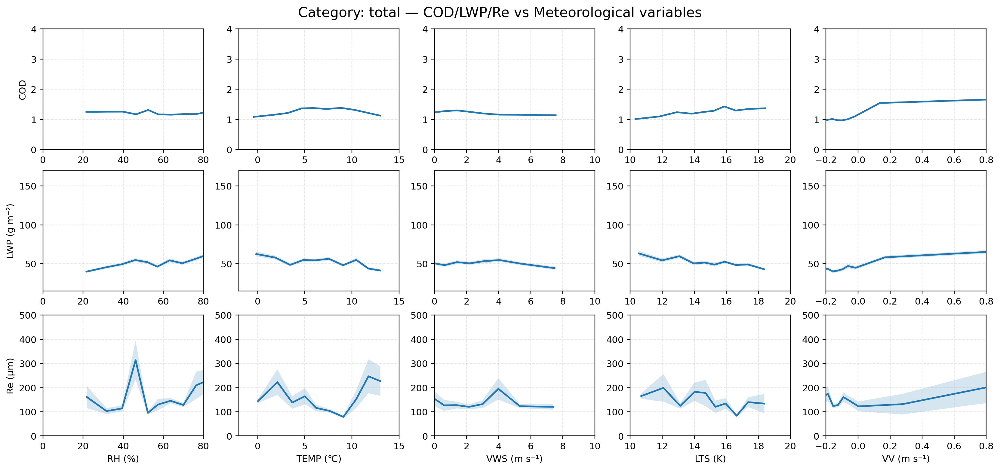

In [57]:
curves_top = build_curves_for_category(
    "total",
    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
    COD_by_cat, lwp_by_cat, re_by_cat=re_by_cat,
    compute_re_if_missing=True,
    n_bins=10, q_clip=(0.05,0.95), min_count_bin=8
)
fig, axes = plot_category_panel("total", curves_top,
                                controls_order=("RH","TEMP","VWS","LTS","VV"),
                                targets_order=("COD","LWP","Re"),
                                show_sem=True)
plt.show()

## Sensitive analysis for different Meterological condition

## Sensitive test but use total to calculate medium

TOTAL_MEDIAN: {'RH': 68.86789321899414, 'TEMP': 13.323863983154297, 'VWS': 6.766374826431274, 'LTS': 12.972572326660156, 'VV': 0.0, 'RH_34': 40.661882400512695, 'TEMP_34': 4.9700233936309814, 'Wind_surf': 4.9002392292022705, 'TEMP_surf': 21.704882621765137, 'VV_4': 0.0, 'lts_1': 5.9076690673828125, 'lts_2': 8.906234741210938}
keys in results_direct: ['top', 'bottom', 'middle', 'total']


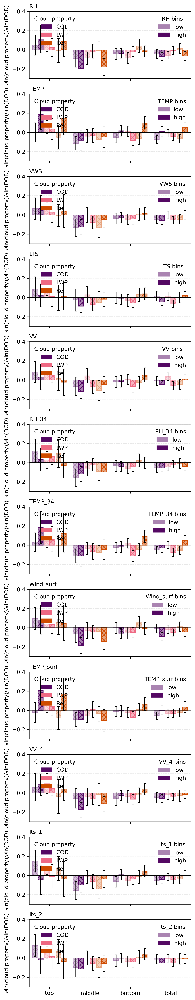

In [41]:
# =========================================================
#  Direct regression (NO moving window):
#  1) Split control variable into low/high by TOTAL median (or 0 for VV/VV_4)
#  2) Within each (category, control_var, low/high), directly regress:
#        ln(Y) = a + b ln(DOD)
#     for Y in {COD, LWP, Re}
#  3) Plot 1-column multi-panel bar charts (same style as your old plot)
# =========================================================

# ================== imports ==================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
from collections import defaultdict
from typing import Mapping, Sequence, Optional

# ---- optional scipy (for t-based CI) ----
try:
    from scipy.stats import linregress, t
    _HAVE_SCIPY = True
except Exception:
    _HAVE_SCIPY = False

plt.rcParams["path.snap"] = False

# ================== params ==================
min_n_reg = 8            # minimum sample size for regression
use_qclip = False        # if True: apply 5–95% clip on (DOD,Y) before regression
q_clip = (0.05, 0.95)    # clip quantiles if use_qclip=True

TOTAL_MEDIAN = {}        # ctrl_name -> median from total (filled later)


# ================== utils: regression + CI ==================
def _linregress_with_ci(x, y):
    """
    Regress y ~ a + b*x; return slope b and 95% CI.
    Here x,y are already arrays (e.g., log(DOD), log(Y)).
    """
    x = np.asarray(x, float).ravel()
    y = np.asarray(y, float).ravel()
    n = x.size
    if n < 3:
        return np.nan, np.nan, np.nan, n, (np.nan, np.nan)

    if _HAVE_SCIPY:
        lr = linregress(x, y)
        slope, intercept, stderr = lr.slope, lr.intercept, lr.stderr
        tcrit = t.ppf(0.975, df=n - 2) if n > 2 else np.nan
        ci = (slope - tcrit * stderr, slope + tcrit * stderr)
        return slope, intercept, stderr, n, ci

    # fallback: manual OLS + normal approx CI
    xm, ym = x.mean(), y.mean()
    Sxx = np.sum((x - xm) ** 2)
    Sxy = np.sum((x - xm) * (y - ym))
    slope = Sxy / Sxx if Sxx != 0 else np.nan
    intercept = ym - slope * xm
    dof = n - 2
    if dof <= 0 or not np.isfinite(slope) or Sxx <= 0:
        return slope, intercept, np.nan, n, (np.nan, np.nan)
    yhat = intercept + slope * x
    resid = y - yhat
    s2 = np.sum(resid ** 2) / dof
    stderr = np.sqrt(s2 / Sxx)
    z = 1.96
    ci = (slope - z * stderr, slope + z * stderr)
    return slope, intercept, stderr, n, ci


def _qclip_xy(x, y, q_clip=(0.05, 0.95)):
    """Optional robust clipping on x and y (both clipped)."""
    x = np.asarray(x, float)
    y = np.asarray(y, float)
    good = np.isfinite(x) & np.isfinite(y)
    x, y = x[good], y[good]
    if x.size == 0:
        return x, y
    lo_x, hi_x = np.quantile(x, q_clip)
    lo_y, hi_y = np.quantile(y, q_clip)
    keep = (x >= lo_x) & (x <= hi_x) & (y >= lo_y) & (y <= hi_y)
    return x[keep], y[keep]


# ================== split control var into low/high ==================
def split_by_quantile(var, mask=None, name=None):
    """
    Split into low/high using:
      - VV/VV_4: threshold=0
      - others: threshold = TOTAL_MEDIAN[name] (computed from total)
    Returns:
      lab: array with 0(low), 1(high), nan(invalid)
      edge: [threshold]
    """
    v = np.asarray(var, float)
    m = np.isfinite(v) if mask is None else (np.isfinite(v) & mask)
    lab = np.full(v.shape, np.nan)
    if m.sum() == 0:
        return lab, [np.nan]

    if name in ("VV", "VV_4"):
        lab[m & (v <= 0)] = 0
        lab[m & (v > 0)] = 1
        return lab, [0.0]

    med = TOTAL_MEDIAN.get(name, np.nan)
    if not np.isfinite(med):
        med = np.nanmedian(v[m])  # fallback

    lab[m & (v < med)] = 0
    lab[m & (v >= med)] = 1
    return lab, [float(med)]


# ================== concat helper for total ==================
def _concat_from(d, cats):
    arrs = [np.asarray(d[c], float) for c in cats if (c in d)]
    return np.concatenate(arrs) if len(arrs) else np.array([], float)


# ================== MAIN: direct regressions builder ==================
def prepare_direct_regressions_per_category(
    cat_names,
    DOD_by_cat, COD_by_cat, lwp_by_cat, re_by_cat,
    control_vars_by_cat_dict,
    min_n_reg=8,
    use_qclip=False,
    q_clip=(0.05, 0.95),
):
    """
    Direct event-level regression (no moving window):
      ln(Y) ~ a + b ln(DOD)
    outputs:
      results[cat][ctrl][target]['low'/'high'/'_total'] = dict(slope, intercept, stderr, ci_low, ci_high, n)
      results[cat][ctrl]['_edges'] = [threshold]
    """
    qnames = {0: "low", 1: "high"}
    results = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

    for cat in cat_names:
        dod = np.asarray(DOD_by_cat[cat], float)
        cod = np.asarray(COD_by_cat[cat], float)
        lwp = np.asarray(lwp_by_cat[cat], float)
        re  = np.asarray(re_by_cat[cat],  float)

        for ctrl_name, ctrl_dict in control_vars_by_cat_dict.items():
            ctrl = np.asarray(ctrl_dict[cat], float)

            ok = np.isfinite(dod) & np.isfinite(ctrl) & np.isfinite(cod) & np.isfinite(lwp) & np.isfinite(re)
            if np.count_nonzero(ok) < min_n_reg:
                continue

            dod_u  = dod[ok]
            cod_u  = cod[ok]
            lwp_u  = lwp[ok]
            re_u   = re[ok]
            ctrl_u = ctrl[ok]

            lbls, edge = split_by_quantile(ctrl_u, name=ctrl_name)
            results[cat][ctrl_name]["_edges"] = edge

            # ---- low/high ----
            for t_lbl in (0, 1):
                tname = qnames[t_lbl]
                m = (lbls == t_lbl)

                for target, arr in (("COD", cod_u), ("LWP", lwp_u), ("Re", re_u)):
                    m2 = m & np.isfinite(arr) & (dod_u > 0) & (arr > 0)
                    n = int(np.count_nonzero(m2))
                    if n < min_n_reg:
                        results[cat][ctrl_name][target][tname] = dict(
                            slope=np.nan, intercept=np.nan, stderr=np.nan,
                            ci_low=np.nan, ci_high=np.nan, n=n
                        )
                        continue

                    x = dod_u[m2]
                    y = arr[m2]
                    if use_qclip:
                        x, y = _qclip_xy(x, y, q_clip=q_clip)
                    if x.size < min_n_reg:
                        results[cat][ctrl_name][target][tname] = dict(
                            slope=np.nan, intercept=np.nan, stderr=np.nan,
                            ci_low=np.nan, ci_high=np.nan, n=int(x.size)
                        )
                        continue

                    lx, ly = np.log(x), np.log(y)
                    slope, intercept, stderr, n2, (ci_low, ci_high) = _linregress_with_ci(lx, ly)
                    results[cat][ctrl_name][target][tname] = dict(
                        slope=slope, intercept=intercept, stderr=stderr,
                        ci_low=ci_low, ci_high=ci_high, n=n2
                    )

            # ---- total (no split) ----
            for target, arr in (("COD", cod_u), ("LWP", lwp_u), ("Re", re_u)):
                m2 = np.isfinite(arr) & (dod_u > 0) & (arr > 0)
                n = int(np.count_nonzero(m2))
                if n < min_n_reg:
                    results[cat][ctrl_name][target]["_total"] = dict(
                        slope=np.nan, intercept=np.nan, stderr=np.nan,
                        ci_low=np.nan, ci_high=np.nan, n=n
                    )
                    continue

                x = dod_u[m2]
                y = arr[m2]
                if use_qclip:
                    x, y = _qclip_xy(x, y, q_clip=q_clip)
                if x.size < min_n_reg:
                    results[cat][ctrl_name][target]["_total"] = dict(
                        slope=np.nan, intercept=np.nan, stderr=np.nan,
                        ci_low=np.nan, ci_high=np.nan, n=int(x.size)
                    )
                    continue

                lx, ly = np.log(x), np.log(y)
                slope, intercept, stderr, n2, (ci_low, ci_high) = _linregress_with_ci(lx, ly)
                results[cat][ctrl_name][target]["_total"] = dict(
                    slope=slope, intercept=intercept, stderr=stderr,
                    ci_low=ci_low, ci_high=ci_high, n=n2
                )

    return results


# ================== convert results -> sens_df for plotting ==================
def compute_log_sensitivities_direct(results_direct, control_var, cat_order, targets=("COD", "LWP", "Re")):
    rows = []
    for cat in cat_order:
        if cat not in results_direct:
            continue
        if control_var not in results_direct[cat]:
            continue

        for tgt in targets:
            dd = results_direct[cat][control_var].get(tgt, {})
            for terc in ("low", "high"):
                r = dd.get(terc, None)
                if r is None:
                    continue
                rows.append(dict(
                    category=cat, target=tgt, tercile=terc,
                    slope=r["slope"], stderr=r["stderr"],
                    ci_low=r["ci_low"], ci_high=r["ci_high"],
                    n=r["n"]
                ))
    return pd.DataFrame(rows)


# ================== plotting (reuse your bar style) ==================
def _lighten(c, a=0.5):
    rgb = np.array(mcolors.to_rgb(c))
    return tuple(rgb + (1 - rgb) * a)

def plot_log_sensitivity_onepanel(
    sens_df, control_var, cat_order=None,
    targets=("COD", "LWP", "Re"), bins=("low", "high"),
    ax=None, group_gap=0.75, width=0.09, inner_gap=0.09, block_gap=0.2,
    ylim=(-0.4, 0.6)
):
    base_cols = ["#540863", "#EE6983", "#CF4B00"]
    desired = ["top", "middle", "bottom", "total"]

    if cat_order is None:
        cat_order = [c for c in desired if c in sens_df.category.unique()]
    else:
        cat_order = [c for c in desired if c in cat_order]

    x = np.arange(len(cat_order)) * group_gap
    block_centers = np.array([-block_gap, 0, block_gap])

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 2), dpi=300)
    else:
        fig = ax.figure

    # === bars ===
    leg_targets = []
    for ti, tgt in enumerate(targets):
        sub = sens_df[sens_df.target == tgt]
        base = base_cols[ti]
        col_hi = base
        col_lo = _lighten(base, 0.5)

        for bn in bins:
            off = block_centers[ti] + (-inner_gap / 2 if bn == "low" else inner_gap / 2)
            fc = (col_lo if bn == "low" else col_hi)

            yy, ee = [], []
            for cat in cat_order:
                r = sub[(sub.category == cat) & (sub.tercile == bn)]
                if len(r) == 1:
                    v = float(r.slope.values[0])
                    # if you want ACI_Re style (negative sign), keep this:
                    v = -v if tgt == "Re" else v

                    # you previously used 1.96*stderr
                    se = float(r.stderr.values[0]) if np.isfinite(r.stderr.values[0]) else np.nan
                    yy.append(v)
                    ee.append(1.96 * se if np.isfinite(se) else np.nan)
                else:
                    yy.append(np.nan)
                    ee.append(np.nan)

            ax.bar(x + off, yy, width=width,
                   facecolor=_lighten(fc, 0.5), edgecolor=fc,
                   hatch="xxx", zorder=2)
            ax.errorbar(x + off, yy, yerr=ee, fmt="none",
                        ecolor="k", lw=1, capsize=2, zorder=3)

        leg_targets.append(Patch(facecolor=col_hi, edgecolor=col_hi, label=tgt))

    # === axis & legend ===
    edges = np.r_[x[0] - group_gap / 2, (x[:-1] + x[1:]) / 2, x[-1] + group_gap / 2]
    ax.axhline(0, color="k", lw=0.8)
    ax.set_xticks(x)
    ax.set_xticklabels(cat_order)
    ax.set_xlim(edges[0], edges[-1])
    ax.set_ylim(*ylim)
    ax.grid(axis="y", ls="--", alpha=0.3)
    ax.set_ylabel(r"$\partial\ln(\mathrm{cloud\ property})/\partial\ln(\mathrm{DOD})$")

    l1 = ax.legend(handles=leg_targets, title="Cloud property",
                   frameon=False, loc="upper left")
    ax.add_artist(l1)

    ax.legend(handles=[
        Patch(facecolor=_lighten(base_cols[0], 0.5), edgecolor=_lighten(base_cols[0], 0.5), hatch="x", label="low"),
        Patch(facecolor=base_cols[0], edgecolor=base_cols[0], hatch="xx", label="high")
    ], title=f"{control_var} bins", frameon=False, loc="upper right")

    return fig, ax


# =========================================================
#  YOU MUST HAVE THESE VARIABLES ALREADY IN MEMORY:
#    cat_names
#    DOD_by_cat, COD_by_cat, lwp_by_cat, re_by_cat
#    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
#    RH_34_by_cat, TEMP_34_by_cat, Wind_surf_by_cat, TEMP_surf_by_cat,
#    VV_4_by_cat, lts_1_by_cat, lts_2_by_cat
# =========================================================

# ================== Build "total" for main vars ==================
base_cats = list(cat_names)

DOD_by_cat["total"] = _concat_from(DOD_by_cat, base_cats)
COD_by_cat["total"] = _concat_from(COD_by_cat, base_cats)
lwp_by_cat["total"] = _concat_from(lwp_by_cat, base_cats)
re_by_cat["total"]  = _concat_from(re_by_cat,  base_cats)

# ================== Build "total" for control vars ==================
for _ctl_name, _ctl_dict in [
    ("RH", RH_by_cat), ("TEMP", TEMP_by_cat), ("VWS", VWS_by_cat), ("LTS", LTS_by_cat), ("VV", VV_by_cat),
    ("RH_34", RH_34_by_cat), ("TEMP_34", TEMP_34_by_cat), ("Wind_surf", Wind_surf_by_cat),
    ("TEMP_surf", TEMP_surf_by_cat), ("VV_4", VV_4_by_cat), ("lts_1", lts_1_by_cat), ("lts_2", lts_2_by_cat),
]:
    _ctl_dict["total"] = _concat_from(_ctl_dict, base_cats)

cat_names_with_total = list(base_cats) + ["total"]

control_vars_by_cat_dict = {
    "RH": RH_by_cat, "TEMP": TEMP_by_cat, "VWS": VWS_by_cat, "LTS": LTS_by_cat, "VV": VV_by_cat,
    "RH_34": RH_34_by_cat, "TEMP_34": TEMP_34_by_cat, "Wind_surf": Wind_surf_by_cat,
    "TEMP_surf": TEMP_surf_by_cat, "VV_4": VV_4_by_cat, "lts_1": lts_1_by_cat, "lts_2": lts_2_by_cat,
}

# ================== Build TOTAL_MEDIAN from total ==================
TOTAL_MEDIAN = {}
for ctrl_name, ctrl_dict in control_vars_by_cat_dict.items():
    if ctrl_name in ("VV", "VV_4"):
        TOTAL_MEDIAN[ctrl_name] = 0.0
        continue
    v = np.asarray(ctrl_dict.get("total", []), float)
    v = v[np.isfinite(v)]
    TOTAL_MEDIAN[ctrl_name] = float(np.nanmedian(v)) if v.size else np.nan

print("TOTAL_MEDIAN:", TOTAL_MEDIAN)

# ================== Run direct regressions ==================
results_direct = prepare_direct_regressions_per_category(
    cat_names=cat_names_with_total,
    DOD_by_cat=DOD_by_cat,
    COD_by_cat=COD_by_cat,
    lwp_by_cat=lwp_by_cat,
    re_by_cat=re_by_cat,
    control_vars_by_cat_dict=control_vars_by_cat_dict,
    min_n_reg=min_n_reg,
    use_qclip=use_qclip,
    q_clip=q_clip,
)

print("keys in results_direct:", list(results_direct.keys()))

# ================== Plot panels ==================
vars_to_plot = ["RH", "TEMP", "VWS", "LTS", "VV", "RH_34", "TEMP_34",
                "Wind_surf", "TEMP_surf", "VV_4", "lts_1", "lts_2"]

n = len(vars_to_plot)
fig, axes = plt.subplots(n, 1, figsize=(5, 2.1 * n), dpi=300, sharex=False)
axes = np.atleast_1d(axes)

for i, v in enumerate(vars_to_plot):
    sens = compute_log_sensitivities_direct(
        results_direct, control_var=v, cat_order=cat_names_with_total
    )
    plot_log_sensitivity_onepanel(
        sens_df=sens,
        control_var=v,
        bins=("low", "high"),
        ax=axes[i],
        group_gap=0.7,
        ylim=(-0.3, 0.4),
    )
    axes[i].set_title(v, fontsize=10, loc="left")

for ax in axes[:-1]:
    ax.set_xticklabels([])

fig.tight_layout()
fig.savefig("figsave/mete_SGP_sensitivity_panels_directreg.pdf", dpi=300, bbox_inches="tight")
plt.show()


TOTAL_MEDIAN: {'RH': 68.86789321899414, 'TEMP': 13.323863983154297, 'VWS': 6.766374826431274, 'LTS': 12.972572326660156, 'VV': 0.0, 'RH_34': 40.661882400512695, 'TEMP_34': 4.9700233936309814, 'Wind_surf': 4.9002392292022705, 'TEMP_surf': 21.704882621765137, 'VV_4': 0.0, 'lts_1': 5.9076690673828125, 'lts_2': 8.906234741210938}


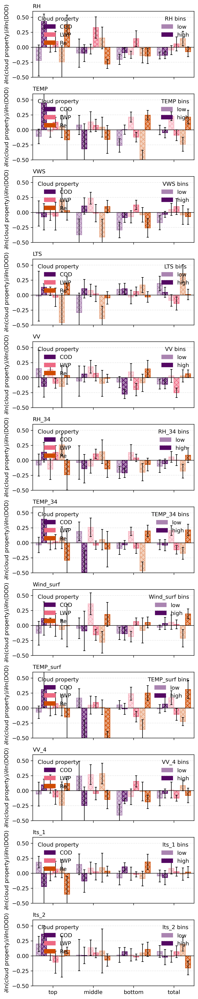

In [71]:
# =========================================================
#  Moving-window median regression (with CI) for low/high controls
#  Fix: errorbar yerr must be non-negative (Re sign flip must flip CI too)
# =========================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
from collections import defaultdict

try:
    from scipy.stats import linregress, t
    _HAVE_SCIPY = True
except Exception:
    _HAVE_SCIPY = False

plt.rcParams["path.snap"] = False

# ========= 参数（可调） =========
window_width = 0.010
step          = 0.001
min_count_win = 8
q_clip        = (0.05, 0.95)

min_n_reg = 8            # minimum samples to attempt (after split)
use_qclip = True         # apply q_clip inside each window
TOTAL_MEDIAN = {}        # ctrl_name -> median from total (filled later)

# ================== utils: regression + CI ==================
def _linregress_with_ci(x, y):
    x = np.asarray(x, float).ravel()
    y = np.asarray(y, float).ravel()
    n = x.size
    if n < 3:
        return np.nan, np.nan, np.nan, n, (np.nan, np.nan)

    if _HAVE_SCIPY:
        lr = linregress(x, y)
        slope, intercept, stderr = lr.slope, lr.intercept, lr.stderr
        tcrit = t.ppf(0.975, df=n - 2) if n > 2 else np.nan
        return slope, intercept, stderr, n, (slope - tcrit * stderr, slope + tcrit * stderr)

    xm, ym = x.mean(), y.mean()
    Sxx = np.sum((x - xm) ** 2)
    Sxy = np.sum((x - xm) * (y - ym))
    slope = Sxy / Sxx if Sxx != 0 else np.nan
    intercept = ym - slope * xm
    dof = n - 2
    if dof <= 0 or not np.isfinite(slope) or Sxx <= 0:
        return slope, intercept, np.nan, n, (np.nan, np.nan)
    yhat = intercept + slope * x
    resid = y - yhat
    s2 = np.sum(resid ** 2) / dof
    stderr = np.sqrt(s2 / Sxx)
    z = 1.96
    return slope, intercept, stderr, n, (slope - z * stderr, slope + z * stderr)

def _qclip_xy(x, y, q_clip=(0.05, 0.95)):
    x = np.asarray(x, float); y = np.asarray(y, float)
    good = np.isfinite(x) & np.isfinite(y)
    x, y = x[good], y[good]
    if x.size == 0: return x, y
    lo_x, hi_x = np.quantile(x, q_clip)
    lo_y, hi_y = np.quantile(y, q_clip)
    keep = (x >= lo_x) & (x <= hi_x) & (y >= lo_y) & (y <= hi_y)
    return x[keep], y[keep]

# ================== split control var into low/high ==================
def split_by_quantile(var, mask=None, name=None):
    v = np.asarray(var, float)
    m = np.isfinite(v) if mask is None else (np.isfinite(v) & mask)
    lab = np.full(v.shape, np.nan)
    if m.sum() == 0: return lab, [np.nan]

    if name in ("VV", "VV_4"):
        lab[m & (v <= 0)] = 0
        lab[m & (v > 0)] = 1
        return lab, [0.0]

    med = TOTAL_MEDIAN.get(name, np.nan)
    if not np.isfinite(med): med = np.nanmedian(v[m])
    lab[m & (v < med)] = 0
    lab[m & (v >= med)] = 1
    return lab, [float(med)]

# ================== concat helper for total ==================
def _concat_from(d, cats):
    arrs = [np.asarray(d[c], float) for c in cats if (c in d)]
    return np.concatenate(arrs) if len(arrs) else np.array([], float)

# ================== moving-window median regression core ==================
def _mw_median_regress_lnln(x_raw, y_raw, window_width, step, min_count_win, q_clip=(0.05,0.95)):
    x_raw = np.asarray(x_raw, float); y_raw = np.asarray(y_raw, float)
    m = np.isfinite(x_raw)&np.isfinite(y_raw)&(x_raw>0)&(y_raw>0)
    x_raw, y_raw = x_raw[m], y_raw[m]
    if x_raw.size < min_count_win:
        return np.nan, np.nan, np.nan, 0, (np.nan, np.nan)

    idx = np.argsort(x_raw); x_raw, y_raw = x_raw[idx], y_raw[idx]
    xmin, xmax = x_raw.min(), x_raw.max()
    if xmax - xmin < window_width:
        return _linregress_with_ci(np.log(x_raw), np.log(y_raw))

    xs, ys = [], []
    c = xmin + window_width/2
    while c <= xmax - window_width/2 + 1e-12:
        lo, hi = c-window_width/2, c+window_width/2
        w = (x_raw>=lo)&(x_raw<hi)
        if w.sum() >= min_count_win:
            lx, ly = np.log(x_raw[w]), np.log(y_raw[w])
            if q_clip is not None:
                lx, ly = _qclip_xy(lx, ly, q_clip=q_clip)
            if lx.size >= min_count_win:
                xs.append(np.nanmedian(lx)); ys.append(np.nanmedian(ly))
        c += step

    xs = np.asarray(xs, float); ys = np.asarray(ys, float)
    if xs.size < 3:
        return _linregress_with_ci(np.log(x_raw), np.log(y_raw))
    return _linregress_with_ci(xs, ys)

# ================== MAIN: moving-window regressions builder ==================
def prepare_mw_regressions_per_category(
    cat_names,
    DOD_by_cat, COD_by_cat, lwp_by_cat, re_by_cat,
    control_vars_by_cat_dict,
    min_n_reg=8,
    use_qclip=True,
    q_clip=(0.05, 0.95),
    window_width=0.010,
    step=0.001,
    min_count_win=8,
):
    qnames = {0: "low", 1: "high"}
    results = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

    for cat in cat_names:
        dod = np.asarray(DOD_by_cat[cat], float)
        cod = np.asarray(COD_by_cat[cat], float)
        lwp = np.asarray(lwp_by_cat[cat], float)
        re  = np.asarray(re_by_cat[cat],  float)

        for ctrl_name, ctrl_dict in control_vars_by_cat_dict.items():
            ctrl = np.asarray(ctrl_dict[cat], float)

            ok = np.isfinite(dod)&np.isfinite(ctrl)&np.isfinite(cod)&np.isfinite(lwp)&np.isfinite(re)
            if np.count_nonzero(ok) < min_n_reg:
                continue

            dod_u, cod_u, lwp_u, re_u, ctrl_u = dod[ok], cod[ok], lwp[ok], re[ok], ctrl[ok]
            lbls, edge = split_by_quantile(ctrl_u, name=ctrl_name)
            results[cat][ctrl_name]["_edges"] = edge

            for t_lbl in (0, 1):
                tname = qnames[t_lbl]
                m = (lbls == t_lbl)

                for target, arr in (("COD", cod_u), ("LWP", lwp_u), ("Re", re_u)):
                    m2 = m & np.isfinite(arr) & (dod_u > 0) & (arr > 0)
                    n_raw = int(np.count_nonzero(m2))
                    if n_raw < min_n_reg:
                        results[cat][ctrl_name][target][tname] = dict(
                            slope=np.nan, intercept=np.nan, stderr=np.nan,
                            ci_low=np.nan, ci_high=np.nan, n=n_raw
                        )
                        continue

                    x = dod_u[m2]; y = arr[m2]
                    slope, intercept, stderr, n_win, (ci_low, ci_high) = _mw_median_regress_lnln(
                        x, y,
                        window_width=window_width, step=step,
                        min_count_win=min_count_win,
                        q_clip=(q_clip if use_qclip else None),
                    )
                    results[cat][ctrl_name][target][tname] = dict(
                        slope=slope, intercept=intercept, stderr=stderr,
                        ci_low=ci_low, ci_high=ci_high, n=n_win
                    )

            for target, arr in (("COD", cod_u), ("LWP", lwp_u), ("Re", re_u)):
                m2 = np.isfinite(arr) & (dod_u > 0) & (arr > 0)
                n_raw = int(np.count_nonzero(m2))
                if n_raw < min_n_reg:
                    results[cat][ctrl_name][target]["_total"] = dict(
                        slope=np.nan, intercept=np.nan, stderr=np.nan,
                        ci_low=np.nan, ci_high=np.nan, n=n_raw
                    )
                    continue

                x = dod_u[m2]; y = arr[m2]
                slope, intercept, stderr, n_win, (ci_low, ci_high) = _mw_median_regress_lnln(
                    x, y,
                    window_width=window_width, step=step,
                    min_count_win=min_count_win,
                    q_clip=(q_clip if use_qclip else None),
                )
                results[cat][ctrl_name][target]["_total"] = dict(
                    slope=slope, intercept=intercept, stderr=stderr,
                    ci_low=ci_low, ci_high=ci_high, n=n_win
                )

    return results

# ================== convert results -> sens_df for plotting ==================
def compute_log_sensitivities_lowhigh(results_any, control_var, cat_order, targets=("COD", "LWP", "Re")):
    rows = []
    for cat in cat_order:
        if cat not in results_any: continue
        if control_var not in results_any[cat]: continue
        for tgt in targets:
            dd = results_any[cat][control_var].get(tgt, {})
            for bn in ("low", "high"):
                r = dd.get(bn, None)
                if r is None: continue
                rows.append(dict(category=cat, target=tgt, tercile=bn,
                                 slope=r["slope"], stderr=r["stderr"],
                                 ci_low=r["ci_low"], ci_high=r["ci_high"], n=r["n"]))
    return pd.DataFrame(rows)

# ================== plotting (fixed yerr + consistent Re sign) ==================
def _lighten(c, a=0.5):
    rgb = np.array(mcolors.to_rgb(c))
    return tuple(rgb + (1 - rgb) * a)

def plot_log_sensitivity_onepanel(
    sens_df, control_var, cat_order=None,
    targets=("COD", "LWP", "Re"), bins=("low", "high"),
    ax=None, group_gap=0.75, width=0.09, inner_gap=0.09, block_gap=0.2,
    ylim=(-0.4, 0.6)
):
    base_cols = ["#540863", "#EE6983", "#CF4B00"]
    desired = ["top", "middle", "bottom", "total"]

    if cat_order is None:
        cat_order = [c for c in desired if c in sens_df.category.unique()]
    else:
        cat_order = [c for c in desired if c in cat_order]

    x = np.arange(len(cat_order)) * group_gap
    block_centers = np.array([-block_gap, 0, block_gap])

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 2), dpi=300)
    else:
        fig = ax.figure

    leg_targets = []
    for ti, tgt in enumerate(targets):
        sub = sens_df[sens_df.target == tgt]
        base = base_cols[ti]
        col_hi = base
        col_lo = _lighten(base, 0.5)

        for bn in bins:
            off = block_centers[ti] + (-inner_gap / 2 if bn == "low" else inner_gap / 2)
            fc = (col_lo if bn == "low" else col_hi)

            yy, yerr = [], []
            for cat in cat_order:
                r = sub[(sub.category == cat) & (sub.tercile == bn)]
                if len(r) == 1:
                    v  = float(r.slope.values[0])
                    cl = float(r.ci_low.values[0])
                    ch = float(r.ci_high.values[0])

                    # --- Re: flip value AND CI (keep cl<=ch) ---
                    if tgt == "Re":
                        v, cl, ch = -v, -ch, -cl

                    yy.append(v)

                    if np.isfinite(v) and np.isfinite(cl) and np.isfinite(ch):
                        el = max(0.0, v - cl)
                        eh = max(0.0, ch - v)
                        yerr.append([el, eh])
                    else:
                        yerr.append([np.nan, np.nan])
                else:
                    yy.append(np.nan)
                    yerr.append([np.nan, np.nan])

            yerr = np.array(yerr, float).T  # (2, ncat)
            ax.bar(x + off, yy, width=width,
                   facecolor=_lighten(fc, 0.5), edgecolor=fc,
                   hatch="xxx", zorder=2)
            ax.errorbar(x + off, yy, yerr=yerr, fmt="none",
                        ecolor="k", lw=1, capsize=2, zorder=3)

        leg_targets.append(Patch(facecolor=col_hi, edgecolor=col_hi, label=tgt))

    edges = np.r_[x[0] - group_gap / 2, (x[:-1] + x[1:]) / 2, x[-1] + group_gap / 2]
    ax.axhline(0, color="k", lw=0.8)
    ax.set_xticks(x); ax.set_xticklabels(cat_order)
    ax.set_xlim(edges[0], edges[-1])
    ax.set_ylim(*ylim)
    ax.grid(axis="y", ls="--", alpha=0.3)
    ax.set_ylabel(r"$\partial\ln(\mathrm{cloud\ property})/\partial\ln(\mathrm{DOD})$")

    l1 = ax.legend(handles=leg_targets, title="Cloud property",
                   frameon=False, loc="upper left")
    ax.add_artist(l1)

    ax.legend(handles=[
        Patch(facecolor=_lighten(base_cols[0], 0.5), edgecolor=_lighten(base_cols[0], 0.5), hatch="x", label="low"),
        Patch(facecolor=base_cols[0], edgecolor=base_cols[0], hatch="xx", label="high")
    ], title=f"{control_var} bins", frameon=False, loc="upper right")

    return fig, ax

# =========================================================
#  YOU MUST HAVE THESE VARIABLES ALREADY IN MEMORY:
#    cat_names
#    DOD_by_cat, COD_by_cat, lwp_by_cat, re_by_cat
#    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
#    RH_34_by_cat, TEMP_34_by_cat, Wind_surf_by_cat, TEMP_surf_by_cat,
#    VV_4_by_cat, lts_1_by_cat, lts_2_by_cat
# =========================================================

# ================== Build "total" for main vars ==================
base_cats = list(cat_names)
DOD_by_cat["total"] = _concat_from(DOD_by_cat, base_cats)
COD_by_cat["total"] = _concat_from(COD_by_cat, base_cats)
lwp_by_cat["total"] = _concat_from(lwp_by_cat, base_cats)
re_by_cat["total"]  = _concat_from(re_by_cat,  base_cats)

# ================== Build "total" for control vars ==================
for _ctl_name, _ctl_dict in [
    ("RH", RH_by_cat), ("TEMP", TEMP_by_cat), ("VWS", VWS_by_cat), ("LTS", LTS_by_cat), ("VV", VV_by_cat),
    ("RH_34", RH_34_by_cat), ("TEMP_34", TEMP_34_by_cat), ("Wind_surf", Wind_surf_by_cat),
    ("TEMP_surf", TEMP_surf_by_cat), ("VV_4", VV_4_by_cat), ("lts_1", lts_1_by_cat), ("lts_2", lts_2_by_cat),
]:
    _ctl_dict["total"] = _concat_from(_ctl_dict, base_cats)

cat_names_with_total = list(base_cats) + ["total"]

control_vars_by_cat_dict = {
    "RH": RH_by_cat, "TEMP": TEMP_by_cat, "VWS": VWS_by_cat, "LTS": LTS_by_cat, "VV": VV_by_cat,
    "RH_34": RH_34_by_cat, "TEMP_34": TEMP_34_by_cat, "Wind_surf": Wind_surf_by_cat,
    "TEMP_surf": TEMP_surf_by_cat, "VV_4": VV_4_by_cat, "lts_1": lts_1_by_cat, "lts_2": lts_2_by_cat,
}

# ================== Build TOTAL_MEDIAN from total ==================
TOTAL_MEDIAN = {}
for ctrl_name, ctrl_dict in control_vars_by_cat_dict.items():
    if ctrl_name in ("VV", "VV_4"):
        TOTAL_MEDIAN[ctrl_name] = 0.0
        continue
    v = np.asarray(ctrl_dict.get("total", []), float)
    v = v[np.isfinite(v)]
    TOTAL_MEDIAN[ctrl_name] = float(np.nanmedian(v)) if v.size else np.nan
print("TOTAL_MEDIAN:", TOTAL_MEDIAN)

# ================== Run moving-window regressions ==================
results_mw = prepare_mw_regressions_per_category(
    cat_names=cat_names_with_total,
    DOD_by_cat=DOD_by_cat,
    COD_by_cat=COD_by_cat,
    lwp_by_cat=lwp_by_cat,
    re_by_cat=re_by_cat,
    control_vars_by_cat_dict=control_vars_by_cat_dict,
    min_n_reg=min_n_reg,
    use_qclip=use_qclip,
    q_clip=q_clip,
    window_width=window_width,
    step=step,
    min_count_win=min_count_win,
)

# ================== Plot panels ==================
vars_to_plot = ["RH", "TEMP", "VWS", "LTS", "VV", "RH_34", "TEMP_34",
                "Wind_surf", "TEMP_surf", "VV_4", "lts_1", "lts_2"]

n = len(vars_to_plot)
fig, axes = plt.subplots(n, 1, figsize=(5, 2.1 * n), dpi=300, sharex=False)
axes = np.atleast_1d(axes)

for i, v in enumerate(vars_to_plot):
    sens = compute_log_sensitivities_lowhigh(results_mw, control_var=v, cat_order=cat_names_with_total)
    plot_log_sensitivity_onepanel(
        sens_df=sens,
        control_var=v,
        bins=("low", "high"),
        ax=axes[i],
        group_gap=0.7,
        ylim=(-0.5, 0.6),
    )
    axes[i].set_title(v, fontsize=10, loc="left")

for ax in axes[:-1]:
    ax.set_xticklabels([])

fig.tight_layout()
fig.savefig("figsave/mete_SGP_sensitivity_panels_mwmedian.pdf", dpi=300, bbox_inches="tight")
plt.show()


TOTAL_MEDIAN: {'RH': 68.86789321899414, 'TEMP': 13.323863983154297, 'VWS': 6.766374826431274, 'LTS': 12.972572326660156, 'VV': 0.0, 'RH_34': 40.661882400512695, 'TEMP_34': 4.9700233936309814, 'Wind_surf': 4.9002392292022705, 'TEMP_surf': 21.704882621765137, 'VV_4': 0.0, 'lts_1': 5.9076690673828125, 'lts_2': 8.906234741210938}
keys in results_direct: ['top', 'bottom', 'middle', 'total']


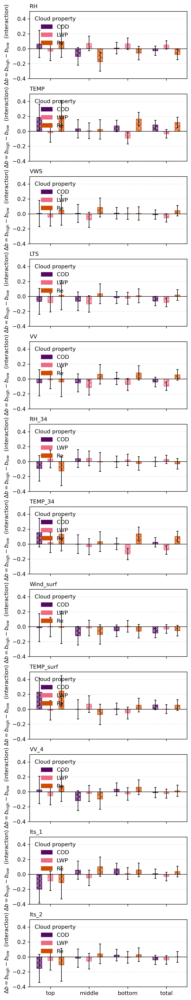

In [46]:
# =========================================================
#  Direct regression (NO moving window) — Interaction model (Scheme A):
#  1) Split control variable into low/high by TOTAL median (or 0 for VV/VV_4)
#  2) Within each (category, control_var), fit:
#        ln(Y) = a + b ln(DOD) + g H + d (H * ln(DOD))
#     where H=0(low), H=1(high)
#     => high - low sensitivity difference = d
#  3) Plot 1-column multi-panel bar charts for targets {COD, LWP, Re}
# =========================================================

# ================== imports ==================
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
from collections import defaultdict

# ---- optional scipy (for t-based CI) ----
try:
    from scipy.stats import t
    _HAVE_SCIPY = True
except Exception:
    _HAVE_SCIPY = False

plt.rcParams["path.snap"] = False

# ================== params ==================
min_n_reg = 8            # minimum sample size for regression
use_qclip = False        # if True: apply 5–95% clip on (DOD,Y) before regression
q_clip = (0.05, 0.95)    # clip quantiles if use_qclip=True

TOTAL_MEDIAN = {}        # ctrl_name -> median from total (filled later)

# ================== utils ==================
def _qclip_xy_keepmask(x, y, q_clip=(0.05, 0.95)):
    """
    Return keep mask for robust clipping on x and y (both clipped).
    Keeps rows where x and y fall within their [q_lo, q_hi] quantiles.
    """
    x = np.asarray(x, float)
    y = np.asarray(y, float)
    good = np.isfinite(x) & np.isfinite(y)
    if good.sum() == 0:
        return np.zeros_like(good, dtype=bool)

    xg, yg = x[good], y[good]
    lo_x, hi_x = np.quantile(xg, q_clip)
    lo_y, hi_y = np.quantile(yg, q_clip)

    keep = good & (x >= lo_x) & (x <= hi_x) & (y >= lo_y) & (y <= hi_y)
    return keep

def _slope_diff_interaction(lx, ly, H):
    """
    Interaction OLS:
      ly = a + b*lx + g*H + d*(H*lx)
    where:
      H=0 (low), H=1 (high)
    Returns:
      d (high-low slope difference), se_d, n, (ci_low, ci_high)
    """
    lx = np.asarray(lx, float).ravel()
    ly = np.asarray(ly, float).ravel()
    H  = np.asarray(H,  float).ravel()

    good = np.isfinite(lx) & np.isfinite(ly) & np.isfinite(H)
    lx, ly, H = lx[good], ly[good], H[good]
    n = lx.size
    p = 4  # [1, lx, H, H*lx]

    if n < p + 1:
        return np.nan, np.nan, n, (np.nan, np.nan)

    # must have both groups
    if not (np.any(H == 0) and np.any(H == 1)):
        return np.nan, np.nan, n, (np.nan, np.nan)

    X = np.column_stack([np.ones(n), lx, H, H * lx])

    XtX = X.T @ X
    try:
        XtX_inv = np.linalg.inv(XtX)
    except np.linalg.LinAlgError:
        return np.nan, np.nan, n, (np.nan, np.nan)

    beta = XtX_inv @ (X.T @ ly)  # [a,b,g,d]
    resid = ly - X @ beta
    dof = n - p
    if dof <= 0:
        return np.nan, np.nan, n, (np.nan, np.nan)

    s2 = (resid @ resid) / dof
    cov = s2 * XtX_inv
    var_d = cov[3, 3]
    se_d = np.sqrt(var_d) if np.isfinite(var_d) and var_d >= 0 else np.nan

    d = beta[3]
    if not np.isfinite(d) or not np.isfinite(se_d):
        return d, se_d, n, (np.nan, np.nan)

    if _HAVE_SCIPY and dof > 0:
        tcrit = t.ppf(0.975, df=dof)
    else:
        tcrit = 1.96
    ci = (d - tcrit * se_d, d + tcrit * se_d)
    return d, se_d, n, ci

def _lighten(c, a=0.5):
    rgb = np.array(mcolors.to_rgb(c))
    return tuple(rgb + (1 - rgb) * a)

# ================== split control var into low/high ==================
def split_by_quantile(var, mask=None, name=None):
    """
    Split into low/high using:
      - VV/VV_4: threshold=0
      - others: threshold = TOTAL_MEDIAN[name] (computed from total)
    Returns:
      lab: array with 0(low), 1(high), nan(invalid)
      edge: [threshold]
    """
    v = np.asarray(var, float)
    m = np.isfinite(v) if mask is None else (np.isfinite(v) & mask)
    lab = np.full(v.shape, np.nan)
    if m.sum() == 0:
        return lab, [np.nan]

    if name in ("VV", "VV_4"):
        lab[m & (v <= 0)] = 0
        lab[m & (v > 0)]  = 1
        return lab, [0.0]

    med = TOTAL_MEDIAN.get(name, np.nan)
    if not np.isfinite(med):
        med = np.nanmedian(v[m])  # fallback

    lab[m & (v < med)]  = 0
    lab[m & (v >= med)] = 1
    return lab, [float(med)]

# ================== concat helper for total ==================
def _concat_from(d, cats):
    arrs = [np.asarray(d[c], float) for c in cats if (c in d)]
    return np.concatenate(arrs) if len(arrs) else np.array([], float)

# ================== MAIN: interaction regressions builder ==================
def prepare_interaction_diffs_per_category(
    cat_names,
    DOD_by_cat, COD_by_cat, lwp_by_cat, re_by_cat,
    control_vars_by_cat_dict,
    min_n_reg=8,
    use_qclip=False,
    q_clip=(0.05, 0.95),
):
    """
    Event-level interaction regression (no moving window):
      ln(Y) = a + b ln(DOD) + g H + d (H ln(DOD))
    outputs:
      results[cat][ctrl][target]['diff'] = dict(delta, stderr, ci_low, ci_high, n)
      results[cat][ctrl]['_edges'] = [threshold]
    """
    results = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))

    for cat in cat_names:
        dod = np.asarray(DOD_by_cat[cat], float)
        cod = np.asarray(COD_by_cat[cat], float)
        lwp = np.asarray(lwp_by_cat[cat], float)
        re  = np.asarray(re_by_cat[cat],  float)

        for ctrl_name, ctrl_dict in control_vars_by_cat_dict.items():
            ctrl = np.asarray(ctrl_dict[cat], float)

            ok = np.isfinite(dod) & np.isfinite(ctrl) & np.isfinite(cod) & np.isfinite(lwp) & np.isfinite(re)
            if int(np.count_nonzero(ok)) < min_n_reg:
                continue

            dod_u  = dod[ok]
            cod_u  = cod[ok]
            lwp_u  = lwp[ok]
            re_u   = re[ok]
            ctrl_u = ctrl[ok]

            lbls, edge = split_by_quantile(ctrl_u, name=ctrl_name)
            results[cat][ctrl_name]["_edges"] = edge

            H = lbls.copy()  # 0=low,1=high

            for target, arr in (("COD", cod_u), ("LWP", lwp_u), ("Re", re_u)):
                m2 = np.isfinite(arr) & (dod_u > 0) & (arr > 0) & np.isfinite(H)
                n = int(np.count_nonzero(m2))
                if n < min_n_reg:
                    results[cat][ctrl_name][target]["diff"] = dict(
                        delta=np.nan, stderr=np.nan, ci_low=np.nan, ci_high=np.nan, n=n
                    )
                    continue

                x = dod_u[m2]
                y = arr[m2]
                h = H[m2]

                if use_qclip:
                    keep = _qclip_xy_keepmask(x, y, q_clip=q_clip)
                    x, y, h = x[keep], y[keep], h[keep]

                if x.size < min_n_reg:
                    results[cat][ctrl_name][target]["diff"] = dict(
                        delta=np.nan, stderr=np.nan, ci_low=np.nan, ci_high=np.nan, n=int(x.size)
                    )
                    continue

                lx, ly = np.log(x), np.log(y)
                delta, se_d, n2, (ci_low, ci_high) = _slope_diff_interaction(lx, ly, h)

                results[cat][ctrl_name][target]["diff"] = dict(
                    delta=delta, stderr=se_d, ci_low=ci_low, ci_high=ci_high, n=n2
                )

    return results

# ================== convert results -> sens_df for plotting ==================
def compute_log_sensitivities_diff(results_direct, control_var, cat_order, targets=("COD", "LWP", "Re")):
    rows = []
    for cat in cat_order:
        if cat not in results_direct:
            continue
        if control_var not in results_direct[cat]:
            continue

        for tgt in targets:
            r = results_direct[cat][control_var].get(tgt, {}).get("diff", None)
            if r is None:
                continue
            rows.append(dict(
                category=cat, target=tgt,
                delta=r["delta"], stderr=r["stderr"],
                ci_low=r["ci_low"], ci_high=r["ci_high"],
                n=r["n"]
            ))
    return pd.DataFrame(rows)

# ================== plotting: one panel per control var ==================
def plot_log_sensitivity_diff_onepanel(
    sens_df, control_var, cat_order=None,
    targets=("COD", "LWP", "Re"),
    ax=None, group_gap=0.70, width=0.09, block_gap=0.20,
    ylim=(-0.25, 0.25)
):
    base_cols = {"COD": "#540863", "LWP": "#EE6983", "Re": "#CF4B00"}
    desired = ["top", "middle", "bottom", "total"]

    if cat_order is None:
        cat_order = [c for c in desired if c in sens_df.category.unique()]
    else:
        cat_order = [c for c in desired if c in cat_order]

    x = np.arange(len(cat_order)) * group_gap

    # offsets for 3 targets
    if len(targets) == 3:
        offs = np.array([-block_gap, 0.0, block_gap])
    elif len(targets) == 2:
        offs = np.array([-block_gap/2, block_gap/2])
    else:
        offs = np.zeros(len(targets))

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(10, 2), dpi=300)
    else:
        fig = ax.figure

    leg_targets = []
    for ti, tgt in enumerate(targets):
        sub = sens_df[sens_df.target == tgt]
        col = base_cols.get(tgt, "#333333")

        yy, ee = [], []
        for cat in cat_order:
            r = sub[sub.category == cat]
            if len(r) == 1:
                v  = float(r.delta.values[0])
                lo = float(r.ci_low.values[0])
                hi = float(r.ci_high.values[0])

                # keep your ACI_Re sign convention: plot -delta for Re
                if tgt == "Re":
                    v, lo, hi = -v, -hi, -lo

                if np.isfinite(lo) and np.isfinite(hi) and np.isfinite(v):
                    e = 0.5 * (hi - lo)  # CI half-width
                else:
                    e = np.nan

                yy.append(v)
                ee.append(e if np.isfinite(e) else np.nan)
            else:
                yy.append(np.nan)
                ee.append(np.nan)

        ax.bar(x + offs[ti], yy, width=width,
               facecolor=_lighten(col, 0.5), edgecolor=col,
               hatch="xxx", zorder=2)
        ax.errorbar(x + offs[ti], yy, yerr=ee, fmt="none",
                    ecolor="k", lw=1, capsize=2, zorder=3)

        leg_targets.append(Patch(facecolor=col, edgecolor=col, label=tgt))

    ax.axhline(0, color="k", lw=0.8)
    ax.set_xticks(x)
    ax.set_xticklabels(cat_order)
    ax.set_ylim(*ylim)
    ax.grid(axis="y", ls="--", alpha=0.3)

    ax.set_ylabel(r"$\Delta b=b_{\mathrm{high}}-b_{\mathrm{low}}$  (interaction)")
    ax.legend(handles=leg_targets, title="Cloud property", frameon=False, loc="upper left")
    ax.set_title(control_var, fontsize=10, loc="left")

    return fig, ax

# =========================================================
#  YOU MUST HAVE THESE VARIABLES ALREADY IN MEMORY:
#    cat_names
#    DOD_by_cat, COD_by_cat, lwp_by_cat, re_by_cat
#    RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat,
#    RH_34_by_cat, TEMP_34_by_cat, Wind_surf_by_cat, TEMP_surf_by_cat,
#    VV_4_by_cat, lts_1_by_cat, lts_2_by_cat
# =========================================================

# ================== Build "total" for main vars ==================
base_cats = list(cat_names)

DOD_by_cat["total"] = _concat_from(DOD_by_cat, base_cats)
COD_by_cat["total"] = _concat_from(COD_by_cat, base_cats)
lwp_by_cat["total"] = _concat_from(lwp_by_cat, base_cats)
re_by_cat["total"]  = _concat_from(re_by_cat,  base_cats)

# ================== Build "total" for control vars ==================
for _ctl_name, _ctl_dict in [
    ("RH", RH_by_cat), ("TEMP", TEMP_by_cat), ("VWS", VWS_by_cat), ("LTS", LTS_by_cat), ("VV", VV_by_cat),
    ("RH_34", RH_34_by_cat), ("TEMP_34", TEMP_34_by_cat), ("Wind_surf", Wind_surf_by_cat),
    ("TEMP_surf", TEMP_surf_by_cat), ("VV_4", VV_4_by_cat), ("lts_1", lts_1_by_cat), ("lts_2", lts_2_by_cat),
]:
    _ctl_dict["total"] = _concat_from(_ctl_dict, base_cats)

cat_names_with_total = list(base_cats) + ["total"]

control_vars_by_cat_dict = {
    "RH": RH_by_cat, "TEMP": TEMP_by_cat, "VWS": VWS_by_cat, "LTS": LTS_by_cat, "VV": VV_by_cat,
    "RH_34": RH_34_by_cat, "TEMP_34": TEMP_34_by_cat, "Wind_surf": Wind_surf_by_cat,
    "TEMP_surf": TEMP_surf_by_cat, "VV_4": VV_4_by_cat, "lts_1": lts_1_by_cat, "lts_2": lts_2_by_cat,
}

# ================== Build TOTAL_MEDIAN from total ==================
TOTAL_MEDIAN = {}
for ctrl_name, ctrl_dict in control_vars_by_cat_dict.items():
    if ctrl_name in ("VV", "VV_4"):
        TOTAL_MEDIAN[ctrl_name] = 0.0
        continue
    v = np.asarray(ctrl_dict.get("total", []), float)
    v = v[np.isfinite(v)]
    TOTAL_MEDIAN[ctrl_name] = float(np.nanmedian(v)) if v.size else np.nan

print("TOTAL_MEDIAN:", TOTAL_MEDIAN)

# ================== Run interaction diffs ==================
results_direct = prepare_interaction_diffs_per_category(
    cat_names=cat_names_with_total,
    DOD_by_cat=DOD_by_cat,
    COD_by_cat=COD_by_cat,
    lwp_by_cat=lwp_by_cat,
    re_by_cat=re_by_cat,
    control_vars_by_cat_dict=control_vars_by_cat_dict,
    min_n_reg=min_n_reg,
    use_qclip=use_qclip,
    q_clip=q_clip,
)

print("keys in results_direct:", list(results_direct.keys()))

# ================== Plot panels (choose vars you want) ==================
vars_to_plot = ["RH", "TEMP", "VWS", "LTS", "VV", "RH_34", "TEMP_34",
                "Wind_surf", "TEMP_surf", "VV_4", "lts_1", "lts_2"]

n = len(vars_to_plot)
fig, axes = plt.subplots(n, 1, figsize=(5, 2.1 * n), dpi=300, sharex=False)
axes = np.atleast_1d(axes)

for i, v in enumerate(vars_to_plot):
    sens = compute_log_sensitivities_diff(
        results_direct, control_var=v, cat_order=cat_names_with_total, targets=("COD", "LWP", "Re")
    )
    plot_log_sensitivity_diff_onepanel(
        sens_df=sens,
        control_var=v,
        cat_order=cat_names_with_total,
        targets=("COD", "LWP", "Re"),
        ax=axes[i],
        group_gap=0.70,
        ylim=(-0.4, 0.5),
    )

for ax in axes[:-1]:
    ax.set_xticklabels([])

fig.tight_layout()
fig.savefig("figsave/mete_SGP_sensitivity_panels_highminuslow_interaction_COD_LWP_Re.pdf",
            dpi=300, bbox_inches="tight")
plt.show()


## PDF and 3 quantile of mete variables

In [66]:
import numpy as np

def split_by_median_or_zero(var, name=None, mask=None, zero_names=("VV","VV_4")):
    v=np.asarray(var,float); m=np.isfinite(v) if mask is None else (np.isfinite(v)&mask)
    lab=np.full(v.shape,np.nan)
    if m.sum()==0: return lab,[np.nan]
    if name in zero_names:
        lab[m&(v<=0)]=0; lab[m&(v>0)]=1; return lab,[0.0]
    med=np.nanmedian(v[m]); lab[m&(v<med)]=0; lab[m&(v>=med)]=1; return lab,[float(med)]

vars_by_cat=[
    ("RH", RH_by_cat), ("TEMP", TEMP_by_cat), ("VWS", VWS_by_cat), ("LTS", LTS_by_cat), ("VV", VV_by_cat),
    ("RH_34", RH_34_by_cat), ("TEMP_34", TEMP_34_by_cat), ("Wind_surf", Wind_surf_by_cat),
    ("TEMP_surf", TEMP_surf_by_cat), ("VV_4", VV_4_by_cat), ("lts_1", lts_1_by_cat), ("lts_2", lts_2_by_cat),
]
cats=["top","middle","bottom"]
cat_colors={"top":"b","middle":"#ff9505","bottom":"#ba181b"}


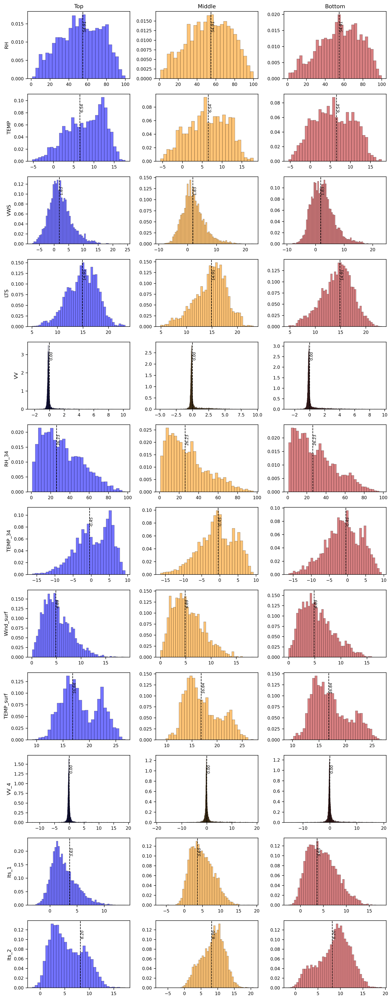

In [67]:
import matplotlib.pyplot as plt

# ===== total median for each variable (use total as threshold) =====
total_median={}
for vname,dcat in vars_by_cat:
    x=np.asarray(dcat.get("total",[]),float); x=x[np.isfinite(x)]
    total_median[vname]=0.0 if vname in ("VV","VV_4") else (float(np.nanmedian(x)) if x.size else np.nan)

nrows,ncols=len(vars_by_cat),3
fig,axes=plt.subplots(nrows,ncols,figsize=(10,2.1*nrows),dpi=300)

for i,(vname,dcat) in enumerate(vars_by_cat):
    med=total_median.get(vname,np.nan)
    for j,c in enumerate(cats):
        ax=axes[i,j]
        x=np.asarray(dcat.get(c,[]),float); x=x[np.isfinite(x)]
        if x.size==0: ax.axis("off"); continue

        h,b,_=ax.hist(x,bins="auto",density=True,color=cat_colors[c],alpha=0.55,edgecolor="k",linewidth=0.4)

        if np.isfinite(med):
            ax.axvline(med,color="k",ls="--",lw=1.0,zorder=3)
            ymax=h.max() if len(h) else ax.get_ylim()[1]
            ax.text(med,ymax*0.9,f"{med:.2f}",rotation=90,ha="left",va="top",fontsize=7,color="k")

        if i==0: ax.set_title(c.capitalize(),fontsize=10)
        if j==0: ax.set_ylabel(vname,fontsize=9)
        ax.tick_params(labelsize=8)

plt.tight_layout()
plt.show()


## 2d bin of mete, dust and cloud variabels

In [ ]:
import numpy as np

# ======== 12 个气象变量（x 轴）========
met_vars = {
    "RH": RH_by_cat,
    "TEMP": TEMP_by_cat,
    "VWS": VWS_by_cat,
    "LTS": LTS_by_cat,
    "VV": VV_by_cat,
    "RH_34": RH_34_by_cat,
    "TEMP_34": TEMP_34_by_cat,
    "Wind_surf": Wind_surf_by_cat,
    "TEMP_surf": TEMP_surf_by_cat,
    "VV_4": VV_4_by_cat,
    "lts_1": lts_1_by_cat,
    "lts_2": lts_2_by_cat,
}

# ======== 云变量（颜色）========
cloud_vars = {"COD": COD_by_cat, "LWP": lwp_by_cat, "Re": re_by_cat}

# ======== 固定范围 ========
y_lim = (0.0, 0.02)  # DOD
z_lims = {"COD": (0.0, 5.0), "LWP": (0.0, 200.0), "Re": (0.0, 400.0)}

# ======== x 的自动 edges：稳健取 1–99% 防极值拉伸 ========
def _xedges_auto(x, nb=36):
    x = np.asarray(x).ravel()
    x = x[np.isfinite(x)]
    if x.size == 0:
        return None
    lo, hi = np.nanpercentile(x, [1, 99])
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
        lo, hi = np.nanmin(x), np.nanmax(x)
    if hi <= lo:
        hi = lo + 1.0
    return np.linspace(lo, hi, nb + 1)

# ======== y(DOD) 固定 edges ========
def _yedges_fixed(nb=36):
    return np.linspace(y_lim[0], y_lim[1], nb + 1)

# ======== 2D 分箱：每个 (x_bin, y_bin) 里对 z 求均值 ========
def _binned_mean_2d(x, y, z, xedges, yedges):
    x = np.asarray(x).ravel()
    y = np.asarray(y).ravel()
    z = np.asarray(z).ravel()

    m = np.isfinite(x) & np.isfinite(y) & np.isfinite(z)
    x = x[m]; y = y[m]; z = z[m]

    xi = np.digitize(x, xedges) - 1
    yi = np.digitize(y, yedges) - 1
    nx, ny = len(xedges) - 1, len(yedges) - 1

    ok = (xi >= 0) & (xi < nx) & (yi >= 0) & (yi < ny)
    xi = xi[ok]; yi = yi[ok]; z = z[ok]

    s = np.zeros((ny, nx), float)
    c = np.zeros((ny, nx), int)
    np.add.at(s, (yi, xi), z)
    np.add.at(c, (yi, xi), 1)

    out = s / np.where(c == 0, np.nan, c)
    out[c == 0] = np.nan
    return out


In [ ]:
import matplotlib.pyplot as plt

cat = "bottom"   # 改成 "middle" / "bottom" 直接复用
cols = ["COD", "LWP", "Re"]

y = np.asarray(DOD_by_cat[cat]).ravel()
yedges = _yedges_fixed(nb=36)

nrows, ncols = len(met_vars), 3
fig, axes = plt.subplots(
    nrows, ncols,
    figsize=(10, 2.2 * nrows),
    dpi=300,
    sharex=False,     # 关键：不共用 x 轴
    sharey=True
)

for i, (met_name, met_dict) in enumerate(met_vars.items()):
    x = np.asarray(met_dict[cat]).ravel()
    xedges = _xedges_auto(x, nb=36)

    if xedges is None or np.isfinite(x).sum() == 0:
        for j in range(ncols):
            axes[i, j].axis("off")
        continue

    for j, col_name in enumerate(cols):
        ax = axes[i, j]
        z = np.asarray(cloud_vars[col_name][cat]).ravel()
        zmin, zmax = z_lims[col_name]

        M = _binned_mean_2d(x, y, z, xedges, yedges)
        pm = ax.pcolormesh(
            xedges, yedges, M,
            shading="auto",
            vmin=zmin, vmax=zmax
        )

        ax.set_ylim(*y_lim)
        ax.set_xlabel(met_name, fontsize=9)   # 每个子图都有 x 轴标签
        if j == 0:
            ax.set_ylabel("DOD", fontsize=9)

        if i == 0:
            ax.set_title(col_name, fontsize=10)

        ax.tick_params(labelsize=8)

        cb = plt.colorbar(pm, ax=ax, pad=0.01, shrink=0.90)
        cb.set_label(col_name, fontsize=8)
        cb.ax.tick_params(labelsize=7)

plt.tight_layout()
plt.show()



## PDF of LWP, COD, Re, CGT, DOD, Cf

In [ ]:
import numpy as np
from collections import defaultdict

CATS = ['top','bottom','middle','decreasing','increasing']
RAIN_THRESH = 0.1  # mm/h

def _split_rain_norain(x, rr, thresh=RAIN_THRESH):
    """根据降水阈值将数组 x 拆成 rain / norain 两组。"""
    x = np.asarray(x, float)
    rr = np.asarray(rr, float)
    n = min(len(x), len(rr))
    x, rr = x[:n], rr[:n]
    mask = np.isfinite(x) & np.isfinite(rr)
    rain_mask = mask & (rr >= thresh)
    norain_mask = mask & (rr <  thresh)
    return x[rain_mask], x[norain_mask]

def prepare_data(lwp_by_cat, COD_by_cat, re_by_cat, RR_by_cat,
                 cloud_tn_by_cat, DOD_by_cat, cf_by_cat):
    """
    将 LWP / COD / Re / CloudTn / DOD / CF 六个变量都按是否降水分组，并生成 total。
    """
    vars_and_srcs = {
        'LWP':     lwp_by_cat,
        'COD':     COD_by_cat,
        'Re':      re_by_cat,
        'CloudTn': cloud_tn_by_cat,  # 云几何厚度
        'DOD':     DOD_by_cat,       # Dust Optical Depth
        'CF':      cf_by_cat,        # Cloud Fraction
    }

    data = {v: {'rain': {}, 'norain': {}} for v in vars_and_srcs.keys()}

    for var, src in vars_and_srcs.items():
        for c in CATS:
            rain, norain = _split_rain_norain(src[c], RR_by_cat[c])
            data[var]['rain'][c]   = rain
            data[var]['norain'][c] = norain

        # 合并 total（只拼接非空数组）
        rain_list   = [data[var]['rain'][c]   for c in CATS if data[var]['rain'][c].size   > 0]
        norain_list = [data[var]['norain'][c] for c in CATS if data[var]['norain'][c].size > 0]
        data[var]['rain']['total']   = np.concatenate(rain_list)   if len(rain_list)   else np.array([], float)
        data[var]['norain']['total'] = np.concatenate(norain_list) if len(norain_list) else np.array([], float)

    return data

# === 生成 processed ===
processed = prepare_data(
    lwp_by_cat, COD_by_cat, re_by_cat, RR_by_cat,
    cloud_tn_by_cat, DOD_by_cat, cf_by_cat
)


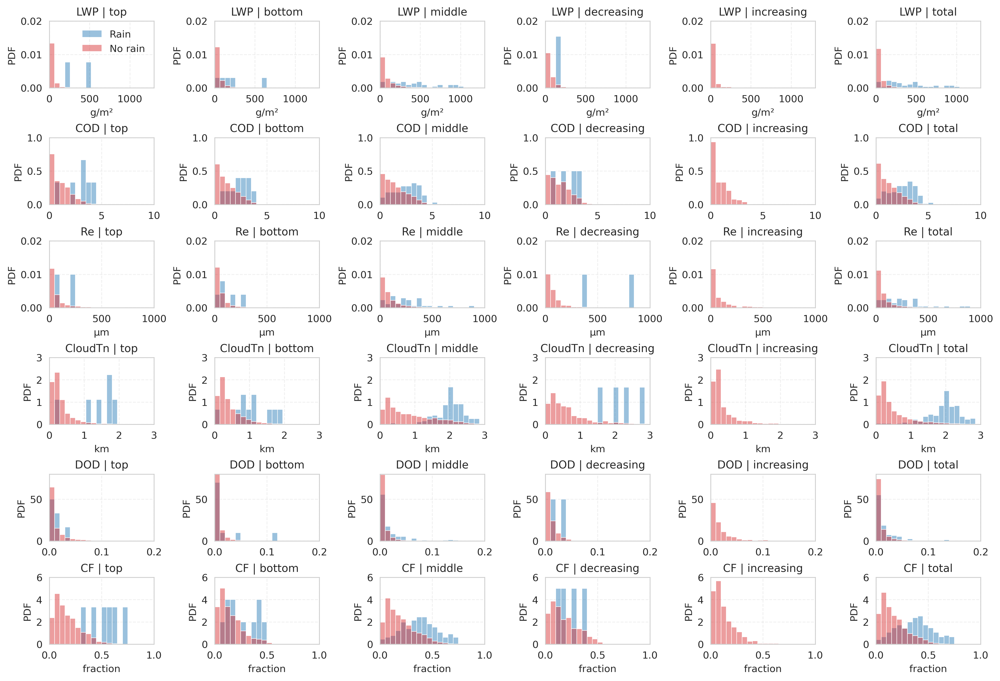

In [164]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_style("whitegrid")

# 六个变量 + total
CATS_PLUS_TOTAL = ['top','bottom','middle','decreasing','increasing','total']
VARS = ['LWP','COD','Re','CloudTn','DOD','CF']

# 每一行（变量）的固定范围 & bin 数（可按需要微调）
cfg = {
    'LWP'    : {'xlim': (0, 1300), 'ylim': (0, 0.02),  'bins': 20, 'xlabel': 'g/m²'},
    'COD'    : {'xlim': (0,   10), 'ylim': (0, 1.00),  'bins': 20, 'xlabel': ''},
    'Re'     : {'xlim': (0, 1000), 'ylim': (0, 0.02),  'bins': 20, 'xlabel': 'µm'},
    'CloudTn': {'xlim': (0,    3), 'ylim': (0, 3),     'bins': 20, 'xlabel': 'km'},
    'DOD'    : {'xlim': (0,  0.2), 'ylim': (0, 80.0),  'bins': 20, 'xlabel': ''},
    'CF'     : {'xlim': (0,  1.0), 'ylim': (0, 6.0),   'bins': 20, 'xlabel': 'fraction'},
}

# 生成统一 bin 边界
bin_edges = {
    var: np.linspace(cfg[var]['xlim'][0], cfg[var]['xlim'][1], cfg[var]['bins'] + 1)
    for var in VARS
}

# 绘图画布：6 行 × 6 列（变量 × 类别+total）
fig, axes = plt.subplots(len(VARS), len(CATS_PLUS_TOTAL),
                         figsize=(14, 9.5), dpi=300, constrained_layout=True)

for i, var in enumerate(VARS):
    xlow, xhigh = cfg[var]['xlim']
    ylow, yhigh = cfg[var]['ylim']
    bins = bin_edges[var]

    for j, cat in enumerate(CATS_PLUS_TOTAL):
        ax = axes[i, j]
        rain   = processed[var]['rain'][cat]
        norain = processed[var]['norain'][cat]

        # 过滤 NaN 和范围外数据
        if rain.size:
            rain = rain[np.isfinite(rain) & (rain >= xlow) & (rain <= xhigh)]
        if norain.size:
            norain = norain[np.isfinite(norain) & (norain >= xlow) & (norain <= xhigh)]

        # 绘制直方图
        if rain.size > 0:
            sns.histplot(
                rain, ax=ax, bins=bins, stat='density',
                color="#1f77b4", alpha=0.45, edgecolor=None,
                label="Rain" if (i == 0 and j == 0) else ""
            )
        if norain.size > 0:
            sns.histplot(
                norain, ax=ax, bins=bins, stat='density',
                color="#d62728", alpha=0.45, edgecolor=None,
                label="No rain" if (i == 0 and j == 0) else ""
            )

        ax.set_xlim(xlow, xhigh)
        ax.set_ylim(ylow, yhigh)
        ax.set_title(f"{var} | {cat}", fontsize=11)
        ax.set_ylabel("PDF", fontsize=10)
        ax.set_xlabel(cfg[var]['xlabel'], fontsize=10)
        ax.grid(alpha=0.3, ls="--")

# 左上角只放一次图例
axes[0, 0].legend(frameon=False, fontsize=10)
plt.show()


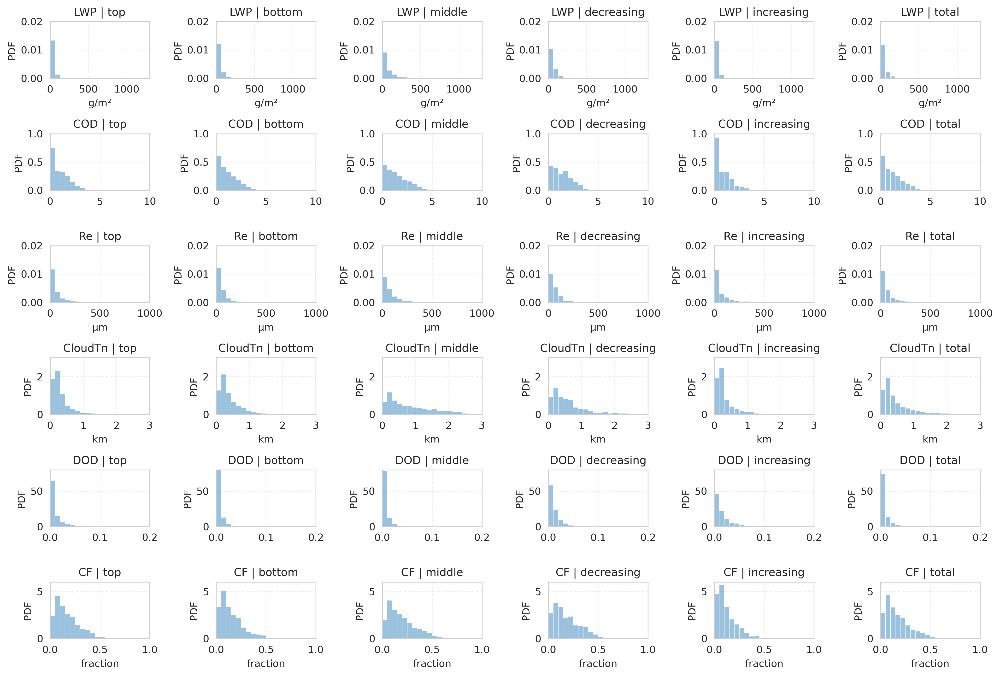

In [165]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

sns.set_style("whitegrid")

CATS_PLUS_TOTAL = ['top','bottom','middle','decreasing','increasing','total']

# 新增 CF
VARS = ['LWP','COD','Re','CloudTn','DOD','CF']

# 各变量范围、bin 数和单位
cfg = {
    'LWP'    : {'xlim': (0, 1300), 'ylim': (0, 0.02),  'bins': 20, 'xlabel': 'g/m²'},
    'COD'    : {'xlim': (0,   10), 'ylim': (0, 1.0),   'bins': 20, 'xlabel': ''},
    'Re'     : {'xlim': (0, 1000), 'ylim': (0, 0.02),  'bins': 20, 'xlabel': 'µm'},
    'CloudTn': {'xlim': (0, 3),    'ylim': (0, 3),     'bins': 20, 'xlabel': 'km'},
    'DOD'    : {'xlim': (0, 0.2),  'ylim': (0, 80),    'bins': 20, 'xlabel': ''},
    'CF'     : {'xlim': (0, 1.0),  'ylim': (0, 6.0),   'bins': 20, 'xlabel': 'fraction'},
}

# 统一 bin 边界
bin_edges = {
    var: np.linspace(cfg[var]['xlim'][0], cfg[var]['xlim'][1], cfg[var]['bins'] + 1)
    for var in VARS
}

# 6 行（变量）× 6 列（类别+total）
fig, axes = plt.subplots(len(VARS), len(CATS_PLUS_TOTAL),
                         figsize=(14, 9.5), dpi=300, constrained_layout=True)

for i, var in enumerate(VARS):
    xlow, xhigh = cfg[var]['xlim']
    ylow, yhigh = cfg[var]['ylim']
    bins = bin_edges[var]

    for j, cat in enumerate(CATS_PLUS_TOTAL):
        ax = axes[i, j]

        # 合并 rain + norain，过滤 NaN 与越界
        arrs = []
        if var in processed and cat in processed[var]['rain']:
            if processed[var]['rain'][cat].size:
                arrs.append(processed[var]['rain'][cat])
        if var in processed and cat in processed[var]['norain']:
            if processed[var]['norain'][cat].size:
                arrs.append(processed[var]['norain'][cat])

        if arrs:
            data_all = np.concatenate(arrs).astype(float, copy=False)
            data_all = data_all[np.isfinite(data_all) & (data_all >= xlow) & (data_all <= xhigh)]
        else:
            data_all = np.array([], dtype=float)

        # 绘制 PDF 直方图
        if data_all.size > 0:
            sns.histplot(
                data_all, ax=ax, bins=bins, stat='density',
                color="#1f77b4", alpha=0.45, edgecolor=None
            )

        ax.set_xlim(xlow, xhigh)
        ax.set_ylim(ylow, yhigh)
        ax.set_title(f"{var} | {cat}", fontsize=11)
        ax.set_ylabel("PDF", fontsize=10)
        ax.set_xlabel(cfg[var]['xlabel'], fontsize=10)
        ax.grid(alpha=0.3, ls="--")

plt.tight_layout()
plt.show()


## Meteorological Variables as a function of DOD (add VV 600hPa);

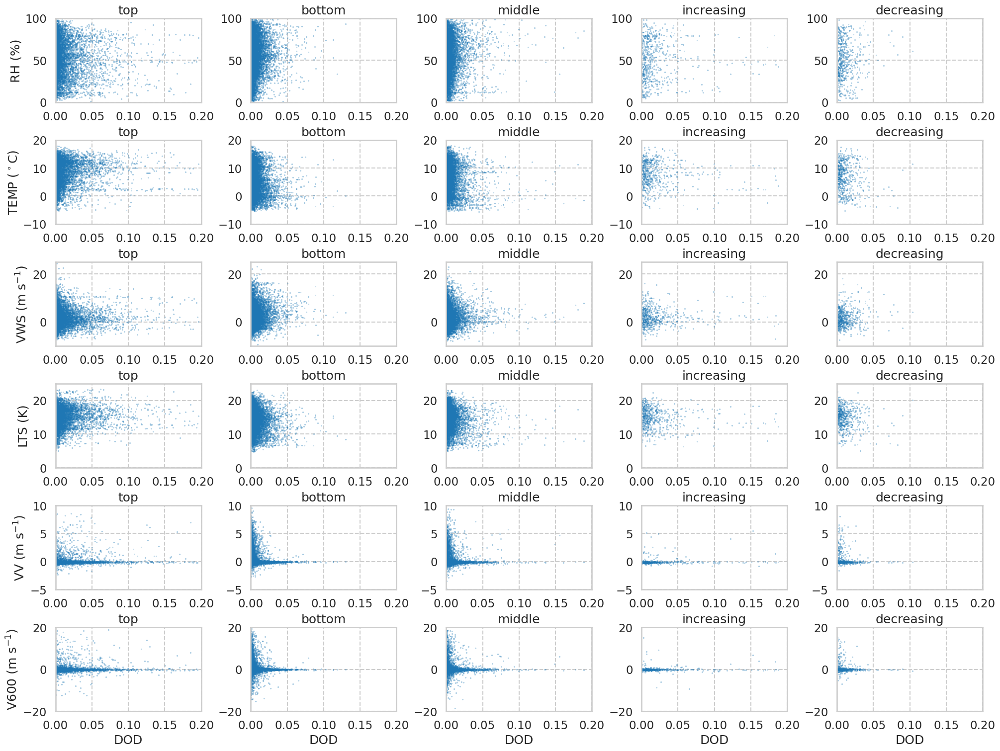

In [166]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set(style="whitegrid", context="talk")

# === 定义变量和类别 ===
CATS = ['top', 'bottom', 'middle', 'increasing', 'decreasing']  # 不含 total
VARS = ['RH', 'TEMP', 'VWS', 'LTS', 'VV', 'VV_4']
BY_CAT = [RH_by_cat, TEMP_by_cat, VWS_by_cat, LTS_by_cat, VV_by_cat, VV_4_by_cat]

# === 各行对应的y轴范围与单位 ===
YLIMS = [
    (0, 100),      # RH
    (-10, 20),     # TEMP
    (-10, 25),     # VWS
    (0, 25),       # LTS
    (-5, 10),      # VV
    (-20, 20)      # V600
]

YUNITS = [
    "(%)",          # RH
    "($^\circ$C)",  # TEMP
    "(m s$^{-1}$)", # VWS
    "(K)",          # LTS
    "(m s$^{-1}$)", # VV
    "(m s$^{-1}$)"  # V600
]

# === 创建画布 ===
fig, axes = plt.subplots(6, 5, figsize=(20, 15), constrained_layout=True)

# === 循环绘制 ===
for i, (var, var_dict) in enumerate(zip(VARS, BY_CAT)):
    for j, cat in enumerate(CATS):
        ax = axes[i, j]
        ax.set_xlim(0, 0.2)
        ax.set_ylim(YLIMS[i])
        ax.grid(ls = '--',)
        if cat in var_dict and cat in DOD_by_cat:
            x = DOD_by_cat[cat]
            y = var_dict[cat]

            if len(x) == len(y):
                ax.scatter(x, y, alpha=0.5, s=0.3, color="tab:blue")

        # 坐标轴标签
        if i == 5:
            ax.set_xlabel("DOD")
        else:
            ax.set_xlabel("")

        if j == 0:
            ax.set_ylabel(f"{var} {YUNITS[i]}")
        else:
            ax.set_ylabel("")

        ax.set_title(f"{cat}")

plt.show()


## UV_wind Rose Diagram

In [167]:
ds_uv = xr.open_dataset('/data/ggong/ARM_monthly/ENA/UV_wind_2min.nc')
uwind = ds_uv.u_wind.values
vwind = ds_uv.v_wind.values

mask = ~np.isnan(uwind) & ~np.isnan(vwind)
uwind_valid = uwind[mask]
vwind_valid = vwind[mask]

In [168]:
uwind_surf_by_cat = {}
vwind_surf_by_cat = {}
uwind_850_by_cat = {}
vwind_850_by_cat = {}
uwind_750_by_cat = {}
vwind_750_by_cat = {}
for name in cat_names:
    
    lab_id = class_map[name]
    
    uwind_surf_by_cat[name]    = extract_event_means(labels, uwind[:,0], lab_id)
    vwind_surf_by_cat[name]    = extract_event_means(labels, vwind[:,0], lab_id)
    uwind_850_by_cat[name]    = extract_event_means(labels, uwind[:,1], lab_id)
    vwind_850_by_cat[name]    = extract_event_means(labels, vwind[:,1], lab_id)
    uwind_750_by_cat[name]    = extract_event_means(labels, uwind[:,2], lab_id)
    vwind_750_by_cat[name]    = extract_event_means(labels, vwind[:,2], lab_id)

In [169]:
import numpy as np

# 你的类别顺序（5列）
CAT_ORDER = ['top', 'bottom', 'middle', 'increasing', 'decreasing']

# 三个高度的标题
TITLE_MAP = {'surf': 'Surface', '850': '850 hPa', '750': '750 hPa'}

# === 风向/风速计算 ===
def uv_to_dir_speed(u, v):
    """
    输入: u, v (可含 NaN)
    输出: directions_deg (0~360, 气象"来自"方向), speed
    约定: 0/360 = 北风, 90 = 东风，顺时针递增
    """
    u = np.asarray(u)
    v = np.asarray(v)
    mask = (~np.isnan(u)) & (~np.isnan(v))
    u = u[mask]
    v = v[mask]
    if u.size == 0:
        return np.array([]), np.array([])
    dirs = (270.0 - np.degrees(np.arctan2(v, u))) % 360.0
    spd = np.hypot(u, v)
    return dirs, spd

def build_dirs_spd_by_level_cat(uw_by_cat, vw_by_cat, cats):
    """
    输入: 同一高度下两个字典 {cat: array}，分别是 u 与 v
    输出: dirs_by_cat, spd_by_cat 两个字典
    """
    dirs_by_cat, spd_by_cat = {}, {}
    for cat in cats:
        u = uw_by_cat.get(cat, np.array([]))
        v = vw_by_cat.get(cat, np.array([]))
        d, s = uv_to_dir_speed(u, v)
        dirs_by_cat[cat] = d
        spd_by_cat[cat]  = s
    return dirs_by_cat, spd_by_cat

# 依赖你已有的 6 个字典变量：
# uwind_surf_by_cat, vwind_surf_by_cat
# uwind_850_by_cat,  vwind_850_by_cat
# uwind_750_by_cat,  vwind_750_by_cat

dirs_surf_by_cat, spd_surf_by_cat = build_dirs_spd_by_level_cat(uwind_surf_by_cat, vwind_surf_by_cat, CAT_ORDER)
dirs_850_by_cat,  spd_850_by_cat  = build_dirs_spd_by_level_cat(uwind_850_by_cat,  vwind_850_by_cat,  CAT_ORDER)
dirs_750_by_cat,  spd_750_by_cat  = build_dirs_spd_by_level_cat(uwind_750_by_cat,  vwind_750_by_cat,  CAT_ORDER)

# 汇总，供绘图块使用
DIRS_BY_LEVEL = {'surf': dirs_surf_by_cat, '850': dirs_850_by_cat, '750': dirs_750_by_cat}
SPD_BY_LEVEL  = {'surf': spd_surf_by_cat,  '850': spd_850_by_cat,  '750': spd_750_by_cat}


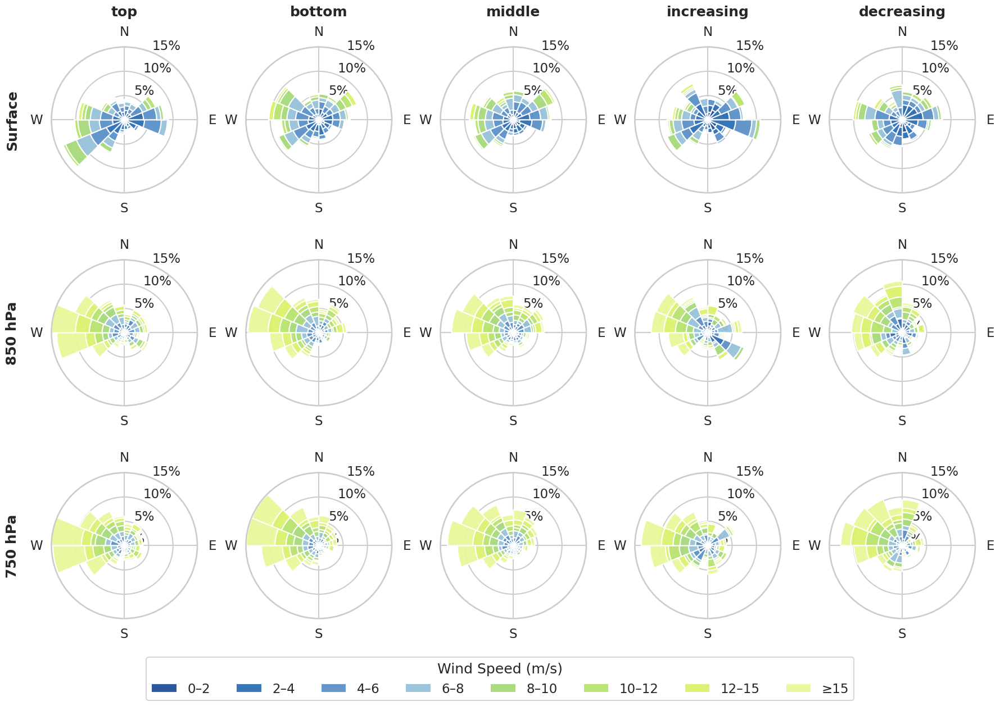

In [170]:
import numpy as np
import matplotlib.pyplot as plt

# —— 配置 ——
DIR_BINS = 16
CALM_THR = 0.5

# 8 档风速（单位 m/s）
SPEED_BINS   = np.array([0, 2, 4, 6, 8, 10, 12, 15, np.inf])
SPEED_LABELS = ["0–2", "2–4", "4–6", "6–8", "8–10", "10–12", "12–15", "≥15"]
SPEED_COLORS = ["#1f4e99", "#2e6fb5", "#5b91c9", "#97c1d9",
                "#a7d97a", "#b7e36c", "#d9f26c", "#e8f79a"]
BAR_EDGE = "white"
ALPHA = 0.95

# 统一半径范围与刻度：0–18%，刻度 0/6/12/18
R_MAX  = 15.0
YTK    = [0, 5, 10, 15]

def sector_hist_by_speed(dirs_deg, spd, dir_bins, speed_bins, calm_thr=0.5):
    calm_mask = spd < calm_thr
    n_total   = spd.size
    dirs = dirs_deg[~calm_mask]
    vv   = spd[~calm_mask]

    dir_edges = np.linspace(0, 360, dir_bins + 1)
    theta = np.deg2rad((dir_edges[:-1] + dir_edges[1:]) / 2.0)
    width = 2 * np.pi / dir_bins

    counts = np.zeros((dir_bins, len(speed_bins) - 1), dtype=float)
    if vv.size > 0:
        sector_idx = np.digitize(dirs, dir_edges, right=False) - 1
        sector_idx[sector_idx == dir_bins] = dir_bins - 1
        spd_idx = np.digitize(vv, speed_bins, right=False) - 1
        spd_idx = np.clip(spd_idx, 0, len(speed_bins) - 2)
        for si, bi in zip(sector_idx, spd_idx):
            counts[si, bi] += 1.0

    if n_total > 0:
        counts = counts / n_total * 100.0
    return counts, theta, width

def plot_stacked_wind_rose(ax, dirs_deg, spd, title=None):
    if dirs_deg.size == 0:
        ax.text(0.5, 0.5, "No data", ha='center', va='center', transform=ax.transAxes)
        ax.set_axis_off()
        return []

    counts, theta, width = sector_hist_by_speed(dirs_deg, spd, DIR_BINS, SPEED_BINS, CALM_THR)

    # 极坐标设置：北为0°、顺时针
    ax.set_theta_zero_location('N')
    ax.set_theta_direction(-1)

    # 把度数刻度替换为 N/E/S/W，并稍微往外推，避免与图形/标题重叠
    ax.set_thetagrids([0, 90, 180, 270], labels=['N', 'E', 'S', 'W'])  # 方位刻度
    # ax.tick_params(axis='x', pad=6)  # 往外推，避免与标题/图形重叠


    # 堆叠条形
    bottom = np.zeros(counts.shape[0], dtype=float)
    handles = []
    for k in range(counts.shape[1]):
        vals = counts[:, k]
        bars = ax.bar(theta, vals, width=width, bottom=bottom,
                      align='center', color=SPEED_COLORS[k],
                      edgecolor=BAR_EDGE, alpha=ALPHA)
        bottom += vals
        handles.append(bars[0])

    # 统一半径与刻度
    ax.set_ylim(0, R_MAX)
    ax.set_yticks(YTK)
    ax.set_yticklabels([f"{t}%" for t in YTK])

    # 不显示中心 calm 百分比（已移除）
    if title:
        ax.set_title(title, pad=40, fontweight='bold')  # pad 加大，避免与方位字母干扰
    return handles

# ——— 绘制 3×5 子图；关闭 constrained_layout 自己调边距，防重叠 ———
heights = ['surf', '850', '750']
fig, axes = plt.subplots(
    nrows=3, ncols=5, subplot_kw={'projection': 'polar'},
    figsize=(18, 12), constrained_layout=False
)

legend_handles = None
for i, h in enumerate(heights):
    for j, cat in enumerate(CAT_ORDER):
        ax = axes[i, j]
        dirs = np.asarray(DIRS_BY_LEVEL[h].get(cat, np.array([])))
        spd  = np.asarray(SPD_BY_LEVEL[h].get(cat,  np.array([])))
        handles = plot_stacked_wind_rose(ax, dirs, spd, title=(cat if i == 0 else None))
        if legend_handles is None and handles:
            legend_handles = handles
    # 行标题：向外留距离，避免与极坐标网格重叠
    axes[i, 0].set_ylabel(TITLE_MAP[h], labelpad=50, rotation=90, va='center',fontweight='bold')

# 顶/底/左右边距，给底部单行图例留空间
fig.subplots_adjust(left=0.05, right=0.98, top=0.90, bottom=0.12)

# —— 底部单行图例（不显示百分比）——
fig.legend(legend_handles, SPEED_LABELS,
           loc='lower center', bbox_to_anchor=(0.5, -0.07),
           ncol=len(SPEED_LABELS), title="Wind Speed (m/s)")
plt.tight_layout()

plt.show()
